In [1]:
from datetime import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from prophet import Prophet

from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
from sklearn import metrics


## Lectura y limpieza de datos
- lectura del .csv
- vista de los tipos de datos en DF original
- Creacion del df_todos que es identico al original, pero solo con las 4 columnas importantes

DF hasta noviembre (entrenamiento)
DF del mes de noviembre (testeo)
- Luego se crean otros 2 DF partiendo de las 2 anteriores:
  -  con las sumatorias de las ventas por dia



In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
pd.set_option('display.float_format', '{:.4f}'.format)


In [4]:
# si se importa desde Drive
file_path = '/content/drive/MyDrive/DIPLOMADO/Proy_Final/datos/tabla_13_modif_top10ventas_nov.csv'
# si se importa subiendo el archivo
# file_name = "tabla_11_modif_top10ventas_nov.csv"
df = pd.read_csv(file_path)
df.head()

,CodigoSucursal,CodigoDepartamento,CodigoEstado,TipoMovimiento,DescripcionMovimiento,NumeroMovimiento,NumeroCorrelativo,FechaMovimiento,NombreProducto,UnidadMedida,CantidadSalida,PesoSalida,MontoBase,PrecioUnitario,CostoUnitario,MontoReferencia,NombreGrupo
0,13,1,AC,SVE,VENTA COMPUTARIZADA,18112062,0,2018-11-16 07:02:58,PIERNA MUSLO OFERTA,KG,0.0000,1.0433,14.6280,12.8800,12.8800,2.1013,TROZADO
1,13,1,AC,SVE,VENTA COMPUTARIZADA,18112055,0,2018-11-15 12:53:48,FILETE A GRANEL,KG,0.0000,1.9826,47.0120,21.8040,21.8040,6.7546,TROZADO
2,13,1,AC,SVE,VENTA COMPUTARIZADA,18112052,0,2018-11-15 12:12:18,FILETE A GRANEL,KG,0.0000,1.9246,45.6320,21.8040,21.8040,6.5559,TROZADO
3,13,1,AC,SVE,VENTA COMPUTARIZADA,18112050,0,2018-11-15 12:09:52,FILETE A GRANEL,KG,0.0000,0.8418,19.9640,21.8040,21.8040,2.8686,TROZADO
4,13,1,AC,SVE,VENTA COMPUTARIZADA,18112049,0,2018-11-15 12:05:05,PIERNA,KG,0.0000,0.1334,2.1160,14.7200,14.7200,0.3036,TROZADO


In [5]:
df['FechaMovimiento'] = pd.to_datetime(df['FechaMovimiento'])
df['year'] = df['FechaMovimiento'].dt.year
df.dtypes

CodigoSucursal                    int64
CodigoDepartamento                int64
CodigoEstado                     object
TipoMovimiento                   object
DescripcionMovimiento            object
NumeroMovimiento                  int64
NumeroCorrelativo                 int64
FechaMovimiento          datetime64[ns]
NombreProducto                   object
UnidadMedida                     object
CantidadSalida                  float64
PesoSalida                      float64
MontoBase                       float64
PrecioUnitario                  float64
CostoUnitario                   float64
MontoReferencia                 float64
NombreGrupo                      object
year                              int64
dtype: object

In [6]:
df_todo = df[['NombreProducto',
              'FechaMovimiento',
              'MontoBase',
              'year'
              ]]

In [7]:
#df_todo = df_todo.rename(columns={'FechaMovimiento': 'ds', 'MontoBase': 'y'})
df_todo.sort_values(by='FechaMovimiento', inplace=True)

<ipython-input-7-3f20b1242116>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_todo.sort_values(by='FechaMovimiento', inplace=True)


In [8]:
# Filtrar los registros de noviembre 2023
df_noviembre = df_todo[(df_todo['FechaMovimiento'] >= '2023-11-01') & (df_todo['FechaMovimiento'] <= '2023-12-01')]

# Restar los registros de noviembre del conjunto original
df_todo_hasta_nov = df_todo[df_todo['FechaMovimiento'] < '2023-11-01']

df_todo = df_todo[df_todo['FechaMovimiento'] < '2023-12-01']

In [9]:
print("todo ", df_todo.shape)
print("sin noviembre ", df_todo_hasta_nov.shape)
print("noviembre 2023 ", df_noviembre.shape)

todo  (206029, 4)
sin noviembre  (203613, 4)
noviembre 2023  (2416, 4)


In [10]:
df_noviembre.head()

,NombreProducto,FechaMovimiento,MontoBase,year
120927,PIERNA MUSLO,2023-11-01 07:21:12,21.9512,2023
206231,POLLO ESPECIAL,2023-11-01 07:24:55,25.4006,2023
120926,PECHUGA,2023-11-01 07:27:01,40.6456,2023
206230,POLLO SIN MENUDENCIA H-C,2023-11-01 07:37:40,26.8691,2023
206229,POLLO SIN MENUDENCIA H-C,2023-11-01 07:45:05,28.0528,2023


## EVALUACION

In [11]:
def evaluacion_metrica(y_true, y_pred):

    def mean_absolute_percentage_error(y_true, y_pred):
        # Filtrar valores donde y_true es distinto de 0
        non_zero_indices = np.where(y_true != 0)
        y_true, y_pred = np.array(y_true)[non_zero_indices], np.array(y_pred)[non_zero_indices]

        if len(y_true) == 0:
            # Si no hay valores válidos, retornar un valor especial (por ejemplo, np.nan)
            return np.nan

        # Calcular MAPE solo para los valores válidos
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

    # Contar valores reales y omitidos
    total_dias = len(y_true)
    dias_reales = np.sum(y_true != 0)
    dias_omitidos = total_dias - dias_reales

    print('Evaluation metric results:  ')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
    print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)} %',end='\n')
    print("---"*10)
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
    print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)} %')
    print("---"*10)
    print("---" * 10)
    print(f'Días reales calculados: {dias_reales}')
    print(f'Días omitidos: {dias_omitidos}')
    print(f'Total de días: {total_dias}')
    print("---" * 10)
    print("\n")

In [12]:
def evaluacion_metrica_todos_los_valores(y_true, y_pred):

    def mean_absolute_percentage_error(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    print('Evaluation metric results:-')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
    print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)} %',end='\n')
    print("---"*10)
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
    print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)} %')
    print("---"*10)
print("\n\n")

# 10 Productos


In [13]:
## Sumar las ventas por día en df_noviembre
# Primero cambiamos la columna ds a datatime
df_noviembre['FechaMovimiento'] = pd.to_datetime(df_noviembre['FechaMovimiento'])
df_todo_hasta_nov['FechaMovimiento'] = pd.to_datetime(df_todo_hasta_nov['FechaMovimiento'])
# se quitan las horas de la columna de tiempo
df_noviembre['FechaMovimiento'] = df_noviembre['FechaMovimiento'].dt.date
df_todo_hasta_nov['FechaMovimiento'] = df_todo_hasta_nov['FechaMovimiento'].dt.date
# se suman todas las ventas por dia
# df_noviembre_prophet = df_noviembre.groupby('FechaMovimiento')['MontoBase'].sum().reset_index()
# df_todo_hasta_nov_prophet = df_todo_hasta_nov.groupby('FechaMovimiento')['MontoBase'].sum().reset_index()

# df_noviembre_prophet = df_noviembre_prophet.rename(columns={'FechaMovimiento': 'ds', 'MontoBase': 'y'})
# df_todo_hasta_nov_prophet = df_todo_hasta_nov_prophet.rename(columns={'FechaMovimiento': 'ds', 'MontoBase': 'y'})

print(df_noviembre.head)
print(df_noviembre.dtypes)
print(df_todo_hasta_nov.head)
print(df_todo_hasta_nov.dtypes)
# print("----Prophet----")
# print(df_noviembre_prophet.head)
# print(df_noviembre_prophet.dtypes)
# print(df_todo_hasta_nov_prophet.head)
# print(df_todo_hasta_nov_prophet.dtypes)

<bound method NDFrame.head of                   NombreProducto FechaMovimiento  MontoBase  year
120927              PIERNA MUSLO      2023-11-01    21.9512  2023
206231            POLLO ESPECIAL      2023-11-01    25.4006  2023
120926                   PECHUGA      2023-11-01    40.6456  2023
206230  POLLO SIN MENUDENCIA H-C      2023-11-01    26.8691  2023
206229  POLLO SIN MENUDENCIA H-C      2023-11-01    28.0528  2023
...                          ...             ...        ...   ...
121750               ALA PRIMERA      2023-11-30     3.3304  2023
205336  POLLO SIN MENUDENCIA H-C      2023-11-30    29.1386  2023
205335            POLLO ESPECIAL      2023-11-30   120.9510  2023
121748               ALA PRIMERA      2023-11-30    16.6520  2023
205334            POLLO ESPECIAL      2023-11-30    53.4890  2023

[2416 rows x 4 columns]>
NombreProducto      object
FechaMovimiento     object
MontoBase          float64
year                 int64
dtype: object
<bound method NDFrame.head of 

In [14]:
df_todo_hasta_nov['FechaMovimiento'] = pd.to_datetime(df_todo_hasta_nov['FechaMovimiento'])

df_todo_hasta_nov_sin_2020 = df_todo_hasta_nov[~(df_todo_hasta_nov['FechaMovimiento'].dt.year == 2020)]

print(df_todo_hasta_nov_sin_2020.head())
print(df_todo_hasta_nov_sin_2020.dtypes)
print("todo hasta nov")
print(df_todo_hasta_nov.dtypes)

# se devuelve el tipo object a FechaMovimiento para prophet
df_todo_hasta_nov['FechaMovimiento'] = df_todo_hasta_nov['FechaMovimiento'].dt.date
#df_todo_hasta_nov_sin_2020['FechaMovimiento'] = df_todo_hasta_nov_sin_2020['FechaMovimiento'].dt.date

print("todo hasta nov")
print(df_todo_hasta_nov.dtypes)

print("---" *10)
print(df_todo_hasta_nov_sin_2020.head())
print(df_todo_hasta_nov_sin_2020.dtypes)
print(df_todo_hasta_nov_sin_2020.shape)

             NombreProducto FechaMovimiento  MontoBase  year
1267        FILETE A GRANEL      2018-11-01    47.1960  2018
122360       POLLO ESPECIAL      2018-11-01   120.1500  2018
1266    PIERNA MUSLO OFERTA      2018-11-01    66.2400  2018
1265    PIERNA MUSLO OFERTA      2018-11-01    44.7120  2018
1263                 PIERNA      2018-11-01     5.0600  2018
NombreProducto             object
FechaMovimiento    datetime64[ns]
MontoBase                 float64
year                        int64
dtype: object
todo hasta nov
NombreProducto             object
FechaMovimiento    datetime64[ns]
MontoBase                 float64
year                        int64
dtype: object
todo hasta nov
NombreProducto      object
FechaMovimiento     object
MontoBase          float64
year                 int64
dtype: object
------------------------------
             NombreProducto FechaMovimiento  MontoBase  year
1267        FILETE A GRANEL      2018-11-01    47.1960  2018
122360       POLLO ESPECIAL  

### Creacion de objetos que contienen 10 DF c/u con los productos mas vendidos

In [35]:
# Obtener los 10 productos más vendidos
top_10_products = df_todo['NombreProducto'].value_counts().head(10).index

# Crear un diccionario para almacenar los DataFrames divididos
#dfs_de_productos = {}
dfs_de_productos_sin_2020 = {}

# Iterar sobre los productos y dividir el DataFrame
for product in top_10_products:
    # Crear un DataFrame para el producto actual
#    product_df = df_todo[df_todo['NombreProducto'] == product].copy()
    product_df_sin_2020 = df_todo_hasta_nov_sin_2020[df_todo_hasta_nov_sin_2020['NombreProducto'] == product].copy()

    # Opcional: Puedes establecer la columna de fecha como índice si es relevante para tus análisis
    # product_df.set_index('FechaMovimiento', inplace=True)
    # product_df_sin_2020.set_index('FechaMovimiento', inplace=True)
#    product_df.set_index('FechaMovimiento', inplace=True)
    product_df_sin_2020.set_index('FechaMovimiento', inplace=True)


    # Almacenar el DataFrame en el diccionario
#    dfs_de_productos[product] = product_df
    dfs_de_productos_sin_2020[product] = product_df_sin_2020

print(top_10_products)

Index(['POLLO ESPECIAL', 'POLLO SIN MENUDENCIA H-C', 'PECHUGA', 'PIERNA MUSLO',
       'FILETE A GRANEL', 'PIERNA', 'MUSLO', 'POLLO CON MENUDENCIA H-C',
       'PIERNA MUSLO OFERTA', 'ALA PRIMERA'],
      dtype='object')


In [16]:
# Crear un diccionario para almacenar los DataFrames sumados
dfs_de_productos_sumados = {}

# Iterar sobre los productos en el diccionario original
for product, product_df in dfs_de_productos_sin_2020.items():
    # Sumar las ventas por día sin perder 'NombreProducto' y 'year'
    product_df_sumado = product_df.groupby(['FechaMovimiento', 'NombreProducto', 'year'])['MontoBase'].sum().reset_index()

    # Establecer 'FechaMovimiento' como índice
    #product_df_sumado.set_index('FechaMovimiento', inplace=True)

    # Agregar el DataFrame sumado al nuevo diccionario
    dfs_de_productos_sumados[product] = product_df_sumado


In [17]:
#print(dfs_de_productos_sin_2020)

#print(dfs_de_productos_sumados['POLLO SIN MENUDENCIA H-C'])
print(dfs_de_productos_sin_2020['POLLO SIN MENUDENCIA H-C'].dtypes)
print(dfs_de_productos_sin_2020['POLLO SIN MENUDENCIA H-C'].head)
#print(dfs_de_productos_sumados)


NombreProducto     object
MontoBase         float64
year                int64
dtype: object
<bound method NDFrame.head of                            NombreProducto  MontoBase  year
FechaMovimiento                                           
2018-11-08       POLLO SIN MENUDENCIA H-C    78.4980  2018
2018-11-08       POLLO SIN MENUDENCIA H-C    20.8260  2018
2018-11-08       POLLO SIN MENUDENCIA H-C   146.9390  2018
2018-11-08       POLLO SIN MENUDENCIA H-C    23.0510  2018
2018-11-08       POLLO SIN MENUDENCIA H-C   119.6160  2018
...                                   ...        ...   ...
2023-10-31       POLLO SIN MENUDENCIA H-C    27.5188  2023
2023-10-31       POLLO SIN MENUDENCIA H-C   110.1820  2023
2023-10-31       POLLO SIN MENUDENCIA H-C    87.1132  2023
2023-10-31       POLLO SIN MENUDENCIA H-C    84.7102  2023
2023-10-31       POLLO SIN MENUDENCIA H-C   197.0460  2023

[25557 rows x 3 columns]>


In [18]:
# Resetear el índice sin incluirlo como columna
#product_df.reset_index(drop=True, inplace=True)

In [19]:
# Iterar sobre los productos
for product, product_df in dfs_de_productos_sumados.items():
    # Obtener la última fecha en la columna 'FechaMovimiento'
    last_date = product_df['FechaMovimiento'].max()

    # Verificar si la última fecha es diferente al último día de octubre de 2023
    last_day_oct_2023 = pd.to_datetime('2023-10-31')

    if last_date != last_day_oct_2023:
        # Agregar un nuevo registro con venta 0
        new_row = pd.DataFrame([[product, 2023, 0, last_day_oct_2023]], columns=['NombreProducto', 'year', 'MontoBase', 'FechaMovimiento'])

        # Concatenar el nuevo registro al DataFrame existente
        product_df = pd.concat([product_df, new_row])

        # Ordenar el DataFrame por la fecha
        product_df.sort_values(by=['year', 'NombreProducto', 'FechaMovimiento'], inplace=True)

        # Imprimir información sobre el producto
        print(f"Se agregó un registro de venta 0 para el producto {product} en la fecha {last_day_oct_2023}")

    # Establecer 'FechaMovimiento' como índice después de agregar los registros de venta '0'
    product_df.set_index('FechaMovimiento', inplace=True)
    # Actualizar el DataFrame en el diccionario
    dfs_de_productos_sumados[product] = product_df
    # Resetear el índice antes de clonar
    #product_df.reset_index(inplace=True)

Se agregó un registro de venta 0 para el producto POLLO CON MENUDENCIA H-C en la fecha 2023-10-31 00:00:00
Se agregó un registro de venta 0 para el producto PIERNA MUSLO OFERTA en la fecha 2023-10-31 00:00:00


In [20]:
print(dfs_de_productos_sumados)

{'POLLO ESPECIAL':                  NombreProducto  year  MontoBase
FechaMovimiento                                 
2018-11-01       POLLO ESPECIAL  2018  1140.6240
2018-11-02       POLLO ESPECIAL  2018  1645.2540
2018-11-03       POLLO ESPECIAL  2018   712.9790
2018-11-04       POLLO ESPECIAL  2018  1343.6330
2018-11-05       POLLO ESPECIAL  2018  1755.2580
...                         ...   ...        ...
2023-10-27       POLLO ESPECIAL  2023  2152.1624
2023-10-28       POLLO ESPECIAL  2023  2499.2891
2023-10-29       POLLO ESPECIAL  2023  1611.2471
2023-10-30       POLLO ESPECIAL  2023  3372.2990
2023-10-31       POLLO ESPECIAL  2023  2112.0323

[1411 rows x 3 columns], 'POLLO SIN MENUDENCIA H-C':                            NombreProducto  year  MontoBase
FechaMovimiento                                           
2018-11-08       POLLO SIN MENUDENCIA H-C  2018   533.0210
2018-11-09       POLLO SIN MENUDENCIA H-C  2018   149.0750
2018-11-10       POLLO SIN MENUDENCIA H-C  2018   315.

In [21]:
# unique_products = df_todo['NombreProducto'].unique()
# print(unique_products)

In [22]:
import copy

# Clonar completamente el objeto contenedor de DataFrames sumados
dfs_de_productos_sumados_prophet = copy.deepcopy(dfs_de_productos_sumados)

# Iterar sobre los DataFrames en el nuevo objeto
for product, product_df_prophet in dfs_de_productos_sumados_prophet.items():
    # Cambiar el nombre de las columnas
    product_df_prophet.rename(columns={'MontoBase': 'y'}, inplace=True)

    # Restablecer el índice
    product_df_prophet.reset_index(inplace=True)

    # Cambiar el nombre de la columna 'FechaMovimiento' a 'ds'
    product_df_prophet.rename(columns={'index': 'ds'}, inplace=True)
    product_df_prophet.rename(columns={'FechaMovimiento': 'ds'}, inplace=True)

    # Eliminar la columna 'year'
    product_df_prophet.drop(columns=['year'], inplace=True)

In [23]:
print(dfs_de_productos_sumados['POLLO CON MENUDENCIA H-C'].dtypes)
print(dfs_de_productos_sumados['POLLO CON MENUDENCIA H-C'].head)

NombreProducto     object
year                int64
MontoBase         float64
dtype: object
<bound method NDFrame.head of                            NombreProducto  year  MontoBase
FechaMovimiento                                           
2018-11-08       POLLO CON MENUDENCIA H-C  2018   369.1720
2018-11-10       POLLO CON MENUDENCIA H-C  2018   293.0770
2018-11-11       POLLO CON MENUDENCIA H-C  2018   458.7060
2018-11-12       POLLO CON MENUDENCIA H-C  2018   238.2530
2018-11-13       POLLO CON MENUDENCIA H-C  2018   798.3300
...                                   ...   ...        ...
2023-10-20       POLLO CON MENUDENCIA H-C  2023   435.4058
2023-10-21       POLLO CON MENUDENCIA H-C  2023   242.3203
2023-10-22       POLLO CON MENUDENCIA H-C  2023   329.3979
2023-10-30       POLLO CON MENUDENCIA H-C  2023   470.8990
2023-10-31       POLLO CON MENUDENCIA H-C  2023     0.0000

[757 rows x 3 columns]>


In [24]:
print(dfs_de_productos_sumados_prophet['POLLO CON MENUDENCIA H-C'].dtypes)
print(dfs_de_productos_sumados_prophet['POLLO CON MENUDENCIA H-C'].head)

ds                datetime64[ns]
NombreProducto            object
y                        float64
dtype: object
<bound method NDFrame.head of             ds            NombreProducto        y
0   2018-11-08  POLLO CON MENUDENCIA H-C 369.1720
1   2018-11-10  POLLO CON MENUDENCIA H-C 293.0770
2   2018-11-11  POLLO CON MENUDENCIA H-C 458.7060
3   2018-11-12  POLLO CON MENUDENCIA H-C 238.2530
4   2018-11-13  POLLO CON MENUDENCIA H-C 798.3300
..         ...                       ...      ...
752 2023-10-20  POLLO CON MENUDENCIA H-C 435.4058
753 2023-10-21  POLLO CON MENUDENCIA H-C 242.3203
754 2023-10-22  POLLO CON MENUDENCIA H-C 329.3979
755 2023-10-30  POLLO CON MENUDENCIA H-C 470.8990
756 2023-10-31  POLLO CON MENUDENCIA H-C   0.0000

[757 rows x 3 columns]>


In [25]:
for product, product_df in dfs_de_productos_sumados_prophet.items():
    # Crear un modelo de Prophet
    modelo = Prophet()
    print(product_df)

             ds  NombreProducto         y
0    2018-11-01  POLLO ESPECIAL 1140.6240
1    2018-11-02  POLLO ESPECIAL 1645.2540
2    2018-11-03  POLLO ESPECIAL  712.9790
3    2018-11-04  POLLO ESPECIAL 1343.6330
4    2018-11-05  POLLO ESPECIAL 1755.2580
...         ...             ...       ...
1406 2023-10-27  POLLO ESPECIAL 2152.1624
1407 2023-10-28  POLLO ESPECIAL 2499.2891
1408 2023-10-29  POLLO ESPECIAL 1611.2471
1409 2023-10-30  POLLO ESPECIAL 3372.2990
1410 2023-10-31  POLLO ESPECIAL 2112.0323

[1411 rows x 3 columns]
             ds            NombreProducto         y
0    2018-11-08  POLLO SIN MENUDENCIA H-C  533.0210
1    2018-11-09  POLLO SIN MENUDENCIA H-C  149.0750
2    2018-11-10  POLLO SIN MENUDENCIA H-C  315.6830
3    2018-11-11  POLLO SIN MENUDENCIA H-C  267.1780
4    2018-11-12  POLLO SIN MENUDENCIA H-C  181.6490
...         ...                       ...       ...
1342 2023-10-27  POLLO SIN MENUDENCIA H-C  816.5305
1343 2023-10-28  POLLO SIN MENUDENCIA H-C  927.1219
134

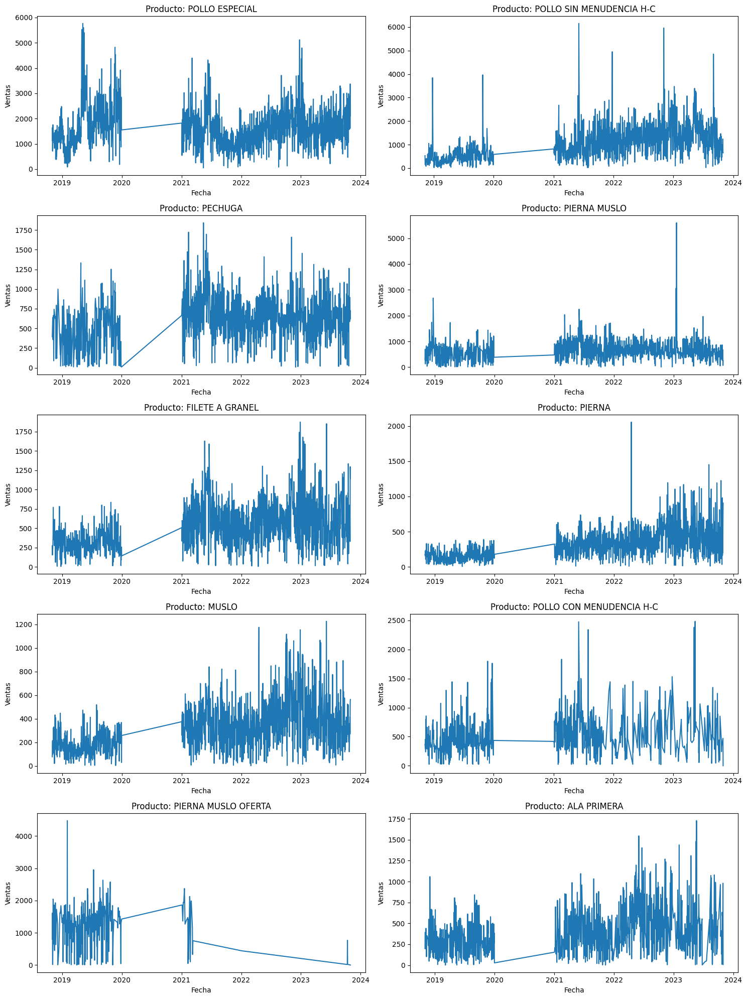

In [26]:
# Crear una figura y ejes para los gráficos
fig, axs = plt.subplots(5, 2, figsize=(15, 20))  # Cambia el tamaño según sea necesario

# Iterar sobre los productos y sus DataFrames
for i, (product, product_df) in enumerate(dfs_de_productos_sumados_prophet.items()):
    # Calcular las coordenadas de los subgráficos
    row, col = divmod(i, 2)

    # Crear un gráfico de líneas para cada producto
    axs[row, col].plot(product_df['ds'], product_df['y'], label=product)
    axs[row, col].set_title(f'Producto: {product}')
    axs[row, col].set_xlabel('Fecha')
    axs[row, col].set_ylabel('Ventas')

# Ajustar el diseño de la figura
plt.tight_layout()
plt.show()

In [27]:
for i, df_product in enumerate(dfs_de_productos_sumados):
    print(f"DataFrame {i + 1} - Tipos de Datos:")
    print(dfs_de_productos_sumados[df_product].dtypes)
    print("=" * 30)

DataFrame 1 - Tipos de Datos:
NombreProducto     object
year                int64
MontoBase         float64
dtype: object
DataFrame 2 - Tipos de Datos:
NombreProducto     object
year                int64
MontoBase         float64
dtype: object
DataFrame 3 - Tipos de Datos:
NombreProducto     object
year                int64
MontoBase         float64
dtype: object
DataFrame 4 - Tipos de Datos:
NombreProducto     object
year                int64
MontoBase         float64
dtype: object
DataFrame 5 - Tipos de Datos:
NombreProducto     object
year                int64
MontoBase         float64
dtype: object
DataFrame 6 - Tipos de Datos:
NombreProducto     object
year                int64
MontoBase         float64
dtype: object
DataFrame 7 - Tipos de Datos:
NombreProducto     object
year                int64
MontoBase         float64
dtype: object
DataFrame 8 - Tipos de Datos:
NombreProducto     object
year                int64
MontoBase         float64
dtype: object
DataFrame 9 - Tipos de D

### clonar para LSTM y ARIMA


In [28]:
dfs_de_productos_sumados

{'POLLO ESPECIAL':                  NombreProducto  year  MontoBase
 FechaMovimiento                                 
 2018-11-01       POLLO ESPECIAL  2018  1140.6240
 2018-11-02       POLLO ESPECIAL  2018  1645.2540
 2018-11-03       POLLO ESPECIAL  2018   712.9790
 2018-11-04       POLLO ESPECIAL  2018  1343.6330
 2018-11-05       POLLO ESPECIAL  2018  1755.2580
 ...                         ...   ...        ...
 2023-10-27       POLLO ESPECIAL  2023  2152.1624
 2023-10-28       POLLO ESPECIAL  2023  2499.2891
 2023-10-29       POLLO ESPECIAL  2023  1611.2471
 2023-10-30       POLLO ESPECIAL  2023  3372.2990
 2023-10-31       POLLO ESPECIAL  2023  2112.0323
 
 [1411 rows x 3 columns],
 'POLLO SIN MENUDENCIA H-C':                            NombreProducto  year  MontoBase
 FechaMovimiento                                           
 2018-11-08       POLLO SIN MENUDENCIA H-C  2018   533.0210
 2018-11-09       POLLO SIN MENUDENCIA H-C  2018   149.0750
 2018-11-10       POLLO SIN MENUDENC

In [29]:
# Clonar completamente el objeto contenedor de DataFrames sumados
dfs_de_productos_sumados_lstm = copy.deepcopy(dfs_de_productos_sumados)

# Iterar sobre los DataFrames en el nuevo objeto
for product, product_df_lstm in dfs_de_productos_sumados_lstm.items():
    # Restablecer el índice
    product_df_lstm.reset_index(inplace=True)

    # Configurar 'FechaMovimiento' como índice
    product_df_lstm.set_index('FechaMovimiento', inplace=True)

    # Preprocesamiento de fechas utilizando el índice
    product_df_lstm['DayOW'] = product_df_lstm.index.dayofweek
    product_df_lstm['Month'] = product_df_lstm.index.month
    product_df_lstm['Year'] = product_df_lstm.index.year

    product_df_lstm.drop(columns=['year'], inplace=True)

    # Ordenar el DataFrame por la fecha (si es necesario)
    product_df_lstm.sort_index(inplace=True)

# Ahora, el índice es 'FechaMovimiento' nuevamente, puedes acceder a la columna
# 'FechaMovimiento' si es necesario después del bucle.

# Ejemplo de acceso después del bucle
# product_df_lstm['FechaMovimiento'] = pd.to_datetime(product_df_lstm['FechaMovimiento'])
#    product_df_lstm.reset_index(inplace=True)

In [30]:
# Clonar completamente el objeto contenedor de DataFrames sumados
dfs_de_productos_sumados_arima = copy.deepcopy(dfs_de_productos_sumados)

# Iterar sobre los DataFrames en el nuevo objeto
for product, product_df_arima in dfs_de_productos_sumados_arima.items():
     # Restablecer el índice
    product_df_arima.reset_index(inplace=True)

    # Configurar 'FechaMovimiento' como índice
    product_df_arima.set_index('FechaMovimiento', inplace=True)

    # Ordenar el DataFrame por la fecha
    product_df_arima.sort_index(inplace=True)
    # Eliminar la columna 'year'
    product_df_arima.drop(columns=['year'], inplace=True)

In [31]:
print(dfs_de_productos_sumados_arima['PECHUGA'])

                NombreProducto  MontoBase
FechaMovimiento                          
2018-11-02             PECHUGA   393.6680
2018-11-03             PECHUGA   477.7560
2018-11-05             PECHUGA   639.1240
2018-11-06             PECHUGA   357.7880
2018-11-09             PECHUGA   663.6880
...                        ...        ...
2023-10-27             PECHUGA   588.4136
2023-10-28             PECHUGA   894.3688
2023-10-29             PECHUGA   627.5044
2023-10-30             PECHUGA   728.9160
2023-10-31             PECHUGA   620.0156

[1198 rows x 2 columns]


## Noviembre
Antes de empezar con los modelos se debe Almacenar los valores de venta REALES de Noviembre de 2023 para comparar las predicciones de cada Modelo

In [32]:
# Obtener los 10 productos más vendidos
top_10_products = df_todo['NombreProducto'].value_counts().head(10).index

# Crear un diccionario para almacenar los DataFrames divididos
dfs_de_Noviembre = {}

# Iterar sobre los productos y dividir el DataFrame
for product in top_10_products:
    product_nov = df_noviembre[df_noviembre['NombreProducto'] == product].copy()

    product_nov.set_index('FechaMovimiento', inplace=True)


    # Almacenar el DataFrame en el diccionario
    dfs_de_Noviembre[product] = product_nov

In [33]:
# Crear un diccionario para almacenar los DataFrames sumados
dfs_noviembre_sumados = {}

# Iterar sobre los productos en el diccionario original
for product, product_df in dfs_de_Noviembre.items():
    # Sumar las ventas por día sin perder 'NombreProducto' y 'year'
    product_df_sumado = product_df.groupby(['FechaMovimiento', 'NombreProducto', 'year'])['MontoBase'].sum().reset_index()

    # Establecer 'FechaMovimiento' como índice
    product_df_sumado.set_index('FechaMovimiento', inplace=True)

    product_df_sumado.drop(columns=['year'], inplace=True)

    # Agregar el DataFrame sumado al nuevo diccionario
    dfs_noviembre_sumados[product] = product_df_sumado

    product_df_sumado = product_df_sumado.rename_axis('FechaMovimiento')

print(dfs_noviembre_sumados['POLLO SIN MENUDENCIA H-C'])

                           NombreProducto  MontoBase
FechaMovimiento                                     
2023-11-01       POLLO SIN MENUDENCIA H-C  1301.7229
2023-11-02       POLLO SIN MENUDENCIA H-C  1709.2895
2023-11-03       POLLO SIN MENUDENCIA H-C   707.2652
2023-11-04       POLLO SIN MENUDENCIA H-C  1296.7834
2023-11-05       POLLO SIN MENUDENCIA H-C   772.3420
2023-11-06       POLLO SIN MENUDENCIA H-C  2467.2758
2023-11-07       POLLO SIN MENUDENCIA H-C  1066.5938
2023-11-08       POLLO SIN MENUDENCIA H-C  1110.0792
2023-11-09       POLLO SIN MENUDENCIA H-C   259.3104
2023-11-11       POLLO SIN MENUDENCIA H-C   766.5036
2023-11-12       POLLO SIN MENUDENCIA H-C   916.6644
2023-11-13       POLLO SIN MENUDENCIA H-C   191.7683
2023-11-14       POLLO SIN MENUDENCIA H-C   955.1658
2023-11-15       POLLO SIN MENUDENCIA H-C   579.8350
2023-11-16       POLLO SIN MENUDENCIA H-C   943.6492
2023-11-17       POLLO SIN MENUDENCIA H-C   683.4933
2023-11-18       POLLO SIN MENUDENCIA H-C   77

In [36]:
# Definir el rango de fechas de noviembre
noviembre_range = pd.date_range(start='2023-11-01', end='2023-11-30')

# Iterar sobre los productos en dfs_noviembre_sumados
for product, product_df in dfs_noviembre_sumados.items():
    # Crear un DataFrame con el índice de noviembre
    noviembre_df = pd.DataFrame(index=noviembre_range)

    # Verificar si hay fechas en noviembre que no están en el DataFrame original
    missing_dates = noviembre_df.index.difference(product_df.index)

    print(f"Las fechas que no están en el producto {product} son: {missing_dates}")

    if not missing_dates.empty:
        # Agregar filas con ventas '0' para las fechas faltantes
        new_rows = pd.DataFrame({'NombreProducto': product, 'MontoBase': 0}, index=missing_dates)

        # Convertir el índice a formato de fecha
        new_rows.index = pd.to_datetime(new_rows.index).date

        product_df = pd.concat([product_df, new_rows])

        # Asignar nombre al índice
        product_df.index.name = 'FechaMovimiento'

        print(f"Se agregaron filas con ventas '0' para el producto {product} en las fechas faltantes.")

    # Ordenar el DataFrame por fecha
    product_df.sort_index(inplace=True)

    # Imprimir información sobre el producto
    print(f"Se agregaron {len(missing_dates)} registros de venta 0 para el producto {product} en noviembre.")

    # Actualizar el DataFrame en el diccionario
    dfs_noviembre_sumados[product] = product_df

print(dfs_noviembre_sumados['POLLO SIN MENUDENCIA H-C'])

Las fechas que no están en el producto POLLO ESPECIAL son: DatetimeIndex([], dtype='datetime64[ns]', freq='D')
Se agregaron 0 registros de venta 0 para el producto POLLO ESPECIAL en noviembre.
Las fechas que no están en el producto POLLO SIN MENUDENCIA H-C son: DatetimeIndex([], dtype='datetime64[ns]', freq='D')
Se agregaron 0 registros de venta 0 para el producto POLLO SIN MENUDENCIA H-C en noviembre.
Las fechas que no están en el producto PECHUGA son: DatetimeIndex([], dtype='datetime64[ns]', freq='D')
Se agregaron 0 registros de venta 0 para el producto PECHUGA en noviembre.
Las fechas que no están en el producto PIERNA MUSLO son: DatetimeIndex([], dtype='datetime64[ns]', freq='D')
Se agregaron 0 registros de venta 0 para el producto PIERNA MUSLO en noviembre.
Las fechas que no están en el producto FILETE A GRANEL son: DatetimeIndex([], dtype='datetime64[ns]', freq='D')
Se agregaron 0 registros de venta 0 para el producto FILETE A GRANEL en noviembre.
Las fechas que no están en el p

In [ ]:
# # Iterar sobre los productos en dfs_noviembre_sumados
# for product, product_df in dfs_noviembre_sumados.items():
#     # Convertir el índice a objetos datetime y luego quitar la información de tiempo
#     product_df.index = pd.to_datetime(product_df.index).date

#     # Imprimir información sobre el producto
#     print(f"DataFrame actualizado para el producto {product}:\n{product_df}")
# print(dfs_noviembre_sumados['POLLO SIN MENUDENCIA H-C'].head(5))

In [38]:
print(dfs_noviembre_sumados)
#print(dfs_noviembre_sumados['POLLO SIN MENUDENCIA H-C'])
print(dfs_noviembre_sumados['PIERNA MUSLO OFERTA'])

{'POLLO ESPECIAL':                  NombreProducto  MontoBase
FechaMovimiento                           
2023-11-01       POLLO ESPECIAL  1999.7321
2023-11-02       POLLO ESPECIAL  1011.2892
2023-11-03       POLLO ESPECIAL  2343.7883
2023-11-04       POLLO ESPECIAL  1673.2089
2023-11-05       POLLO ESPECIAL  1181.9289
2023-11-06       POLLO ESPECIAL   863.7984
2023-11-07       POLLO ESPECIAL  1648.4580
2023-11-08       POLLO ESPECIAL  1434.6711
2023-11-09       POLLO ESPECIAL  1680.6493
2023-11-10       POLLO ESPECIAL  1767.7892
2023-11-11       POLLO ESPECIAL  1634.3693
2023-11-12       POLLO ESPECIAL   773.2943
2023-11-13       POLLO ESPECIAL  1415.9722
2023-11-14       POLLO ESPECIAL  1897.6758
2023-11-15       POLLO ESPECIAL  2099.2341
2023-11-16       POLLO ESPECIAL  1211.0052
2023-11-17       POLLO ESPECIAL     0.0000
2023-11-18       POLLO ESPECIAL  1232.0448
2023-11-19       POLLO ESPECIAL   220.6310
2023-11-20       POLLO ESPECIAL  1145.2787
2023-11-21       POLLO ESPECIAL  11

# PROPHET


## Predecir cada uno de los 10 productos mas vendidos

 Predicciones sin el 2020 de los 10 productos más vendidos

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/w_k9e6k2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/eo8o47dz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32579', 'data', 'file=/tmp/tmpz_kx36mg/w_k9e6k2.json', 'init=/tmp/tmpz_kx36mg/eo8o47dz.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_modelfjchke2z/prophet_model-20240222032249.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


             ds  NombreProducto         y
0    2018-11-01  POLLO ESPECIAL 1140.6240
1    2018-11-02  POLLO ESPECIAL 1645.2540
2    2018-11-03  POLLO ESPECIAL  712.9790
3    2018-11-04  POLLO ESPECIAL 1343.6330
4    2018-11-05  POLLO ESPECIAL 1755.2580
...         ...             ...       ...
1406 2023-10-27  POLLO ESPECIAL 2152.1624
1407 2023-10-28  POLLO ESPECIAL 2499.2891
1408 2023-10-29  POLLO ESPECIAL 1611.2471
1409 2023-10-30  POLLO ESPECIAL 3372.2990
1410 2023-10-31  POLLO ESPECIAL 2112.0323

[1411 rows x 3 columns]


03:22:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


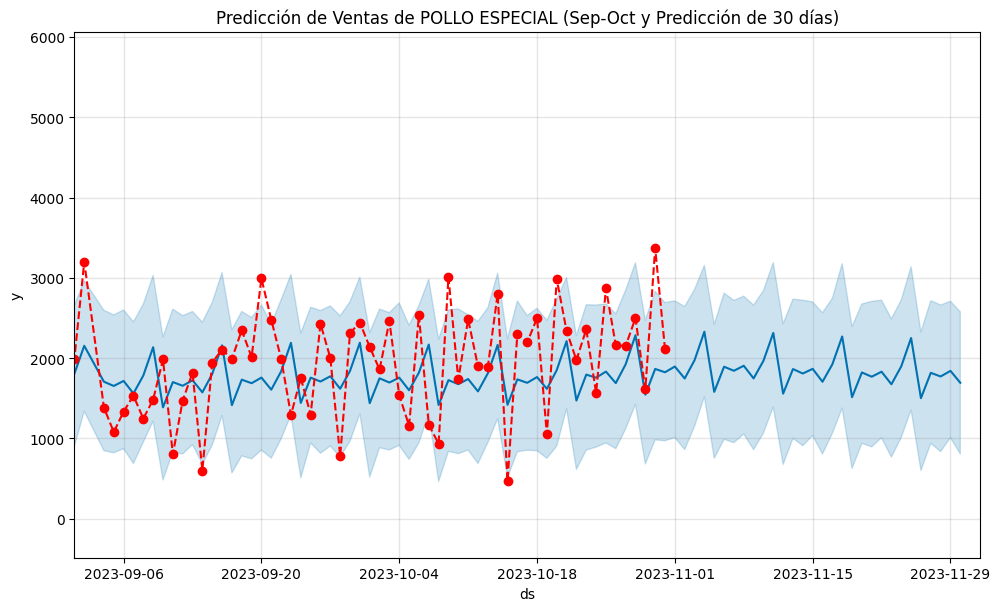

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/2iv3ydap.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/ssip7czg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26885', 'data', 'file=/tmp/tmpz_kx36mg/2iv3ydap.json', 'init=/tmp/tmpz_kx36mg/ssip7czg.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_modelc02pewxf/prophet_model-20240222032250.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Predicción con todos los valores para POLLO ESPECIAL:
             ds      yhat
1411 2023-11-01 1895.6506
1412 2023-11-02 1746.4883
1413 2023-11-03 1974.1762
1414 2023-11-04 2329.7085
1415 2023-11-05 1580.3323
1416 2023-11-06 1893.1272
1417 2023-11-07 1842.9443
1418 2023-11-08 1905.5561
1419 2023-11-09 1747.7061
1420 2023-11-10 1967.0084
1421 2023-11-11 2314.6436
1422 2023-11-12 1558.0323
1423 2023-11-13 1864.4104
1424 2023-11-14 1808.7650
1425 2023-11-15 1866.9801
1426 2023-11-16 1705.8850
1427 2023-11-17 1923.1513
1428 2023-11-18 2269.9885
1429 2023-11-19 1513.8167
1430 2023-11-20 1821.8431
1431 2023-11-21 1768.9985
1432 2023-11-22 1831.0860
1433 2023-11-23 1674.8312
1434 2023-11-24 1897.7828
1435 2023-11-25 2251.0115
1436 2023-11-26 1501.7868
1437 2023-11-27 1817.1578
1438 2023-11-28 1771.8936
1439 2023-11-29 1841.6363
1440 2023-11-30 1692.9550
             ds            NombreProducto         y
0    2018-11-08  POLLO SIN MENUDENCIA H-C  533.0210
1    2018-11-09  POLLO SIN MENUDENCI

03:22:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


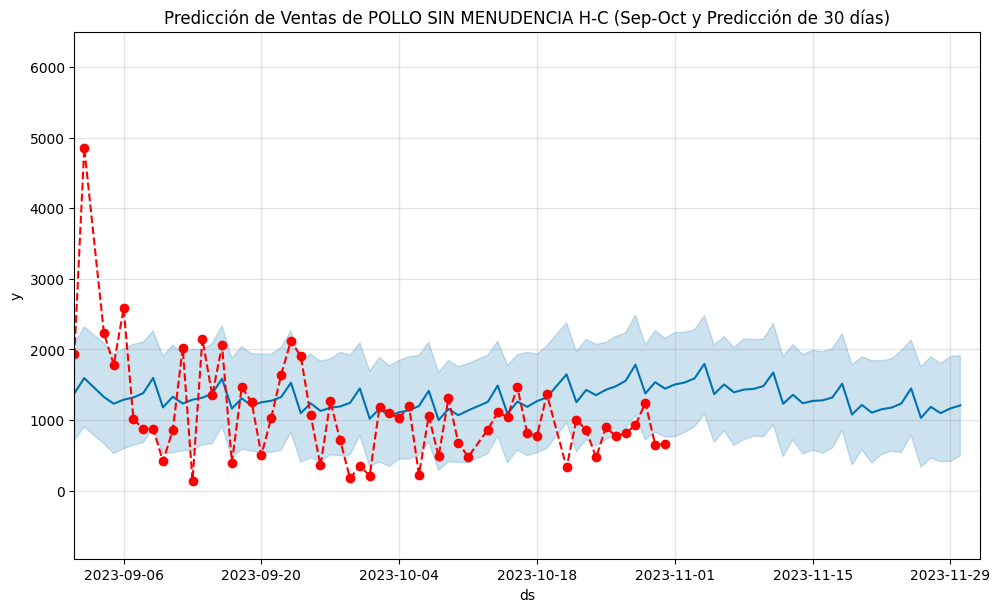

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/mne7shex.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/4jdekqbo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23141', 'data', 'file=/tmp/tmpz_kx36mg/mne7shex.json', 'init=/tmp/tmpz_kx36mg/4jdekqbo.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_modelzl80_f05/prophet_model-20240222032251.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Predicción con todos los valores para POLLO SIN MENUDENCIA H-C:
             ds      yhat
1347 2023-11-01 1502.6085
1348 2023-11-02 1531.3556
1349 2023-11-03 1588.6640
1350 2023-11-04 1795.4524
1351 2023-11-05 1366.1865
1352 2023-11-06 1503.9053
1353 2023-11-07 1391.5943
1354 2023-11-08 1430.2992
1355 2023-11-09 1440.2814
1356 2023-11-10 1480.4473
1357 2023-11-11 1672.0262
1358 2023-11-12 1229.7590
1359 2023-11-13 1356.9184
1360 2023-11-14 1236.6772
1361 2023-11-15 1270.2185
1362 2023-11-16 1277.8880
1363 2023-11-17 1318.6220
1364 2023-11-18 1513.6247
1365 2023-11-19 1077.5575
1366 2023-11-20 1213.5608
1367 2023-11-21 1104.6253
1368 2023-11-22 1151.7063
1369 2023-11-23 1174.8808
1370 2023-11-24 1232.7809
1371 2023-11-25 1446.2783
1372 2023-11-26 1029.6796
1373 2023-11-27 1185.7561
1374 2023-11-28 1097.1228
1375 2023-11-29 1164.3602
1376 2023-11-30 1207.1789
             ds NombreProducto        y
0    2018-11-02        PECHUGA 393.6680
1    2018-11-03        PECHUGA 477.7560
2    2018-

03:22:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


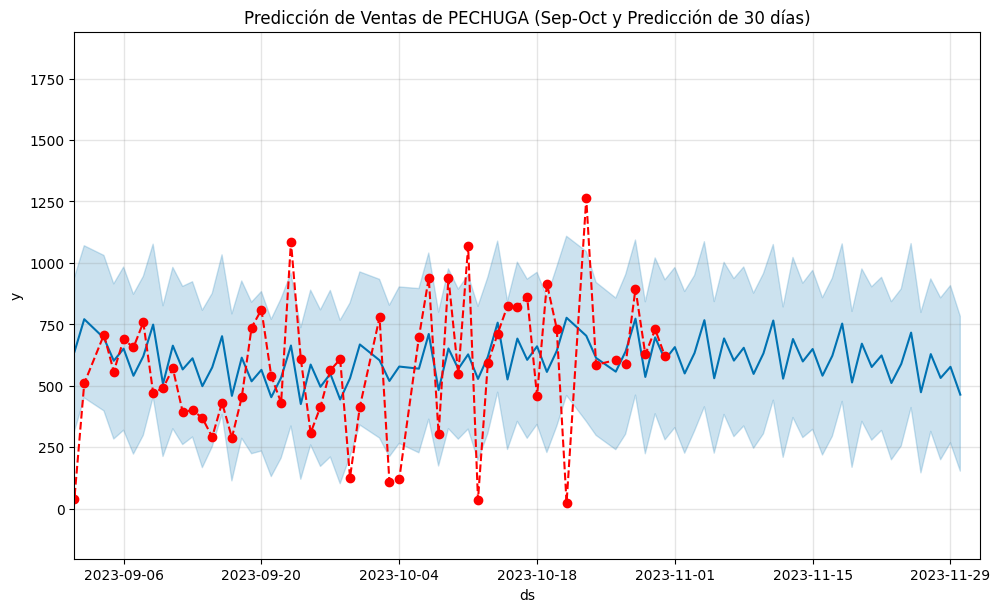

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/erp4ytfb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/dzd1szkl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23588', 'data', 'file=/tmp/tmpz_kx36mg/erp4ytfb.json', 'init=/tmp/tmpz_kx36mg/dzd1szkl.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_model6mi5l84h/prophet_model-20240222032252.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Predicción con todos los valores para PECHUGA:
             ds     yhat
1198 2023-11-01 656.9627
1199 2023-11-02 549.8121
1200 2023-11-03 633.0014
1201 2023-11-04 766.6497
1202 2023-11-05 530.3062
1203 2023-11-06 692.3421
1204 2023-11-07 602.1821
1205 2023-11-08 654.3975
1206 2023-11-09 547.9013
1207 2023-11-10 631.4925
1208 2023-11-11 765.2252
1209 2023-11-12 528.5947
1210 2023-11-13 689.9322
1211 2023-11-14 598.6369
1212 2023-11-15 649.2704
1213 2023-11-16 540.7526
1214 2023-11-17 621.9056
1215 2023-11-18 752.8222
1216 2023-11-19 513.0515
1217 2023-11-20 670.9917
1218 2023-11-21 576.1205
1219 2023-11-22 623.0874
1220 2023-11-23 510.9067
1221 2023-11-24 588.4993
1222 2023-11-25 716.0578
1223 2023-11-26 473.2293
1224 2023-11-27 628.5054
1225 2023-11-28 531.4497
1226 2023-11-29 576.7876
1227 2023-11-30 463.5969
             ds NombreProducto        y
0    2018-11-03   PIERNA MUSLO 282.6240
1    2018-11-04   PIERNA MUSLO 694.2320
2    2018-11-05   PIERNA MUSLO 128.4320
3    2018-11-08   

03:22:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


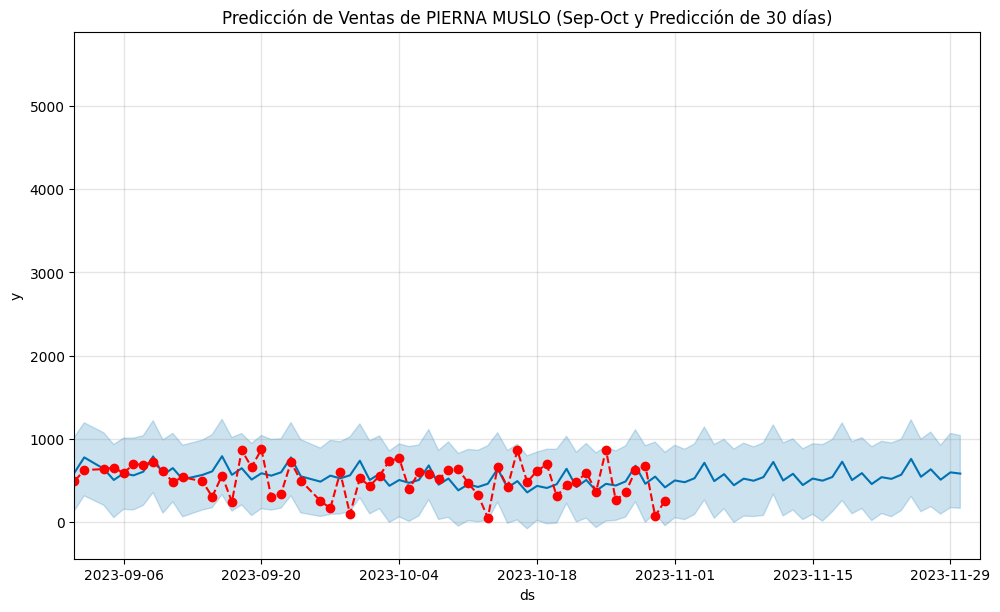

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/kv6z_7fa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/ssvp8yxj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27734', 'data', 'file=/tmp/tmpz_kx36mg/kv6z_7fa.json', 'init=/tmp/tmpz_kx36mg/ssvp8yxj.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_modeli_ltxw39/prophet_model-20240222032253.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Predicción con todos los valores para PIERNA MUSLO:
             ds     yhat
1208 2023-11-01 498.2695
1209 2023-11-02 477.1431
1210 2023-11-03 524.6453
1211 2023-11-04 710.6433
1212 2023-11-05 490.5876
1213 2023-11-06 573.7891
1214 2023-11-07 440.7381
1215 2023-11-08 519.8167
1216 2023-11-09 494.7451
1217 2023-11-10 538.4248
1218 2023-11-11 720.8677
1219 2023-11-12 497.6628
1220 2023-11-13 578.2488
1221 2023-11-14 443.2290
1222 2023-11-15 521.0805
1223 2023-11-16 495.5975
1224 2023-11-17 539.7315
1225 2023-11-18 723.5197
1226 2023-11-19 502.5491
1227 2023-11-20 586.2293
1228 2023-11-21 455.1082
1229 2023-11-22 537.5812
1230 2023-11-23 517.3371
1231 2023-11-24 567.2005
1232 2023-11-25 757.0631
1233 2023-11-26 542.3519
1234 2023-11-27 632.3061
1235 2023-11-28 507.2969
1236 2023-11-29 595.5421
1237 2023-11-30 580.5562
             ds   NombreProducto         y
0    2018-11-01  FILETE A GRANEL  273.2400
1    2018-11-02  FILETE A GRANEL  154.5600
2    2018-11-03  FILETE A GRANEL  274.0680
3

03:22:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


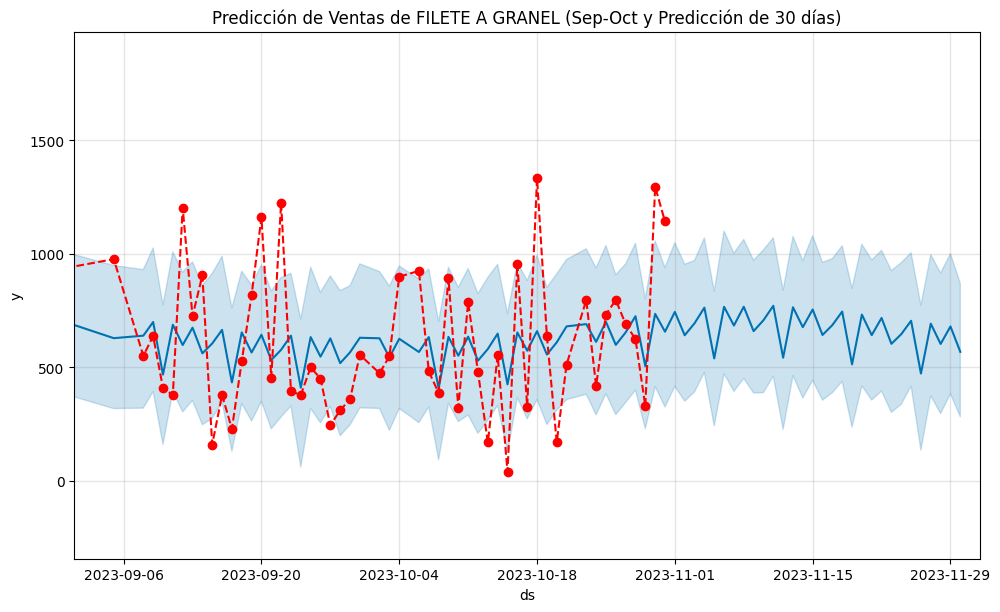

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/i6ve1xf9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/azrcwgup.json
DEBUG:cmdstanpy:idx 0


Predicción con todos los valores para FILETE A GRANEL:
             ds     yhat
1279 2023-11-01 744.6691
1280 2023-11-02 641.7844
1281 2023-11-03 694.6342
1282 2023-11-04 763.3574
1283 2023-11-05 539.7381
1284 2023-11-06 767.1804
1285 2023-11-07 684.6797
1286 2023-11-08 767.4881
1287 2023-11-09 659.9630
1288 2023-11-10 707.9267
1289 2023-11-11 771.5910
1290 2023-11-12 542.8170
1291 2023-11-13 765.0881
1292 2023-11-14 677.4799
1293 2023-11-15 755.3236
1294 2023-11-16 643.0526
1295 2023-11-17 686.5608
1296 2023-11-18 746.1257
1297 2023-11-19 513.6664
1298 2023-11-20 732.7160
1299 2023-11-21 642.3898
1300 2023-11-22 718.0487
1301 2023-11-23 604.1450
1302 2023-11-24 646.5805
1303 2023-11-25 705.6294
1304 2023-11-26 473.1978
1305 2023-11-27 692.7949
1306 2023-11-28 603.5038
1307 2023-11-29 680.6445
1308 2023-11-30 568.6217
             ds NombreProducto        y
0    2018-11-01         PIERNA 177.1000
1    2018-11-02         PIERNA 160.3560
2    2018-11-03         PIERNA 228.0680
3    2018-

DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6531', 'data', 'file=/tmp/tmpz_kx36mg/i6ve1xf9.json', 'init=/tmp/tmpz_kx36mg/azrcwgup.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_modeln3ho77ya/prophet_model-20240222032254.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:22:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


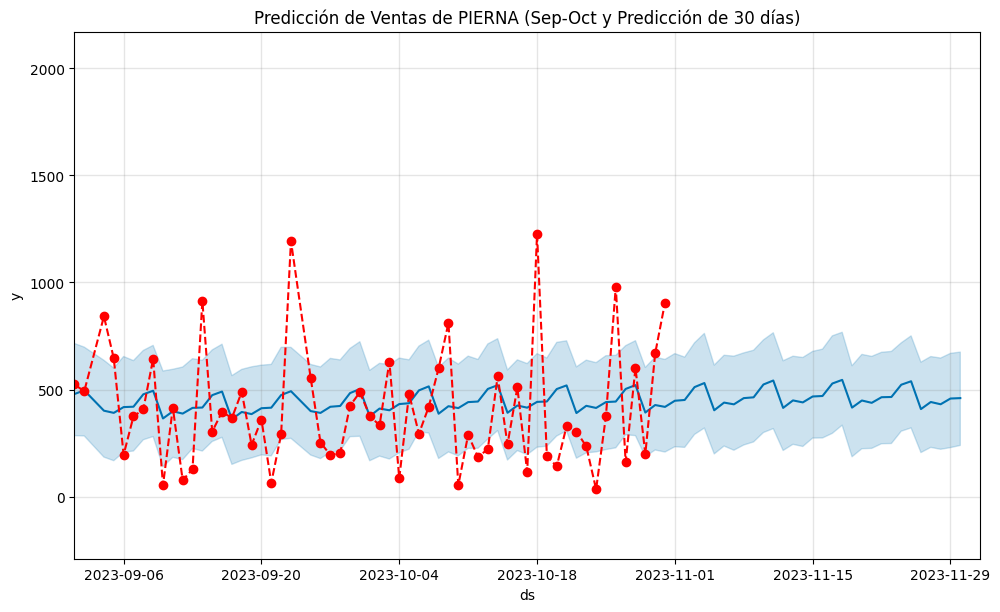

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/p6p6mdu3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/ogmt6ti1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56337', 'data', 'file=/tmp/tmpz_kx36mg/p6p6mdu3.json', 'init=/tmp/tmpz_kx36mg/ogmt6ti1.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_model0rdubkhs/prophet_model-20240222032255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Predicción con todos los valores para PIERNA:
             ds     yhat
1350 2023-11-01 447.7456
1351 2023-11-02 451.4311
1352 2023-11-03 511.4593
1353 2023-11-04 530.4826
1354 2023-11-05 403.3715
1355 2023-11-06 439.1826
1356 2023-11-07 431.0425
1357 2023-11-08 460.0132
1358 2023-11-09 463.7848
1359 2023-11-10 523.6425
1360 2023-11-11 542.2360
1361 2023-11-12 414.4415
1362 2023-11-13 449.3291
1363 2023-11-14 440.0468
1364 2023-11-15 467.6856
1365 2023-11-16 469.9710
1366 2023-11-17 528.2297
1367 2023-11-18 545.1572
1368 2023-11-19 415.6790
1369 2023-11-20 448.9170
1370 2023-11-21 438.0711
1371 2023-11-22 464.2832
1372 2023-11-23 465.3277
1373 2023-11-24 522.5753
1374 2023-11-25 538.7611
1375 2023-11-26 408.8427
1376 2023-11-27 441.9664
1377 2023-11-28 431.3478
1378 2023-11-29 458.1348
1379 2023-11-30 460.0976
             ds NombreProducto        y
0    2018-11-01          MUSLO  77.0960
1    2018-11-02          MUSLO 175.2600
2    2018-11-03          MUSLO 214.8200
3    2018-11-04    

03:22:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


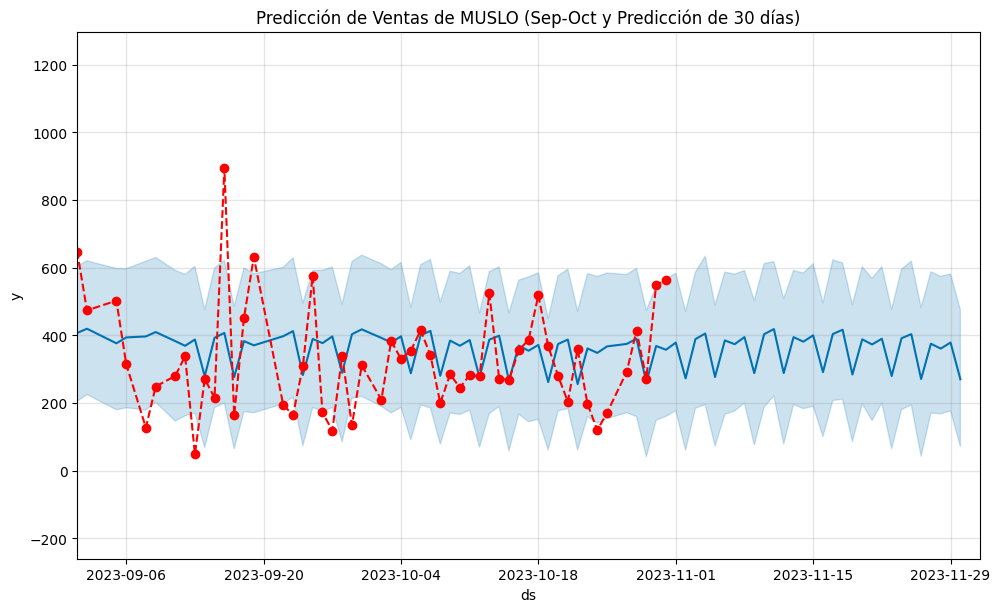

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/mvqi_0r8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/1v9cqbf0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4399', 'data', 'file=/tmp/tmpz_kx36mg/mvqi_0r8.json', 'init=/tmp/tmpz_kx36mg/1v9cqbf0.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_modele70mj9na/prophet_model-20240222032257.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Predicción con todos los valores para MUSLO:
             ds     yhat
1273 2023-11-01 378.5377
1274 2023-11-02 272.7714
1275 2023-11-03 388.8305
1276 2023-11-04 405.4170
1277 2023-11-05 276.8812
1278 2023-11-06 385.0202
1279 2023-11-07 373.9393
1280 2023-11-08 394.7713
1281 2023-11-09 288.3273
1282 2023-11-10 403.3600
1283 2023-11-11 418.5943
1284 2023-11-12 288.4117
1285 2023-11-13 394.6481
1286 2023-11-14 381.4549
1287 2023-11-15 400.0166
1288 2023-11-16 291.2009
1289 2023-11-17 403.8209
1290 2023-11-18 416.6636
1291 2023-11-19 284.1739
1292 2023-11-20 388.2499
1293 2023-11-21 373.1030
1294 2023-11-22 389.9741
1295 2023-11-23 279.7820
1296 2023-11-24 391.3845
1297 2023-11-25 403.6054
1298 2023-11-26 270.9180
1299 2023-11-27 375.2390
1300 2023-11-28 360.7882
1301 2023-11-29 378.8045
1302 2023-11-30 270.1937
            ds            NombreProducto        y
0   2018-11-08  POLLO CON MENUDENCIA H-C 369.1720
1   2018-11-10  POLLO CON MENUDENCIA H-C 293.0770
2   2018-11-11  POLLO CON MENU

03:22:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


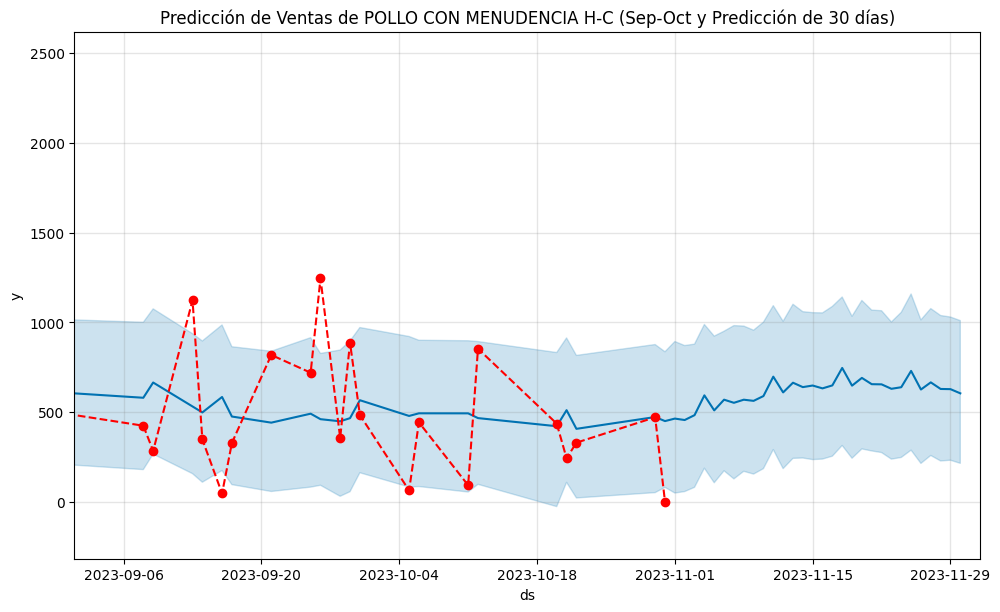

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/d_leownx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/yg952004.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14791', 'data', 'file=/tmp/tmpz_kx36mg/d_leownx.json', 'init=/tmp/tmpz_kx36mg/yg952004.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_model6oxi8qz8/prophet_model-20240222032258.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:22:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Predicción con todos los valores para POLLO CON MENUDENCIA H-C:
            ds     yhat
757 2023-11-01 463.5278
758 2023-11-02 455.5601
759 2023-11-03 482.6950
760 2023-11-04 592.9341
761 2023-11-05 509.1833
762 2023-11-06 568.8805
763 2023-11-07 551.4821
764 2023-11-08 568.7545
765 2023-11-09 562.3055
766 2023-11-10 589.0749
767 2023-11-11 697.0932
768 2023-11-12 609.3442
769 2023-11-13 663.3907
770 2023-11-14 638.8569
771 2023-11-15 647.7151
772 2023-11-16 631.8116
773 2023-11-17 648.3502
774 2023-11-18 745.6439
775 2023-11-19 646.9688
776 2023-11-20 690.1822
777 2023-11-21 655.1966
778 2023-11-22 654.2587
779 2023-11-23 629.4672
780 2023-11-24 638.2498
781 2023-11-25 729.1086
782 2023-11-26 625.4692
783 2023-11-27 665.2945
784 2023-11-28 628.5565
785 2023-11-29 627.5133
786 2023-11-30 604.2274
            ds       NombreProducto         y
0   2018-11-01  PIERNA MUSLO OFERTA  802.3320
1   2018-11-02  PIERNA MUSLO OFERTA 1612.9440
2   2018-11-03  PIERNA MUSLO OFERTA   15.6400
3   2018

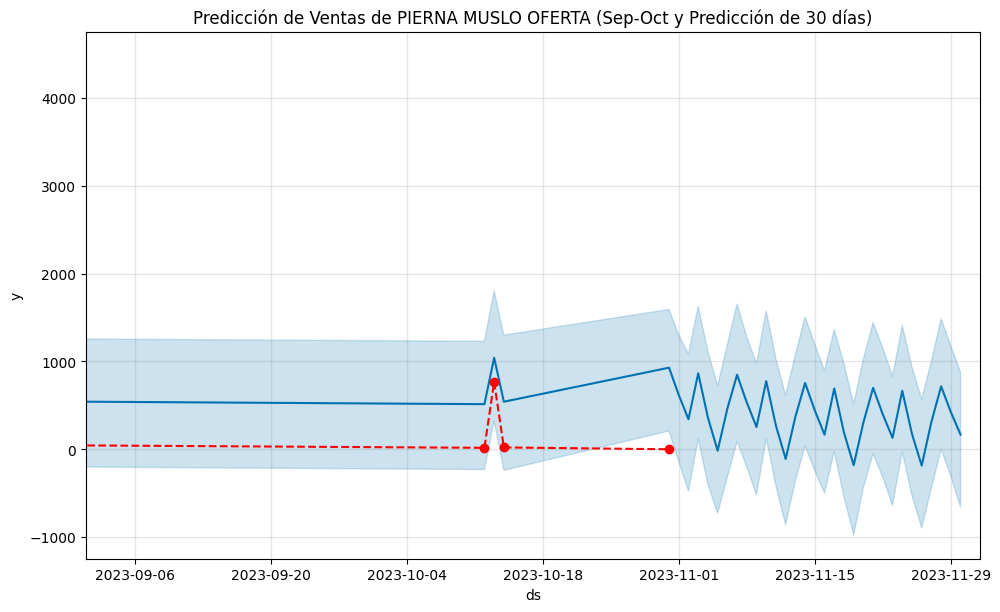

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/koxi8ma0.json


Predicción con todos los valores para PIERNA MUSLO OFERTA:
            ds      yhat
270 2023-11-01  617.7398
271 2023-11-02  341.5873
272 2023-11-03  865.4217
273 2023-11-04  360.9536
274 2023-11-05  -16.1960
275 2023-11-06  463.4677
276 2023-11-07  847.7831
277 2023-11-08  533.3636
278 2023-11-09  254.1250
279 2023-11-10  775.3645
280 2023-11-11  268.9413
281 2023-11-12 -109.3842
282 2023-11-13  370.0077
283 2023-11-14  755.0610
284 2023-11-15  442.4722
285 2023-11-16  166.2130
286 2023-11-17  691.6076
287 2023-11-18  190.5114
288 2023-11-19 -181.3511
289 2023-11-20  305.5729
290 2023-11-21  699.1297
291 2023-11-22  395.8899
292 2023-11-23  129.6742
293 2023-11-24  665.6339
294 2023-11-25  175.4348
295 2023-11-26 -185.4000
296 2023-11-27  312.4742
297 2023-11-28  716.6950
298 2023-11-29  423.6295
299 2023-11-30  166.9057
             ds NombreProducto        y
0    2018-11-01    ALA PRIMERA 200.5600
1    2018-11-02    ALA PRIMERA 393.5760
2    2018-11-03    ALA PRIMERA 195.9600
3    2

DEBUG:cmdstanpy:input tempfile: /tmp/tmpz_kx36mg/6ezvrbs3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19979', 'data', 'file=/tmp/tmpz_kx36mg/koxi8ma0.json', 'init=/tmp/tmpz_kx36mg/6ezvrbs3.json', 'output', 'file=/tmp/tmpz_kx36mg/prophet_modeltjzsr3tk/prophet_model-20240222032259.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:22:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:22:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


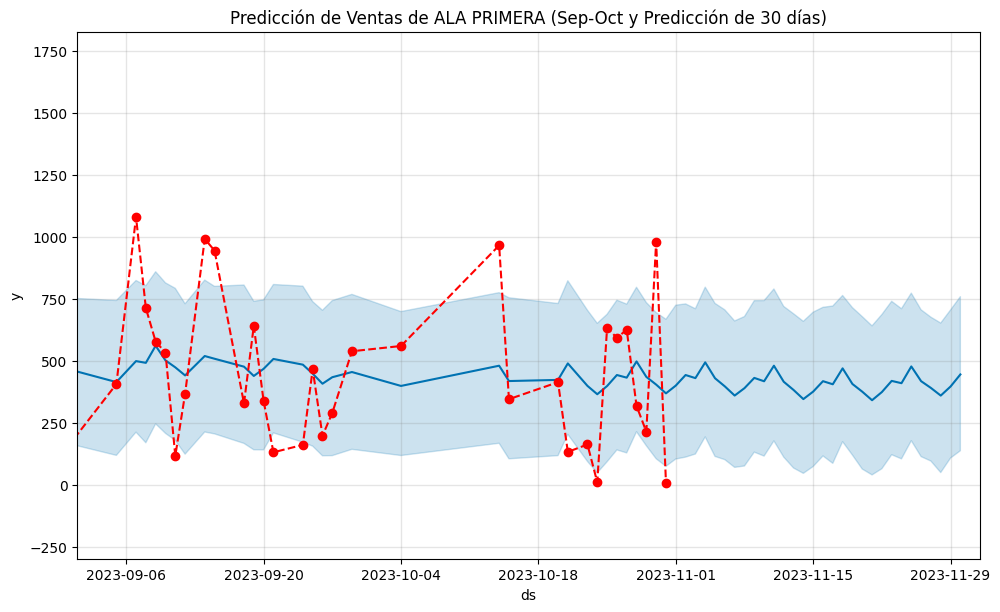

Predicción con todos los valores para ALA PRIMERA:
             ds     yhat
1052 2023-11-01 399.2554
1053 2023-11-02 441.8905
1054 2023-11-03 429.4071
1055 2023-11-04 492.9892
1056 2023-11-05 428.8234
1057 2023-11-06 396.0249
1058 2023-11-07 359.0524
1059 2023-11-08 388.8998
1060 2023-11-09 430.2557
1061 2023-11-10 416.7084
1062 2023-11-11 479.4701
1063 2023-11-12 414.7526
1064 2023-11-13 381.6935
1065 2023-11-14 344.7704
1066 2023-11-15 374.9924
1067 2023-11-16 417.0593
1068 2023-11-17 404.5662
1069 2023-11-18 468.7272
1070 2023-11-19 405.7511
1071 2023-11-20 374.7669
1072 2023-11-21 340.2380
1073 2023-11-22 373.1532
1074 2023-11-23 418.1858
1075 2023-11-24 408.8983
1076 2023-11-25 476.4658
1077 2023-11-26 417.0523
1078 2023-11-27 389.7360
1079 2023-11-28 358.9241
1080 2023-11-29 395.5445
1081 2023-11-30 444.2056


In [39]:
# Definir las fechas de inicio y fin
fecha_inicio_str = '2023-09-01'
fecha_fin_str = '2023-12-02'

# Convertir las fechas a objetos datetime
fecha_inicio = datetime.strptime(fecha_inicio_str, '%Y-%m-%d')
fecha_fin = datetime.strptime(fecha_fin_str, '%Y-%m-%d')

# Iterar sobre los productos en dfs_de_productos_sumados_prophet
for product, product_df in dfs_de_productos_sumados_prophet.items():
    # Crear un modelo de Prophet
    modelo = Prophet()
    print(product_df)
    # Ajustar el modelo con los datos de entrenamiento
    modelo.fit(product_df)

    # Crear un DataFrame con fechas futuras para hacer la predicción
    futuro = modelo.make_future_dataframe(periods=30)

    # Hacer la predicción
    prediccion = modelo.predict(futuro)

    # Visualizar la predicción con límites ajustados
    fig = modelo.plot(prediccion)

    # Extraer los valores reales de predicción para cada día
    valores_prediccion = prediccion[['ds', 'yhat']].tail(30)

    # Mostrar el gráfico
    plt.plot(product_df['ds'], product_df['y'], label=f'Ventas reales de {product}', color='red', marker='o', linestyle='dashed')
    plt.xlim([fecha_inicio, fecha_fin])
    plt.title(f'Predicción de Ventas de {product} (Sep-Oct y Predicción de 30 días)')
    plt.show()

    # Mostrar el DataFrame con los valores de predicción
    print(f"Predicción con todos los valores para {product}:\n{valores_prediccion}")

    # Guardar las predicciones en dfs_noviembre_sumados
    col_name = f'P-V_PROPHET_{product}'
    dfs_noviembre_sumados[product][col_name] = valores_prediccion['yhat'].values

## EVALUAR PROPHET

Predicciones hechas sobre todas las ventas de los 10 producton contando con y sin las ventas de 2020

evaluacion sin 2020

In [40]:
# # Iterar sobre los productos en dfs_noviembre_sumados
# for product, product_df in dfs_noviembre_sumados.items():
#     # Crear un nombre único para la columna de predicciones de Prophet
#     col_name = f'P-V_PROPHET_{product}'

#     # Convertir la columna de fecha a tipo datetime
#     product_df['FechaMovimiento'] = pd.to_datetime(product_df.index)

#     # Fusionar el DataFrame de ventas con el DataFrame de predicciones
#     product_df = pd.merge(product_df, valores_prediccion[['ds', 'yhat']], left_on='FechaMovimiento', right_on='ds', how='left')

#     # Renombrar la columna yhat a Ventas_PROPHET
#     product_df.rename(columns={'yhat': col_name}, inplace=True)

#     # Opcional: Eliminar la columna adicional 'ds' si no la necesitas
#     product_df.drop(columns=['ds'], inplace=True)

#     # Actualizar el DataFrame en el diccionario
#     dfs_noviembre_sumados[product] = product_df

In [41]:
for product, product_df in dfs_noviembre_sumados.items():
    print(product_df.head(30))

    # Puedes acceder a cada DataFrame individualmente para realizar evaluaciones métricas
    evaluacion_metrica(dfs_noviembre_sumados[product]['MontoBase'], dfs_noviembre_sumados[product][f'P-V_PROPHET_{product}'])

                 NombreProducto  MontoBase  P-V_PROPHET_POLLO ESPECIAL
FechaMovimiento                                                       
2023-11-01       POLLO ESPECIAL  1999.7321                   1895.6506
2023-11-02       POLLO ESPECIAL  1011.2892                   1746.4883
2023-11-03       POLLO ESPECIAL  2343.7883                   1974.1762
2023-11-04       POLLO ESPECIAL  1673.2089                   2329.7085
2023-11-05       POLLO ESPECIAL  1181.9289                   1580.3323
2023-11-06       POLLO ESPECIAL   863.7984                   1893.1272
2023-11-07       POLLO ESPECIAL  1648.4580                   1842.9443
2023-11-08       POLLO ESPECIAL  1434.6711                   1905.5561
2023-11-09       POLLO ESPECIAL  1680.6493                   1747.7061
2023-11-10       POLLO ESPECIAL  1767.7892                   1967.0084
2023-11-11       POLLO ESPECIAL  1634.3693                   2314.6436
2023-11-12       POLLO ESPECIAL   773.2943                   1558.0323
2023-1

In [42]:
dfs_noviembre_sumados

{'POLLO ESPECIAL':                  NombreProducto  MontoBase  P-V_PROPHET_POLLO ESPECIAL
 FechaMovimiento                                                       
 2023-11-01       POLLO ESPECIAL  1999.7321                   1895.6506
 2023-11-02       POLLO ESPECIAL  1011.2892                   1746.4883
 2023-11-03       POLLO ESPECIAL  2343.7883                   1974.1762
 2023-11-04       POLLO ESPECIAL  1673.2089                   2329.7085
 2023-11-05       POLLO ESPECIAL  1181.9289                   1580.3323
 2023-11-06       POLLO ESPECIAL   863.7984                   1893.1272
 2023-11-07       POLLO ESPECIAL  1648.4580                   1842.9443
 2023-11-08       POLLO ESPECIAL  1434.6711                   1905.5561
 2023-11-09       POLLO ESPECIAL  1680.6493                   1747.7061
 2023-11-10       POLLO ESPECIAL  1767.7892                   1967.0084
 2023-11-11       POLLO ESPECIAL  1634.3693                   2314.6436
 2023-11-12       POLLO ESPECIAL   773.2943   

# LSTM


In [43]:
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler

In [44]:
print(dfs_de_productos_sumados_lstm['POLLO SIN MENUDENCIA H-C'].dtypes)
print(dfs_de_productos_sumados_lstm)

NombreProducto     object
MontoBase         float64
DayOW               int64
Month               int64
Year                int64
dtype: object
{'POLLO ESPECIAL':                  NombreProducto  MontoBase  DayOW  Month  Year
FechaMovimiento                                               
2018-11-01       POLLO ESPECIAL  1140.6240      3     11  2018
2018-11-02       POLLO ESPECIAL  1645.2540      4     11  2018
2018-11-03       POLLO ESPECIAL   712.9790      5     11  2018
2018-11-04       POLLO ESPECIAL  1343.6330      6     11  2018
2018-11-05       POLLO ESPECIAL  1755.2580      0     11  2018
...                         ...        ...    ...    ...   ...
2023-10-27       POLLO ESPECIAL  2152.1624      4     10  2023
2023-10-28       POLLO ESPECIAL  2499.2891      5     10  2023
2023-10-29       POLLO ESPECIAL  1611.2471      6     10  2023
2023-10-30       POLLO ESPECIAL  3372.2990      0     10  2023
2023-10-31       POLLO ESPECIAL  2112.0323      1     10  2023

[1411 rows x 5 co

In [45]:
# Función para crear secuencias temporales
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        seq = data[i:i+seq_length]
        label = data[i+seq_length:i+seq_length+1]
        sequences.append((seq, label))
    return np.array([s[0] for s in sequences]), np.array([s[1] for s in sequences])


In [46]:
# #Otro enfoque creando anteriormente las fechas de noviembre para las predicciones
# def create_sequences(data, seq_length):
#     X, y = [], []
#     for i in range(len(data) - seq_length):
#         seq = data[i : i + seq_length]
#         label = data[i + seq_length]
#         X.append(seq)
#         y.append(label)
#     return np.array(X), np.array(y)

## Entrenamiento y prediccion para cada producto
Aquellos productos que despues de 01-09-2023 no tienen mas de 30 ventas, no tienen predicciones para el mes de Noviembre

Epoch 1/50
35/35 - 5s - loss: 0.0253 - 5s/epoch - 150ms/step
Epoch 2/50
35/35 - 0s - loss: 0.0149 - 427ms/epoch - 12ms/step
Epoch 3/50
35/35 - 0s - loss: 0.0145 - 436ms/epoch - 12ms/step
Epoch 4/50
35/35 - 0s - loss: 0.0144 - 435ms/epoch - 12ms/step
Epoch 5/50
35/35 - 0s - loss: 0.0143 - 428ms/epoch - 12ms/step
Epoch 6/50
35/35 - 0s - loss: 0.0143 - 407ms/epoch - 12ms/step
Epoch 7/50
35/35 - 0s - loss: 0.0143 - 420ms/epoch - 12ms/step
Epoch 8/50
35/35 - 0s - loss: 0.0143 - 417ms/epoch - 12ms/step
Epoch 9/50
35/35 - 0s - loss: 0.0141 - 402ms/epoch - 11ms/step
Epoch 10/50
35/35 - 0s - loss: 0.0143 - 418ms/epoch - 12ms/step
Epoch 11/50
35/35 - 1s - loss: 0.0142 - 595ms/epoch - 17ms/step
Epoch 12/50
35/35 - 1s - loss: 0.0142 - 654ms/epoch - 19ms/step
Epoch 13/50
35/35 - 1s - loss: 0.0143 - 673ms/epoch - 19ms/step
Epoch 14/50
35/35 - 1s - loss: 0.0142 - 658ms/epoch - 19ms/step
Epoch 15/50
35/35 - 1s - loss: 0.0142 - 663ms/epoch - 19ms/step
Epoch 16/50
35/35 - 1s - loss: 0.0140 - 583ms/epoch

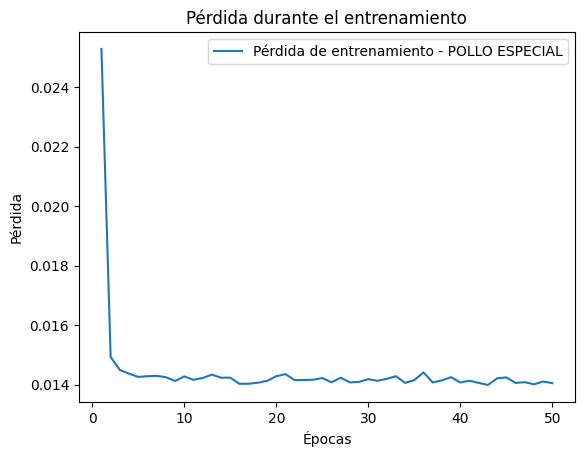

9/9 [==============================] - 1s 5ms/step


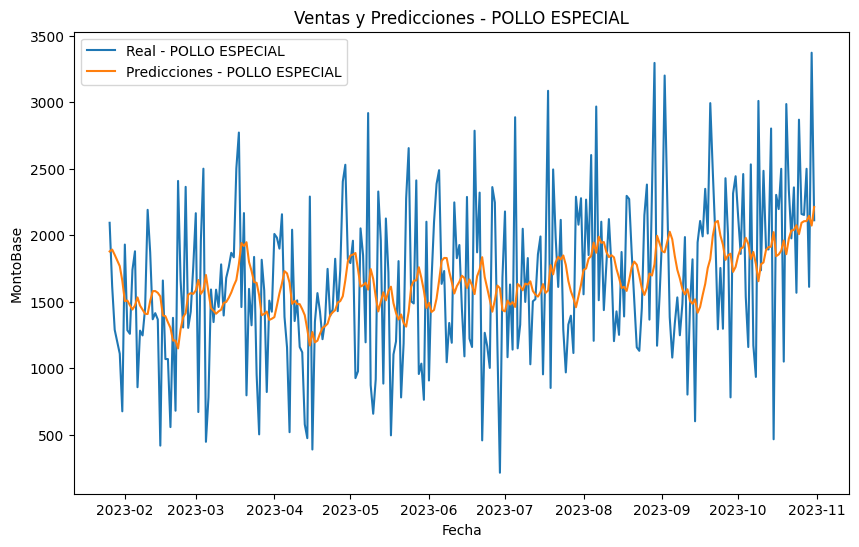

Dimensiones de fechas: (278,)
Dimensiones de predicciones: (277, 1)
La longitud de X_test es: 277 y la longitud de y_test es: 277
Forma de input_data: (30, 30, 1)
Forma de input_data después del reshape: (30, 30, 1)
1/1 [==============================] - 0s 30ms/step
                 P-V_LSTM_POLLO ESPECIAL
FechaMovimiento                         
2023-11-01                             0
2023-11-02                             0
2023-11-03                             0
2023-11-04                             0
2023-11-05                             0
2023-11-06                             0
2023-11-07                             0
2023-11-08                             0
2023-11-09                             0
2023-11-10                             0
2023-11-11                             0
2023-11-12                             0
2023-11-13                             0
2023-11-14                             0
2023-11-15                             0
2023-11-16                         

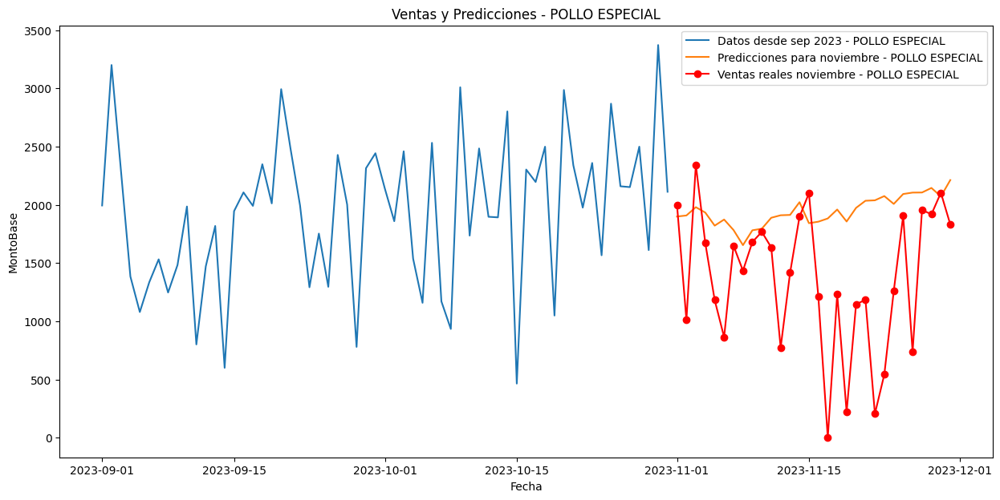

Epoch 1/50
33/33 - 2s - loss: 0.0161 - 2s/epoch - 74ms/step
Epoch 2/50
33/33 - 0s - loss: 0.0093 - 408ms/epoch - 12ms/step
Epoch 3/50
33/33 - 0s - loss: 0.0090 - 407ms/epoch - 12ms/step
Epoch 4/50
33/33 - 0s - loss: 0.0087 - 406ms/epoch - 12ms/step
Epoch 5/50
33/33 - 0s - loss: 0.0088 - 398ms/epoch - 12ms/step
Epoch 6/50
33/33 - 0s - loss: 0.0087 - 399ms/epoch - 12ms/step
Epoch 7/50
33/33 - 0s - loss: 0.0088 - 401ms/epoch - 12ms/step
Epoch 8/50
33/33 - 0s - loss: 0.0089 - 455ms/epoch - 14ms/step
Epoch 9/50
33/33 - 1s - loss: 0.0087 - 599ms/epoch - 18ms/step
Epoch 10/50
33/33 - 1s - loss: 0.0087 - 604ms/epoch - 18ms/step
Epoch 11/50
33/33 - 1s - loss: 0.0088 - 609ms/epoch - 18ms/step
Epoch 12/50
33/33 - 1s - loss: 0.0087 - 612ms/epoch - 19ms/step
Epoch 13/50
33/33 - 1s - loss: 0.0088 - 643ms/epoch - 19ms/step
Epoch 14/50
33/33 - 1s - loss: 0.0086 - 571ms/epoch - 17ms/step
Epoch 15/50
33/33 - 0s - loss: 0.0089 - 407ms/epoch - 12ms/step
Epoch 16/50
33/33 - 0s - loss: 0.0087 - 397ms/epoch 

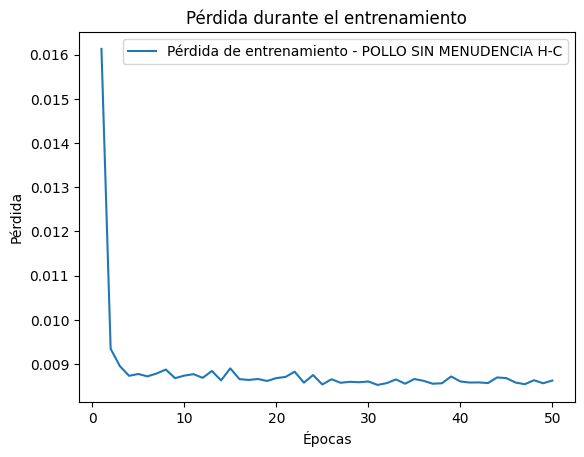

9/9 [==============================] - 0s 6ms/step


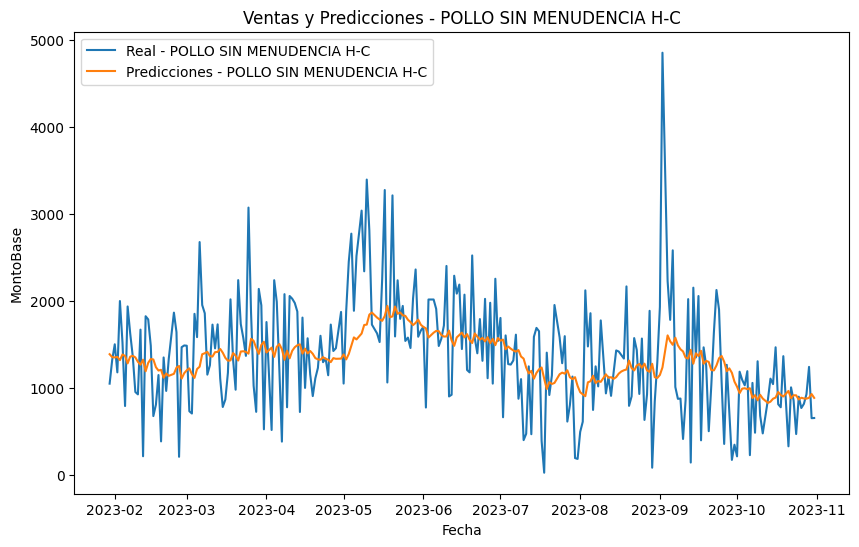

Dimensiones de fechas: (265,)
Dimensiones de predicciones: (264, 1)
La longitud de X_test es: 264 y la longitud de y_test es: 264
Forma de input_data: (28, 30, 1)
Forma de input_data después del reshape: (28, 30, 1)
1/1 [==============================] - 0s 32ms/step
                 P-V_LSTM_POLLO SIN MENUDENCIA H-C
FechaMovimiento                                   
2023-11-01                                       0
2023-11-02                                       0
2023-11-03                                       0
2023-11-04                                       0
2023-11-05                                       0
2023-11-06                                       0
2023-11-07                                       0
2023-11-08                                       0
2023-11-09                                       0
2023-11-10                                       0
2023-11-11                                       0
2023-11-12                                       0
2023-11-13        

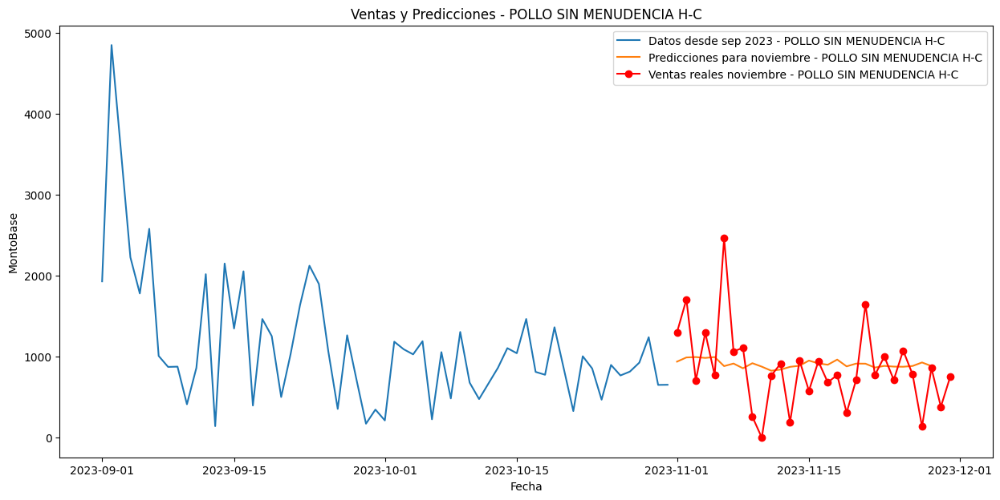

Epoch 1/50
30/30 - 3s - loss: 0.0553 - 3s/epoch - 115ms/step
Epoch 2/50
30/30 - 0s - loss: 0.0212 - 372ms/epoch - 12ms/step
Epoch 3/50
30/30 - 0s - loss: 0.0214 - 384ms/epoch - 13ms/step
Epoch 4/50
30/30 - 0s - loss: 0.0212 - 363ms/epoch - 12ms/step
Epoch 5/50
30/30 - 0s - loss: 0.0210 - 362ms/epoch - 12ms/step
Epoch 6/50
30/30 - 0s - loss: 0.0210 - 372ms/epoch - 12ms/step
Epoch 7/50
30/30 - 0s - loss: 0.0211 - 360ms/epoch - 12ms/step
Epoch 8/50
30/30 - 0s - loss: 0.0209 - 347ms/epoch - 12ms/step
Epoch 9/50
30/30 - 0s - loss: 0.0210 - 370ms/epoch - 12ms/step
Epoch 10/50
30/30 - 0s - loss: 0.0209 - 355ms/epoch - 12ms/step
Epoch 11/50
30/30 - 0s - loss: 0.0209 - 358ms/epoch - 12ms/step
Epoch 12/50
30/30 - 0s - loss: 0.0209 - 375ms/epoch - 13ms/step
Epoch 13/50
30/30 - 0s - loss: 0.0211 - 358ms/epoch - 12ms/step
Epoch 14/50
30/30 - 0s - loss: 0.0211 - 377ms/epoch - 13ms/step
Epoch 15/50
30/30 - 0s - loss: 0.0208 - 347ms/epoch - 12ms/step
Epoch 16/50
30/30 - 0s - loss: 0.0210 - 373ms/epoch

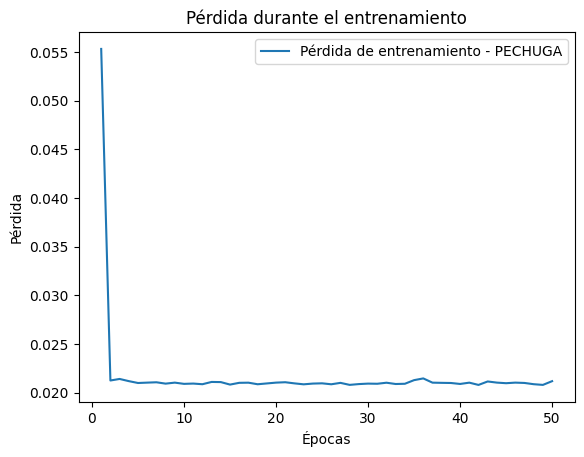

8/8 [==============================] - 0s 6ms/step


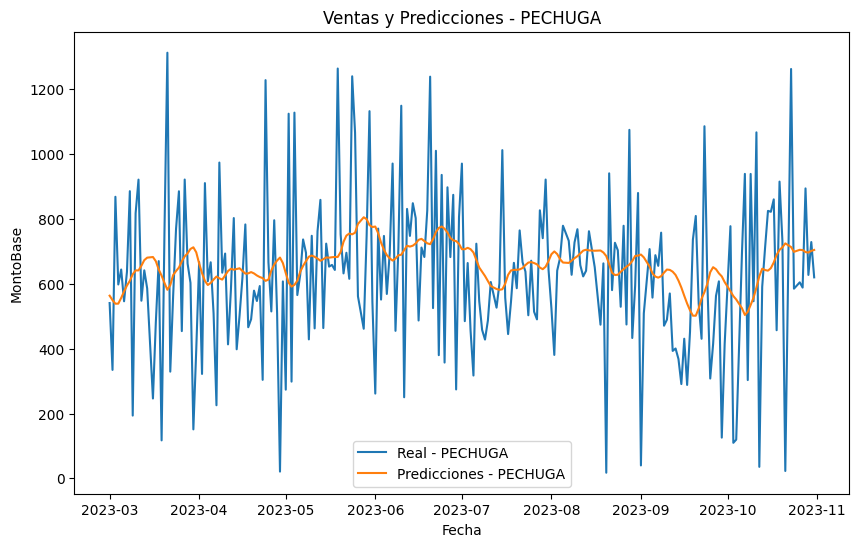

Dimensiones de fechas: (235,)
Dimensiones de predicciones: (234, 1)
La longitud de X_test es: 234 y la longitud de y_test es: 234
Forma de input_data: (26, 30, 1)
Forma de input_data después del reshape: (26, 30, 1)
1/1 [==============================] - 0s 26ms/step
                 P-V_LSTM_PECHUGA
FechaMovimiento                  
2023-11-01                      0
2023-11-02                      0
2023-11-03                      0
2023-11-04                      0
2023-11-05                      0
2023-11-06                      0
2023-11-07                      0
2023-11-08                      0
2023-11-09                      0
2023-11-10                      0
2023-11-11                      0
2023-11-12                      0
2023-11-13                      0
2023-11-14                      0
2023-11-15                      0
2023-11-16                      0
2023-11-17                      0
2023-11-18                      0
2023-11-19                      0
2023-11-20        

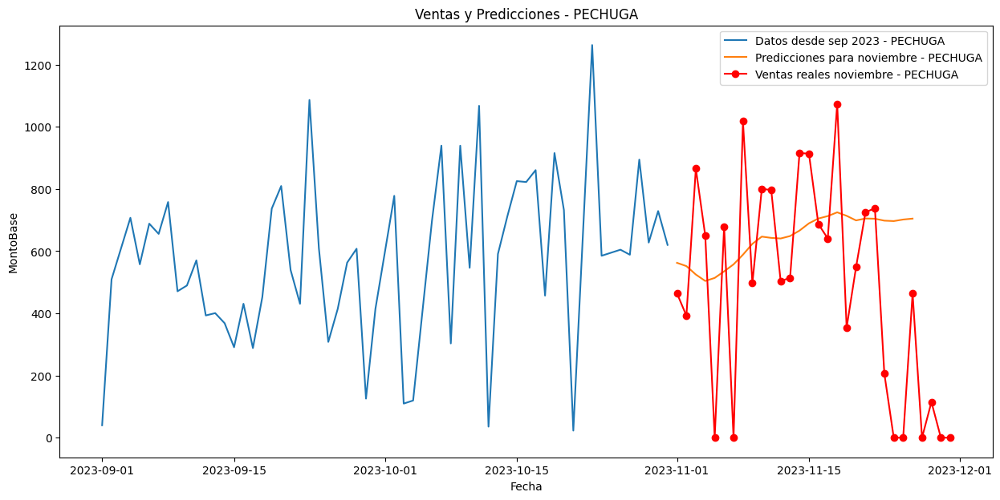

Epoch 1/50
30/30 - 4s - loss: 0.0063 - 4s/epoch - 145ms/step
Epoch 2/50
30/30 - 1s - loss: 0.0044 - 580ms/epoch - 19ms/step
Epoch 3/50
30/30 - 0s - loss: 0.0044 - 499ms/epoch - 17ms/step
Epoch 4/50
30/30 - 0s - loss: 0.0044 - 380ms/epoch - 13ms/step
Epoch 5/50
30/30 - 0s - loss: 0.0044 - 390ms/epoch - 13ms/step
Epoch 6/50
30/30 - 0s - loss: 0.0044 - 376ms/epoch - 13ms/step
Epoch 7/50
30/30 - 0s - loss: 0.0044 - 381ms/epoch - 13ms/step
Epoch 8/50
30/30 - 0s - loss: 0.0044 - 395ms/epoch - 13ms/step
Epoch 9/50
30/30 - 0s - loss: 0.0045 - 380ms/epoch - 13ms/step
Epoch 10/50
30/30 - 0s - loss: 0.0044 - 406ms/epoch - 14ms/step
Epoch 11/50
30/30 - 0s - loss: 0.0044 - 384ms/epoch - 13ms/step
Epoch 12/50
30/30 - 0s - loss: 0.0044 - 372ms/epoch - 12ms/step
Epoch 13/50
30/30 - 0s - loss: 0.0044 - 386ms/epoch - 13ms/step
Epoch 14/50
30/30 - 0s - loss: 0.0044 - 375ms/epoch - 12ms/step
Epoch 15/50
30/30 - 0s - loss: 0.0044 - 375ms/epoch - 13ms/step
Epoch 16/50
30/30 - 0s - loss: 0.0044 - 392ms/epoch

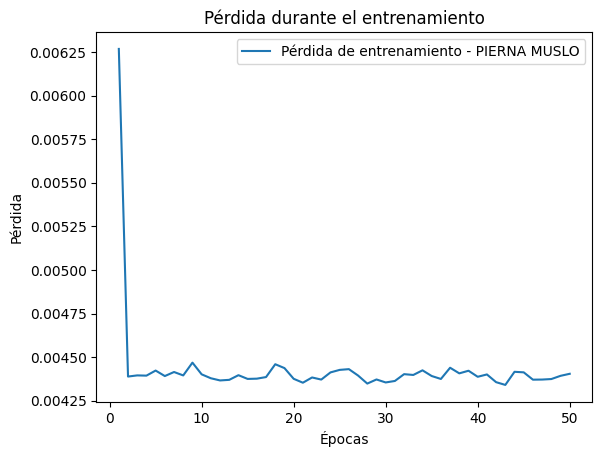

8/8 [==============================] - 1s 6ms/step


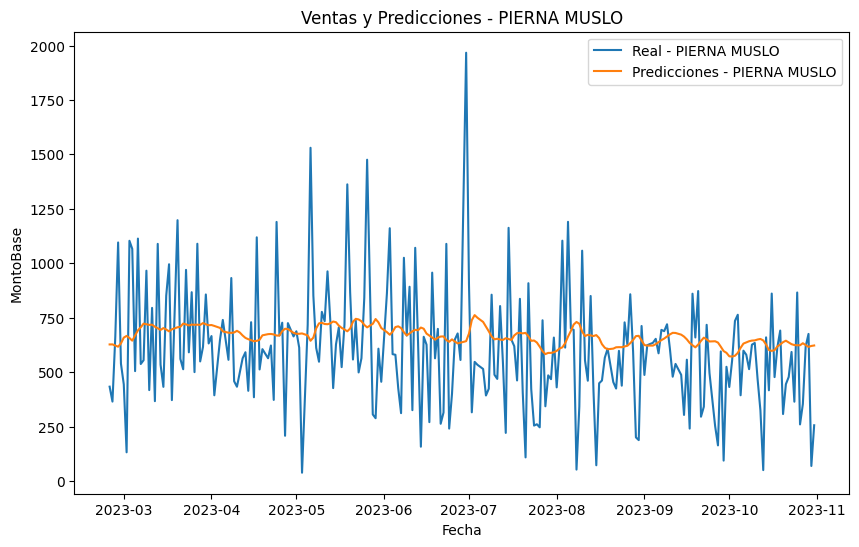

Dimensiones de fechas: (237,)
Dimensiones de predicciones: (236, 1)
La longitud de X_test es: 236 y la longitud de y_test es: 236
Forma de input_data: (28, 30, 1)
Forma de input_data después del reshape: (28, 30, 1)
1/1 [==============================] - 0s 25ms/step
                 P-V_LSTM_PIERNA MUSLO
FechaMovimiento                       
2023-11-01                           0
2023-11-02                           0
2023-11-03                           0
2023-11-04                           0
2023-11-05                           0
2023-11-06                           0
2023-11-07                           0
2023-11-08                           0
2023-11-09                           0
2023-11-10                           0
2023-11-11                           0
2023-11-12                           0
2023-11-13                           0
2023-11-14                           0
2023-11-15                           0
2023-11-16                           0
2023-11-17                    

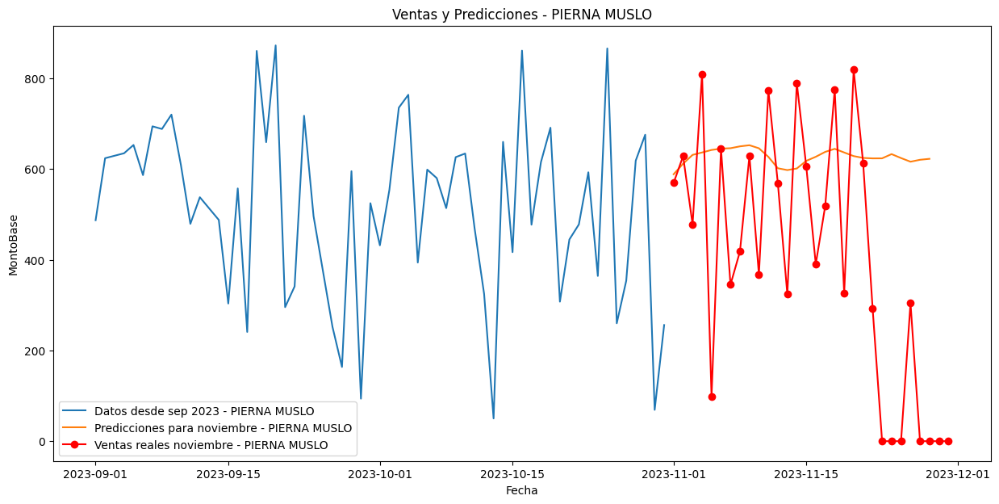

Epoch 1/50
32/32 - 3s - loss: 0.0233 - 3s/epoch - 81ms/step
Epoch 2/50
32/32 - 0s - loss: 0.0143 - 405ms/epoch - 13ms/step
Epoch 3/50
32/32 - 0s - loss: 0.0142 - 397ms/epoch - 12ms/step
Epoch 4/50
32/32 - 0s - loss: 0.0141 - 401ms/epoch - 13ms/step
Epoch 5/50
32/32 - 0s - loss: 0.0141 - 391ms/epoch - 12ms/step
Epoch 6/50
32/32 - 0s - loss: 0.0140 - 394ms/epoch - 12ms/step
Epoch 7/50
32/32 - 0s - loss: 0.0142 - 403ms/epoch - 13ms/step
Epoch 8/50
32/32 - 0s - loss: 0.0141 - 405ms/epoch - 13ms/step
Epoch 9/50
32/32 - 0s - loss: 0.0141 - 408ms/epoch - 13ms/step
Epoch 10/50
32/32 - 0s - loss: 0.0140 - 392ms/epoch - 12ms/step
Epoch 11/50
32/32 - 0s - loss: 0.0143 - 408ms/epoch - 13ms/step
Epoch 12/50
32/32 - 1s - loss: 0.0141 - 622ms/epoch - 19ms/step
Epoch 13/50
32/32 - 1s - loss: 0.0144 - 599ms/epoch - 19ms/step
Epoch 14/50
32/32 - 1s - loss: 0.0141 - 617ms/epoch - 19ms/step
Epoch 15/50
32/32 - 1s - loss: 0.0140 - 582ms/epoch - 18ms/step
Epoch 16/50
32/32 - 1s - loss: 0.0141 - 611ms/epoch 

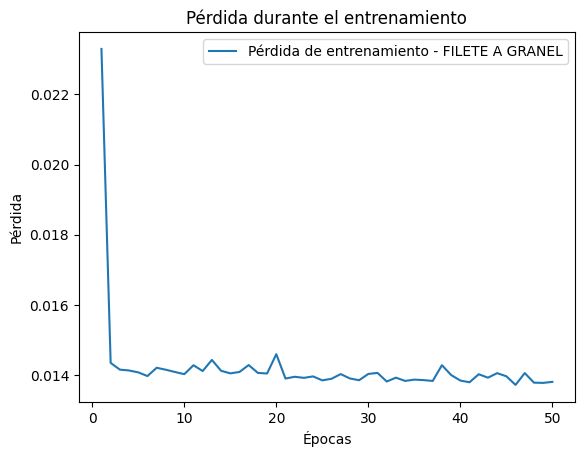

8/8 [==============================] - 0s 6ms/step


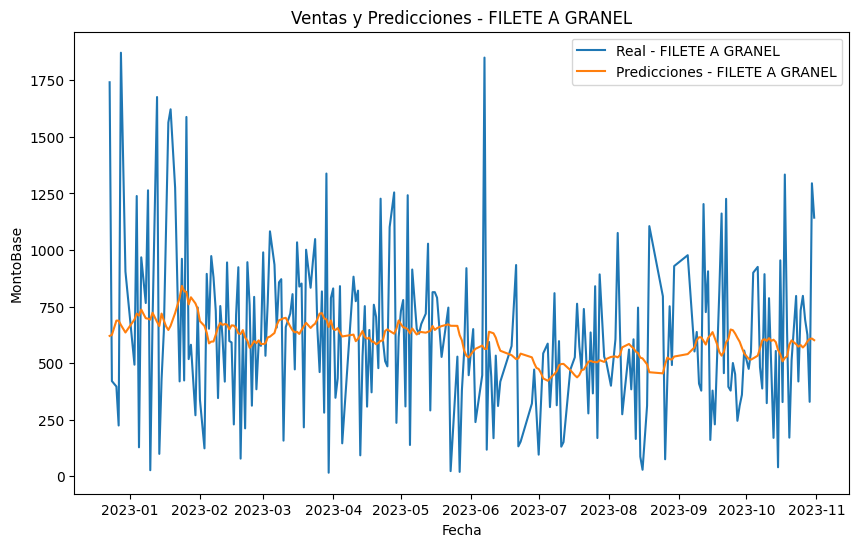

Dimensiones de fechas: (251,)
Dimensiones de predicciones: (250, 1)
La longitud de X_test es: 250 y la longitud de y_test es: 250
Forma de input_data: (22, 30, 1)
Forma de input_data después del reshape: (22, 30, 1)
1/1 [==============================] - 0s 37ms/step
                 P-V_LSTM_FILETE A GRANEL
FechaMovimiento                          
2023-11-01                              0
2023-11-02                              0
2023-11-03                              0
2023-11-04                              0
2023-11-05                              0
2023-11-06                              0
2023-11-07                              0
2023-11-08                              0
2023-11-09                              0
2023-11-10                              0
2023-11-11                              0
2023-11-12                              0
2023-11-13                              0
2023-11-14                              0
2023-11-15                              0
2023-11-16        

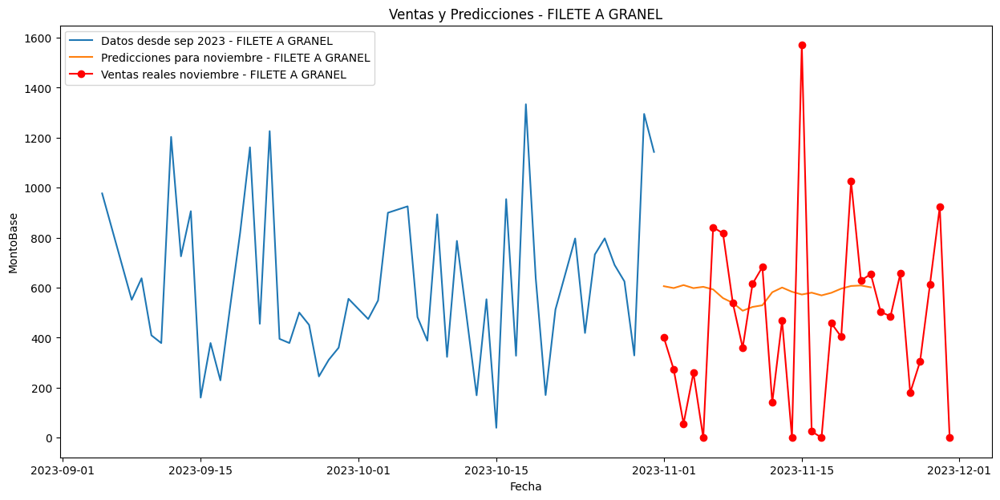

Epoch 1/50
33/33 - 3s - loss: 0.0086 - 3s/epoch - 90ms/step
Epoch 2/50
33/33 - 1s - loss: 0.0058 - 556ms/epoch - 17ms/step
Epoch 3/50
33/33 - 1s - loss: 0.0055 - 542ms/epoch - 16ms/step
Epoch 4/50
33/33 - 1s - loss: 0.0058 - 501ms/epoch - 15ms/step
Epoch 5/50
33/33 - 0s - loss: 0.0057 - 364ms/epoch - 11ms/step
Epoch 6/50
33/33 - 0s - loss: 0.0054 - 364ms/epoch - 11ms/step
Epoch 7/50
33/33 - 0s - loss: 0.0054 - 368ms/epoch - 11ms/step
Epoch 8/50
33/33 - 0s - loss: 0.0054 - 356ms/epoch - 11ms/step
Epoch 9/50
33/33 - 0s - loss: 0.0054 - 363ms/epoch - 11ms/step
Epoch 10/50
33/33 - 0s - loss: 0.0054 - 375ms/epoch - 11ms/step
Epoch 11/50
33/33 - 0s - loss: 0.0054 - 362ms/epoch - 11ms/step
Epoch 12/50
33/33 - 0s - loss: 0.0054 - 362ms/epoch - 11ms/step
Epoch 13/50
33/33 - 0s - loss: 0.0054 - 367ms/epoch - 11ms/step
Epoch 14/50
33/33 - 0s - loss: 0.0053 - 360ms/epoch - 11ms/step
Epoch 15/50
33/33 - 0s - loss: 0.0053 - 365ms/epoch - 11ms/step
Epoch 16/50
33/33 - 0s - loss: 0.0053 - 369ms/epoch 

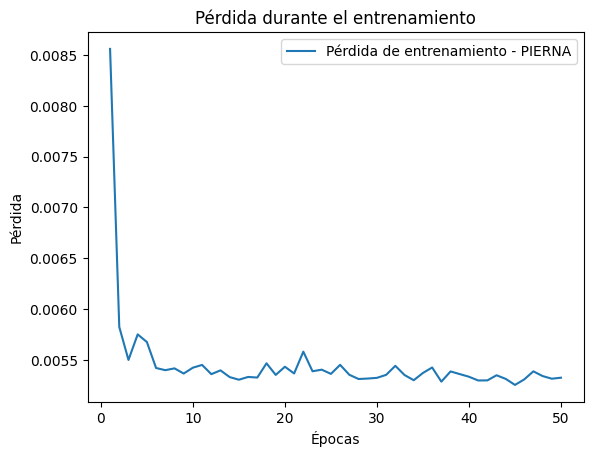

9/9 [==============================] - 1s 6ms/step


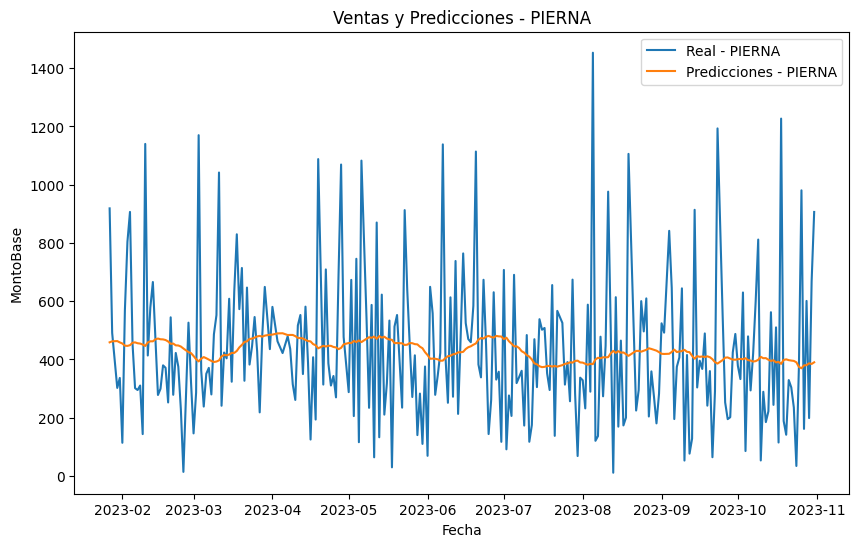

Dimensiones de fechas: (265,)
Dimensiones de predicciones: (264, 1)
La longitud de X_test es: 264 y la longitud de y_test es: 264
Forma de input_data: (29, 30, 1)
Forma de input_data después del reshape: (29, 30, 1)
1/1 [==============================] - 0s 27ms/step
                 P-V_LSTM_PIERNA
FechaMovimiento                 
2023-11-01                     0
2023-11-02                     0
2023-11-03                     0
2023-11-04                     0
2023-11-05                     0
2023-11-06                     0
2023-11-07                     0
2023-11-08                     0
2023-11-09                     0
2023-11-10                     0
2023-11-11                     0
2023-11-12                     0
2023-11-13                     0
2023-11-14                     0
2023-11-15                     0
2023-11-16                     0
2023-11-17                     0
2023-11-18                     0
2023-11-19                     0
2023-11-20                     0
2023-1

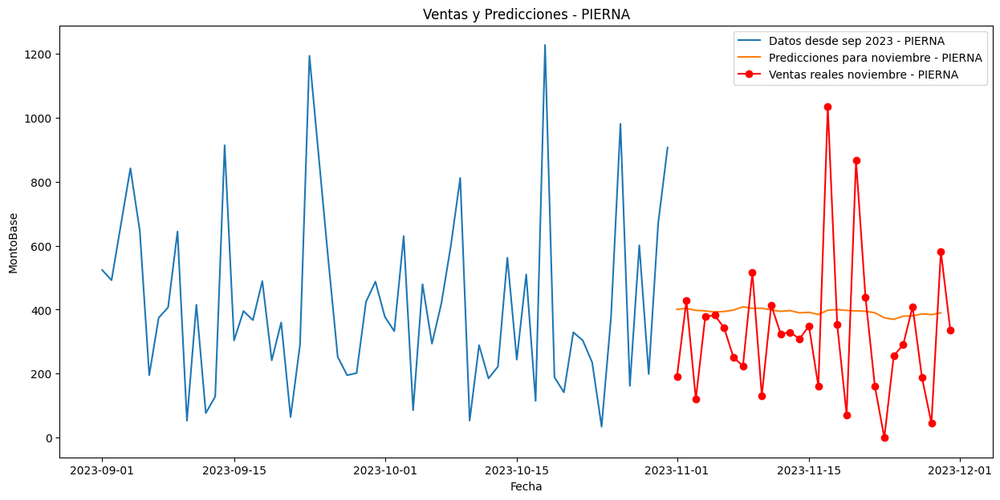

Epoch 1/50
32/32 - 3s - loss: 0.0303 - 3s/epoch - 80ms/step
Epoch 2/50
32/32 - 1s - loss: 0.0176 - 641ms/epoch - 20ms/step
Epoch 3/50
32/32 - 1s - loss: 0.0169 - 633ms/epoch - 20ms/step
Epoch 4/50
32/32 - 1s - loss: 0.0173 - 590ms/epoch - 18ms/step
Epoch 5/50
32/32 - 1s - loss: 0.0168 - 618ms/epoch - 19ms/step
Epoch 6/50
32/32 - 1s - loss: 0.0165 - 615ms/epoch - 19ms/step
Epoch 7/50
32/32 - 1s - loss: 0.0167 - 608ms/epoch - 19ms/step
Epoch 8/50
32/32 - 0s - loss: 0.0165 - 500ms/epoch - 16ms/step
Epoch 9/50
32/32 - 0s - loss: 0.0166 - 390ms/epoch - 12ms/step
Epoch 10/50
32/32 - 0s - loss: 0.0165 - 406ms/epoch - 13ms/step
Epoch 11/50
32/32 - 0s - loss: 0.0166 - 408ms/epoch - 13ms/step
Epoch 12/50
32/32 - 0s - loss: 0.0165 - 409ms/epoch - 13ms/step
Epoch 13/50
32/32 - 0s - loss: 0.0175 - 427ms/epoch - 13ms/step
Epoch 14/50
32/32 - 0s - loss: 0.0168 - 418ms/epoch - 13ms/step
Epoch 15/50
32/32 - 0s - loss: 0.0169 - 408ms/epoch - 13ms/step
Epoch 16/50
32/32 - 0s - loss: 0.0165 - 417ms/epoch 

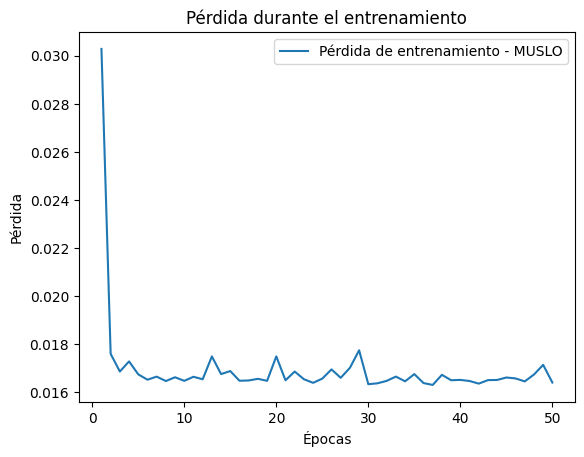

8/8 [==============================] - 1s 7ms/step


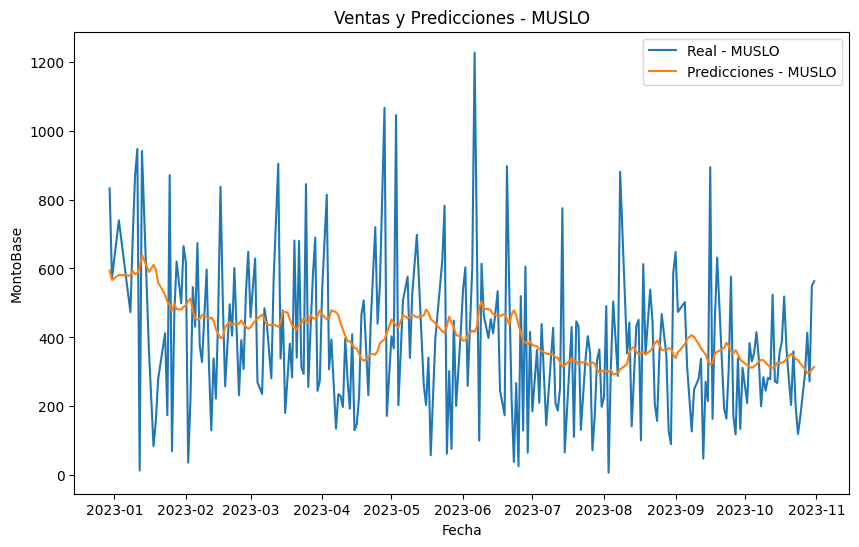

Dimensiones de fechas: (250,)
Dimensiones de predicciones: (249, 1)
La longitud de X_test es: 249 y la longitud de y_test es: 249
Forma de input_data: (23, 30, 1)
Forma de input_data después del reshape: (23, 30, 1)
1/1 [==============================] - 0s 27ms/step
                 P-V_LSTM_MUSLO
FechaMovimiento                
2023-11-01                    0
2023-11-02                    0
2023-11-03                    0
2023-11-04                    0
2023-11-05                    0
2023-11-06                    0
2023-11-07                    0
2023-11-08                    0
2023-11-09                    0
2023-11-10                    0
2023-11-11                    0
2023-11-12                    0
2023-11-13                    0
2023-11-14                    0
2023-11-15                    0
2023-11-16                    0
2023-11-17                    0
2023-11-18                    0
2023-11-19                    0
2023-11-20                    0
2023-11-21                  

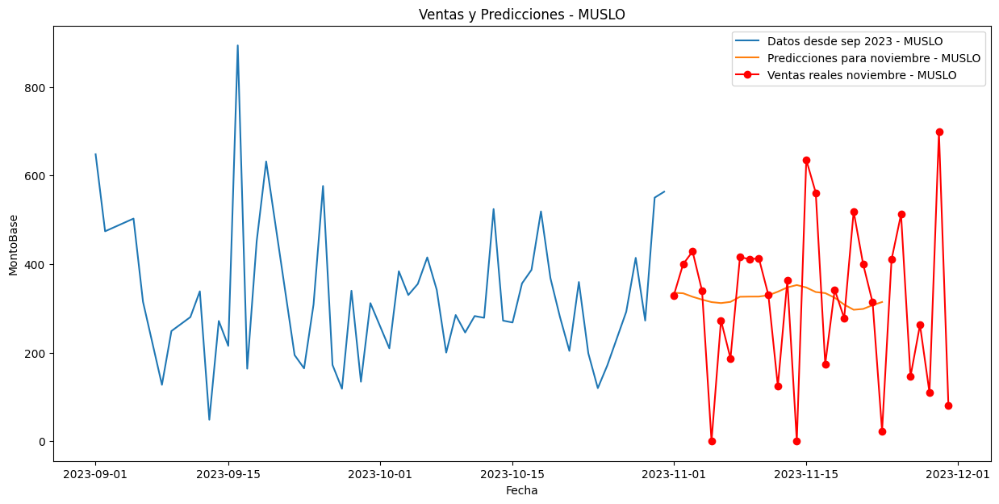

Epoch 1/50
19/19 - 2s - loss: 0.0229 - 2s/epoch - 122ms/step
Epoch 2/50
19/19 - 0s - loss: 0.0152 - 254ms/epoch - 13ms/step
Epoch 3/50
19/19 - 0s - loss: 0.0154 - 355ms/epoch - 19ms/step
Epoch 4/50
19/19 - 0s - loss: 0.0152 - 361ms/epoch - 19ms/step
Epoch 5/50
19/19 - 0s - loss: 0.0151 - 343ms/epoch - 18ms/step
Epoch 6/50
19/19 - 0s - loss: 0.0151 - 362ms/epoch - 19ms/step
Epoch 7/50
19/19 - 0s - loss: 0.0150 - 354ms/epoch - 19ms/step
Epoch 8/50
19/19 - 0s - loss: 0.0151 - 354ms/epoch - 19ms/step
Epoch 9/50
19/19 - 0s - loss: 0.0152 - 361ms/epoch - 19ms/step
Epoch 10/50
19/19 - 0s - loss: 0.0150 - 349ms/epoch - 18ms/step
Epoch 11/50
19/19 - 0s - loss: 0.0151 - 355ms/epoch - 19ms/step
Epoch 12/50
19/19 - 0s - loss: 0.0152 - 383ms/epoch - 20ms/step
Epoch 13/50
19/19 - 0s - loss: 0.0149 - 361ms/epoch - 19ms/step
Epoch 14/50
19/19 - 0s - loss: 0.0150 - 388ms/epoch - 20ms/step
Epoch 15/50
19/19 - 0s - loss: 0.0151 - 323ms/epoch - 17ms/step
Epoch 16/50
19/19 - 0s - loss: 0.0149 - 252ms/epoch

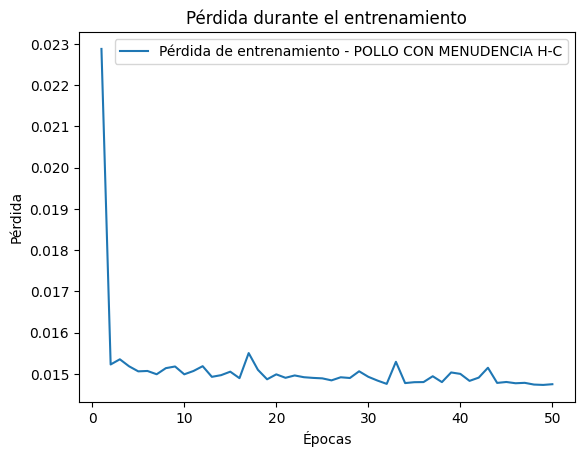

5/5 [==============================] - 0s 8ms/step


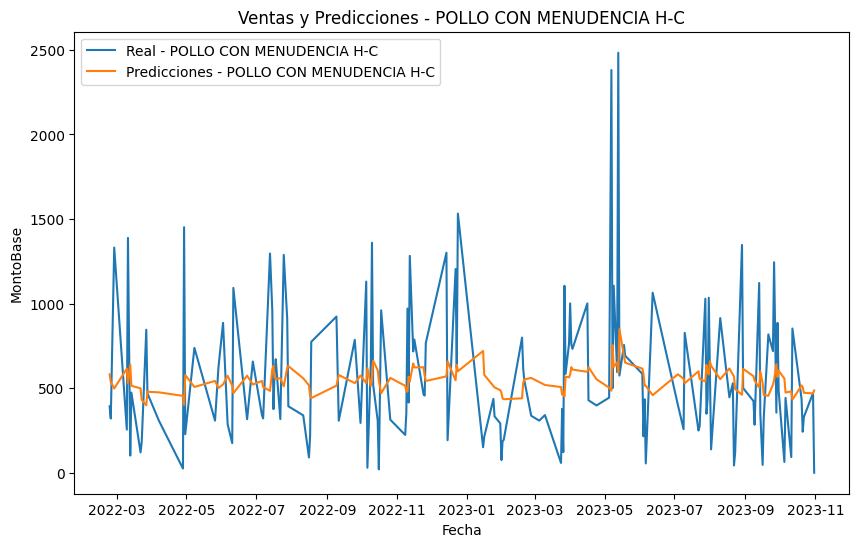

Dimensiones de fechas: (147,)
Dimensiones de predicciones: (146, 1)
La longitud de X_test es: 146 y la longitud de y_test es: 146
No hay suficientes datos después de '2023-09-01' para hacer predicciones futuras.
Epoch 1/50
6/6 - 2s - loss: 0.0659 - 2s/epoch - 318ms/step
Epoch 2/50
6/6 - 0s - loss: 0.0247 - 90ms/epoch - 15ms/step
Epoch 3/50
6/6 - 0s - loss: 0.0264 - 92ms/epoch - 15ms/step
Epoch 4/50
6/6 - 0s - loss: 0.0215 - 104ms/epoch - 17ms/step
Epoch 5/50
6/6 - 0s - loss: 0.0219 - 91ms/epoch - 15ms/step
Epoch 6/50
6/6 - 0s - loss: 0.0217 - 99ms/epoch - 17ms/step
Epoch 7/50
6/6 - 0s - loss: 0.0215 - 99ms/epoch - 17ms/step
Epoch 8/50
6/6 - 0s - loss: 0.0216 - 87ms/epoch - 14ms/step
Epoch 9/50
6/6 - 0s - loss: 0.0213 - 101ms/epoch - 17ms/step
Epoch 10/50
6/6 - 0s - loss: 0.0213 - 105ms/epoch - 17ms/step
Epoch 11/50
6/6 - 0s - loss: 0.0214 - 94ms/epoch - 16ms/step
Epoch 12/50
6/6 - 0s - loss: 0.0213 - 96ms/epoch - 16ms/step
Epoch 13/50
6/6 - 0s - loss: 0.0213 - 92ms/epoch - 15ms/step
Ep

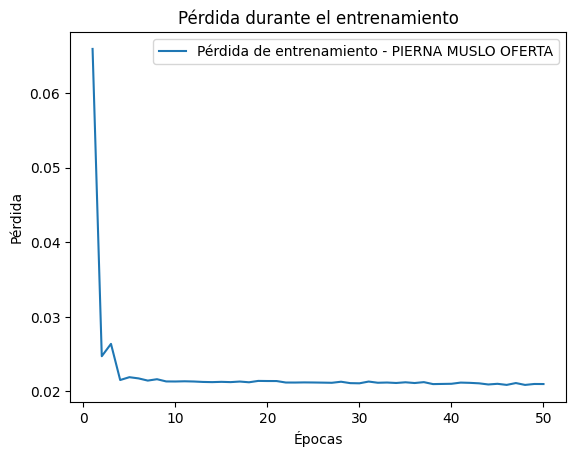

2/2 [==============================] - 1s 14ms/step


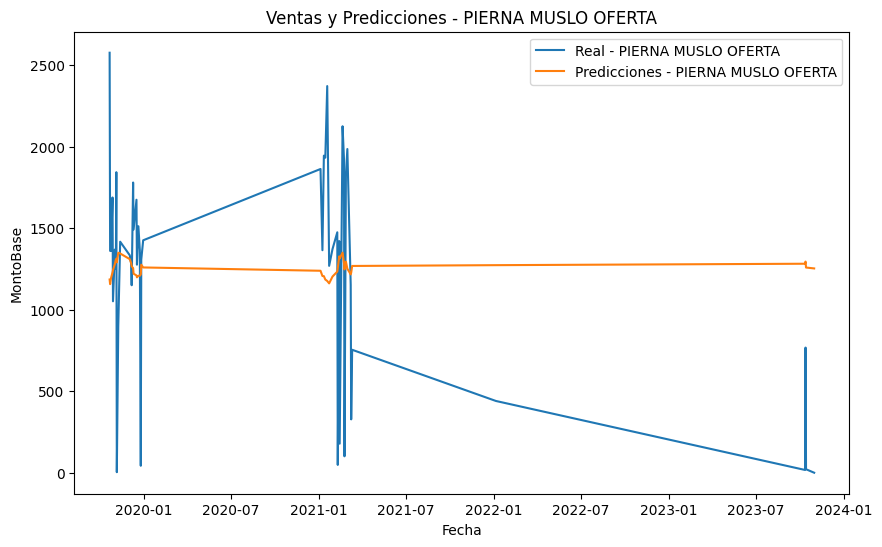

Dimensiones de fechas: (49,)
Dimensiones de predicciones: (48, 1)
La longitud de X_test es: 48 y la longitud de y_test es: 48
No hay suficientes datos después de '2023-09-01' para hacer predicciones futuras.
Epoch 1/50
26/26 - 3s - loss: 0.0435 - 3s/epoch - 133ms/step
Epoch 2/50
26/26 - 0s - loss: 0.0175 - 373ms/epoch - 14ms/step
Epoch 3/50
26/26 - 0s - loss: 0.0169 - 377ms/epoch - 15ms/step
Epoch 4/50
26/26 - 0s - loss: 0.0166 - 360ms/epoch - 14ms/step
Epoch 5/50
26/26 - 0s - loss: 0.0165 - 371ms/epoch - 14ms/step
Epoch 6/50
26/26 - 0s - loss: 0.0163 - 390ms/epoch - 15ms/step
Epoch 7/50
26/26 - 0s - loss: 0.0164 - 373ms/epoch - 14ms/step
Epoch 8/50
26/26 - 0s - loss: 0.0163 - 380ms/epoch - 15ms/step
Epoch 9/50
26/26 - 0s - loss: 0.0165 - 360ms/epoch - 14ms/step
Epoch 10/50
26/26 - 0s - loss: 0.0165 - 376ms/epoch - 14ms/step
Epoch 11/50
26/26 - 0s - loss: 0.0168 - 393ms/epoch - 15ms/step
Epoch 12/50
26/26 - 0s - loss: 0.0166 - 371ms/epoch - 14ms/step
Epoch 13/50
26/26 - 0s - loss: 0.01

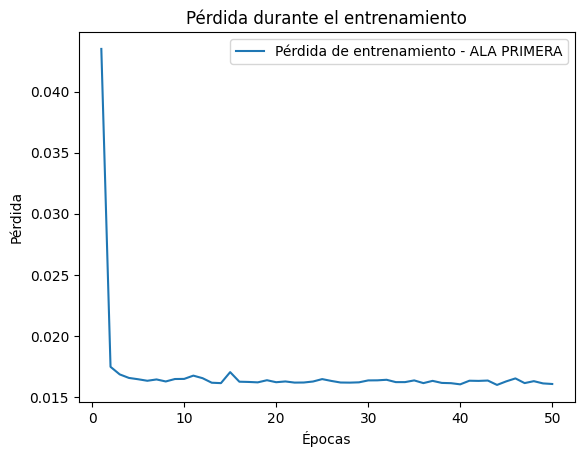

7/7 [==============================] - 1s 7ms/step


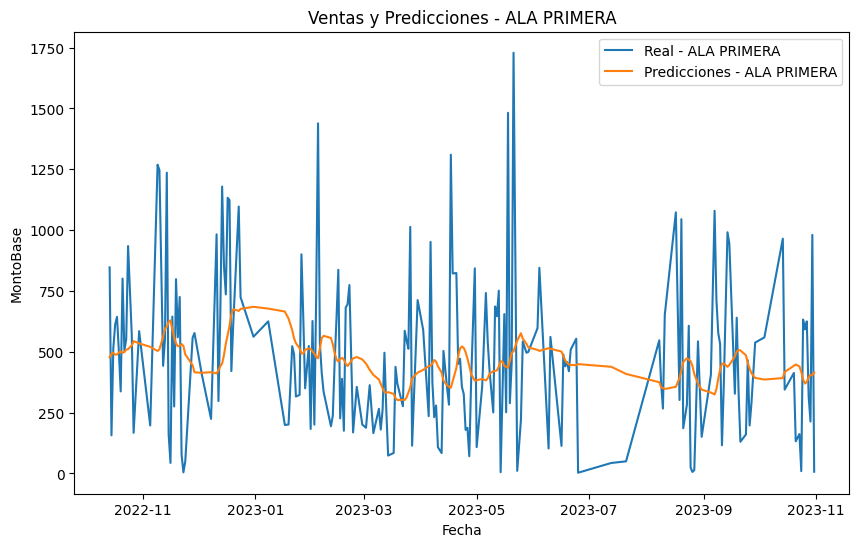

Dimensiones de fechas: (206,)
Dimensiones de predicciones: (205, 1)
La longitud de X_test es: 205 y la longitud de y_test es: 205
Forma de input_data: (2, 30, 1)
Forma de input_data después del reshape: (2, 30, 1)
1/1 [==============================] - 0s 25ms/step
                 P-V_LSTM_ALA PRIMERA
FechaMovimiento                      
2023-11-01                          0
2023-11-02                          0
2023-11-03                          0
2023-11-04                          0
2023-11-05                          0
2023-11-06                          0
2023-11-07                          0
2023-11-08                          0
2023-11-09                          0
2023-11-10                          0
2023-11-11                          0
2023-11-12                          0
2023-11-13                          0
2023-11-14                          0
2023-11-15                          0
2023-11-16                          0
2023-11-17                          0
2023-11-18  

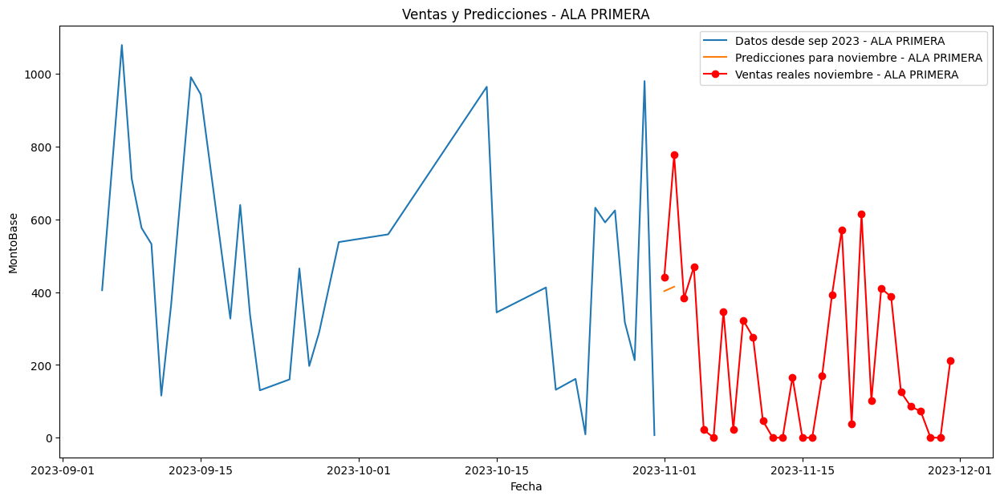

In [48]:
# Crear un DataFrame con fechas de noviembre y valores inicializados en 0
fechas_noviembre = pd.date_range(start='2023-11-01', end='2023-11-30')

# Iterar sobre los DataFrames en el objeto dfs_de_productos_sumados_lstm
for product, product_df_lstm in dfs_de_productos_sumados_lstm.items():

    # Normalizar los datos
    scaler = MinMaxScaler(feature_range=(0, 1))
    product_df_lstm['MontoBase_scaler'] = scaler.fit_transform(product_df_lstm['MontoBase'].values.reshape(-1, 1))

    # Crear secuencias temporales
    seq_length = 30
    X, y = create_sequences(product_df_lstm['MontoBase_scaler'].values, seq_length)

    # Dividir en conjuntos de entrenamiento y prueba
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Reshape para el modelo LSTM
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

    # Construir el modelo LSTM
    model = Sequential()
    model.add(LSTM(units=50, input_shape=(X_train.shape[1], 1)))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Entrenar el modelo
    history = model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=2)

    # Visualizar la pérdida durante el entrenamiento
    loss = history.history['loss']
    epochs = range(1, len(loss) + 1)
    plt.plot(epochs, loss, label=f'Pérdida de entrenamiento - {product}')
    plt.title('Pérdida durante el entrenamiento')
    plt.xlabel('Épocas')
    plt.ylabel('Pérdida')
    plt.legend()
    plt.show()
    # Hacer predicciones en el conjunto de prueba
    predictions = model.predict(X_test)

    # Desnormalizar las predicciones
    predictions = scaler.inverse_transform(predictions)

    # Visualizar las predicciones
    plt.figure(figsize=(10, 6))
    plt.plot(product_df_lstm.index[train_size+seq_length:], product_df_lstm['MontoBase'].values[train_size+seq_length:], label='Real - ' + product)
    plt.plot(product_df_lstm.index[train_size+seq_length:], predictions, label='Predicciones - ' + product)
    plt.title('Ventas y Predicciones - ' + product)
    plt.xlabel('Fecha')
    plt.ylabel('MontoBase')
    plt.legend()
    plt.show()

    # Hacer predicciones para el futuro
    last_data = product_df_lstm[product_df_lstm.index >= '2023-09-01']['MontoBase'].values


    print("Dimensiones de fechas:", product_df_lstm.index[train_size+seq_length-1:].shape)
    print("Dimensiones de predicciones:", predictions.shape)

    print(f'La longitud de X_test es: {X_test.shape[0]} y la longitud de y_test es: {y_test.shape[0]}')

    # Verificar si hay datos disponibles después de '2023-09-01'
    if len(last_data) >= seq_length:
        last_data = scaler.transform(last_data.reshape(-1, 1))
        input_data, _ = create_sequences(last_data, seq_length)

        # Imprimir la forma de input_data para depuración
        print("Forma de input_data:", input_data.shape)

        # Verificar si input_data está vacío antes del reshape
        if input_data.shape[0] == 0:
            print("¡Error! input_data está vacío.")
        else:
            # Reshape para el modelo LSTM
            input_data = input_data.reshape((input_data.shape[0], input_data.shape[1], 1))
            # Imprimir la forma después del reshape para depuración
            print("Forma de input_data después del reshape:", input_data.shape)

        # Hacer predicciones para el futuro
        predictions_future = model.predict(input_data)
        #predictions_future_nov = model.predict(last_data)

#df_todo_hasta_nov['FechaMovimiento'] = pd.to_datetime(df_todo_hasta_nov['FechaMovimiento'])

        # Crear un DataFrame con fechas de noviembre y valores inicializados en 0
        fechas_noviembre = pd.date_range(start='2023-11-01', end='2023-11-30')
        predicciones_df_lstm = pd.DataFrame(index=fechas_noviembre)
        predicciones_df_lstm['FechaMovimiento'] = fechas_noviembre  # Agregar la columna de fechas
        predicciones_df_lstm.set_index('FechaMovimiento', inplace=True)
        predicciones_df_lstm[f'P-V_LSTM_{product}'] = 0

        # Imprimir el DataFrame inicial para depuración
        print(predicciones_df_lstm)

        # Desnormalizar las predicciones
        predictions_future = scaler.inverse_transform(predictions_future)

        # Actualizar las predicciones reales en las fechas correspondientes
        predicciones_df_lstm.loc[fechas_noviembre[:len(predictions_future)], f'P-V_LSTM_{product}'] = predictions_future.flatten()

        # Imprimir el DataFrame actualizado para depuración
        print(predicciones_df_lstm)

        # Agregar la columna al DataFrame original
        dfs_noviembre_sumados[product][f'P-V_LSTM_{product}'] = predicciones_df_lstm[f'P-V_LSTM_{product}']

        # Visualizar los resultados
        plt.figure(figsize=(15, 7))
        # Datos de venta desde el 1ro de septiembre de 2023
        start_date = '2023-09-01'
        end_date = '2023-11-30'
        plt.plot(product_df_lstm.index[product_df_lstm.index >= start_date], product_df_lstm['MontoBase'][product_df_lstm.index >= start_date], label='Datos desde sep 2023 - ' + product)
        # Predicciones para el futuro (noviembre)
        dates_future = pd.date_range(start='2023-11-01', periods=len(predictions_future))
        plt.plot(dates_future[:len(predictions_future)], predictions_future, label='Predicciones para noviembre - ' + product)
        # Datos reales de noviembre
        real_november_data = dfs_noviembre_sumados[product]
        plt.plot(real_november_data.index, real_november_data['MontoBase'], 'o-', color='red', label='Ventas reales noviembre - ' + product)
        plt.title('Ventas y Predicciones - ' + product)
        plt.xlabel('Fecha')
        plt.ylabel('MontoBase')
        plt.legend()
        plt.show()
    else:
        print("No hay suficientes datos después de '2023-09-01' para hacer predicciones futuras.")
        # # Almacenar las predicciones en el objeto principal
        # dfs_noviembre_sumados[product] = pd.merge(dfs_noviembre_sumados[product], predictions_df_lstm, on='FechaMovimiento', how='left')

In [49]:
print(dfs_noviembre_sumados['POLLO SIN MENUDENCIA H-C'].dtypes)
print(dfs_noviembre_sumados)

NombreProducto                           object
MontoBase                               float64
P-V_PROPHET_POLLO SIN MENUDENCIA H-C    float64
P-V_LSTM_POLLO SIN MENUDENCIA H-C       float64
dtype: object
{'POLLO ESPECIAL':                  NombreProducto  MontoBase  P-V_PROPHET_POLLO ESPECIAL  \
FechaMovimiento                                                          
2023-11-01       POLLO ESPECIAL  1999.7321                   1895.6506   
2023-11-02       POLLO ESPECIAL  1011.2892                   1746.4883   
2023-11-03       POLLO ESPECIAL  2343.7883                   1974.1762   
2023-11-04       POLLO ESPECIAL  1673.2089                   2329.7085   
2023-11-05       POLLO ESPECIAL  1181.9289                   1580.3323   
2023-11-06       POLLO ESPECIAL   863.7984                   1893.1272   
2023-11-07       POLLO ESPECIAL  1648.4580                   1842.9443   
2023-11-08       POLLO ESPECIAL  1434.6711                   1905.5561   
2023-11-09       POLLO ESPECIAL  16

## Evaluar LSTM




In [50]:
for product, product_df in dfs_noviembre_sumados.items():
    # print(product_df.head(30))

    # Verificar si la columna 'P-V_LSTM_{product}' existe
    if f'P-V_LSTM_{product}' in dfs_noviembre_sumados[product].columns:
        print(f'evaluacion del producto: {product}')
        # Puedes acceder a cada DataFrame individualmente para realizar evaluaciones métricas
        evaluacion_metrica(
            dfs_noviembre_sumados[product]['MontoBase'],
            dfs_noviembre_sumados[product][f'P-V_LSTM_{product}']
        )
        print('\n')
    else:
        print(f"No hay predicciones para {product}.")

evaluacion del producto: POLLO ESPECIAL
Evaluation metric results:  
MSE is : 706023.466414493
MAE is : 635.013849700521
R2 is : -0.9438935977685492 %
------------------------------
RMSE is : 840.2520255342995
MAPE is : 104.0061764071006 %
------------------------------
------------------------------
Días reales calculados: 29
Días omitidos: 1
Total de días: 30
------------------------------




evaluacion del producto: POLLO SIN MENUDENCIA H-C
Evaluation metric results:  
MSE is : 257839.08319209795
MAE is : 375.53454137695314
R2 is : -0.055385035160173235 %
------------------------------
RMSE is : 507.7785769329954
MAPE is : 73.8981671190062 %
------------------------------
------------------------------
Días reales calculados: 29
Días omitidos: 1
Total de días: 30
------------------------------




evaluacion del producto: PECHUGA
Evaluation metric results:  
MSE is : 91178.16296851369
MAE is : 227.18248701822918
R2 is : 0.21508193136250997 %
------------------------------
RMSE is :

# ARIMA

In [51]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 10.4 MB/s eta 0:00:00


In [52]:
import pandas as pd
import matplotlib.pyplot as plt
#from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

from pmdarima import auto_arima

In [53]:
dfs_de_productos_sumados_arima['POLLO SIN MENUDENCIA H-C'].dtypes

NombreProducto     object
MontoBase         float64
dtype: object

In [54]:
dfs_de_productos_sumados_arima['POLLO SIN MENUDENCIA H-C'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1347 entries, 2018-11-08 to 2023-10-31
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NombreProducto  1347 non-null   object 
 1   MontoBase       1347 non-null   float64
dtypes: float64(1), object(1)
memory usage: 31.6+ KB


Predicciones para POLLO ESPECIAL:


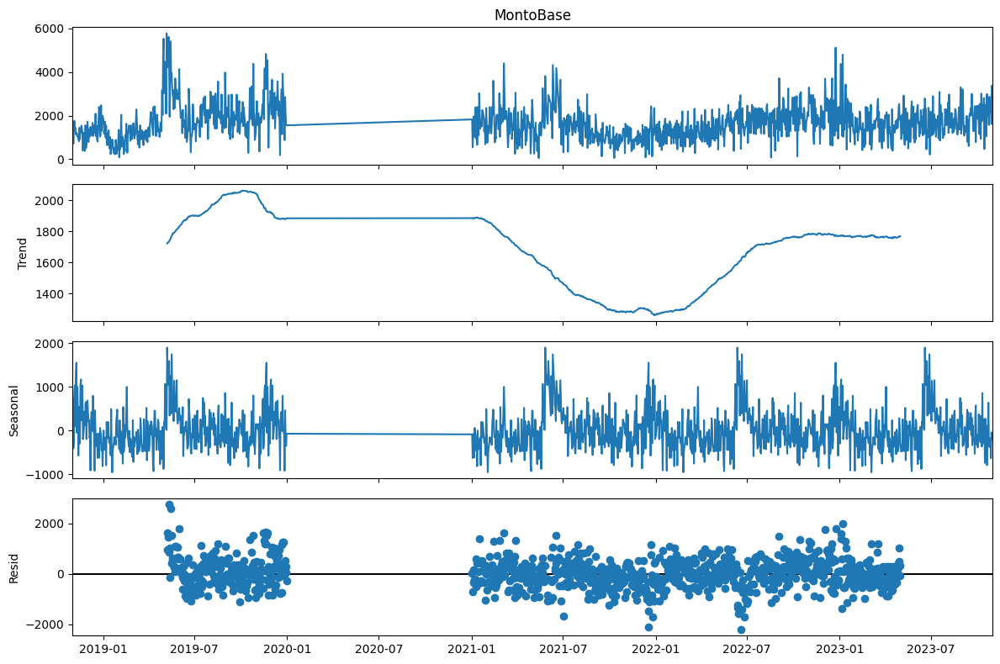

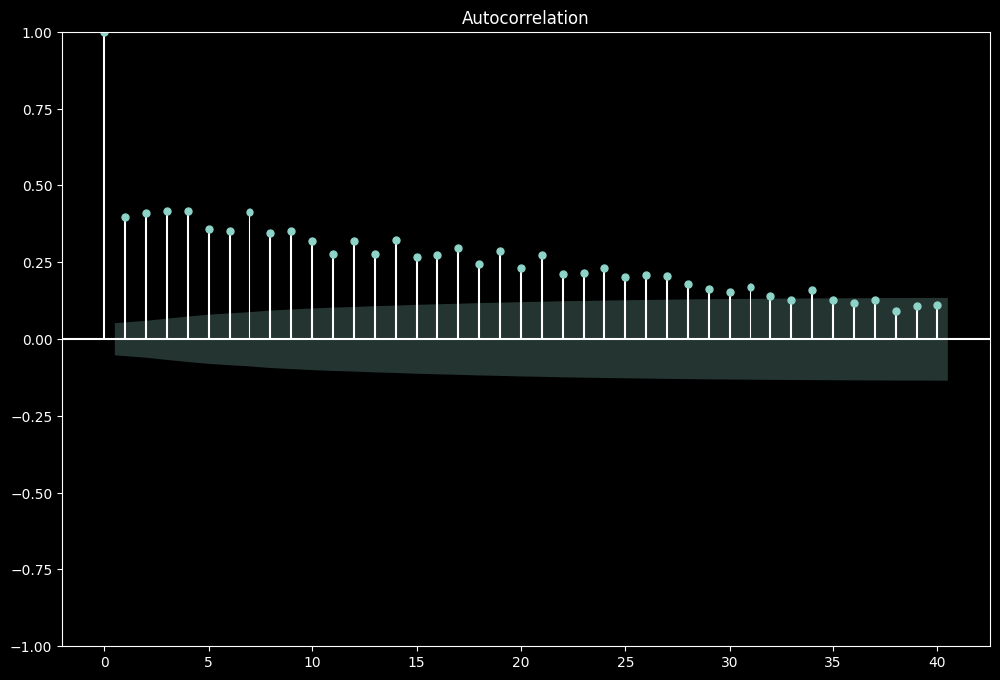

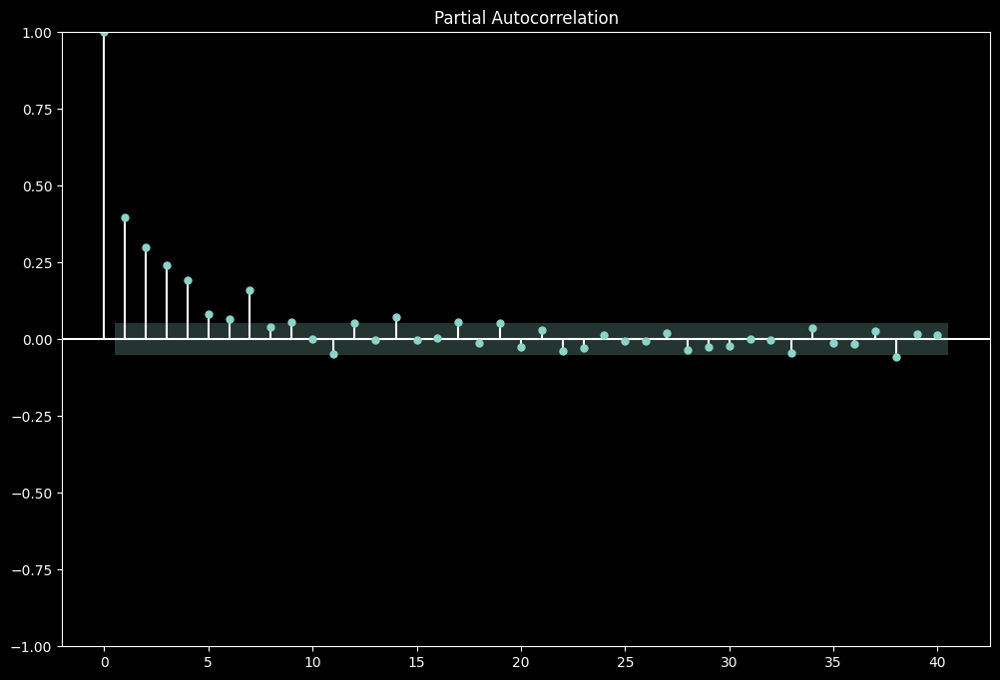

(1380, 2) (31, 2)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=21848.078, Time=4.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=22600.905, Time=0.12 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=22198.961, Time=1.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=21840.811, Time=5.82 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=22598.907, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=21838.868, Time=1.45 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=21840.810, Time=6.47 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=21842.551, Time=13.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=21839.752, Time=3.03 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=21839.723, Time=2.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=22197.697, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=21842.118, Time=4.74 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=21836.901, Time=0.91 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=21838.842, 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/

el ultimo indice_valor de los datos reales es: 1380,
se supone que deeria acabar 30 despues, pero la funcion indica: 1409 

2023-10-01   1931.8793
2023-10-02   1931.8793
2023-10-03   1931.8793
2023-10-04   1931.8793
2023-10-05   1931.8793
2023-10-06   1931.8793
2023-10-07   1931.8793
2023-10-08   1931.8793
2023-10-09   1931.8793
2023-10-10   1931.8793
2023-10-11   1931.8793
2023-10-12   1931.8793
2023-10-13   1931.8793
2023-10-14   1931.8793
2023-10-15   1931.8793
2023-10-16   1931.8793
2023-10-17   1931.8793
2023-10-18   1931.8793
2023-10-19   1931.8793
2023-10-20   1931.8793
2023-10-21   1931.8793
2023-10-22   1931.8793
2023-10-23   1931.8793
2023-10-24   1931.8793
2023-10-25   1931.8793
2023-10-26   1931.8793
2023-10-27   1931.8793
2023-10-28   1931.8793
2023-10-29   1931.8793
2023-10-30   1931.8793
Freq: D, Name: ARIMA Predictions POLLO ESPECIAL, dtype: float64

Ventas reales y predicciones ARIMA para POLLO ESPECIAL:
                 MontoBase  P-V_ARIMA_POLLO ESPECIAL
FechaMovimie

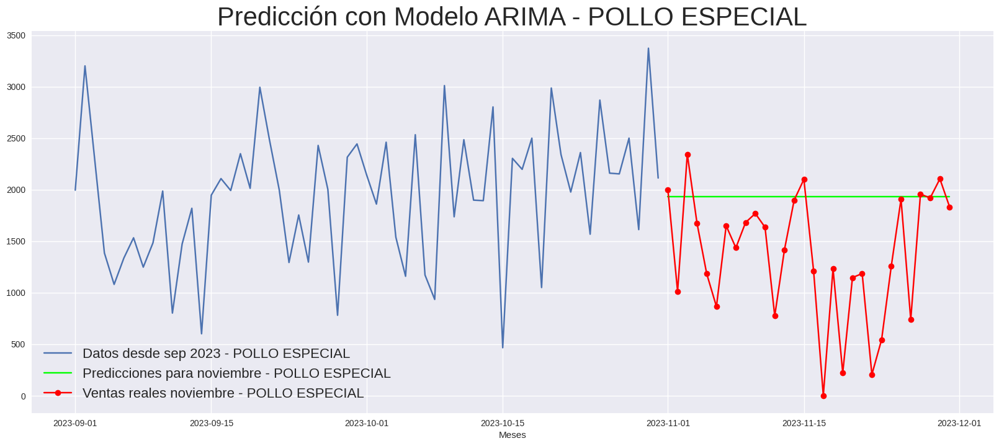

Predicciones para POLLO SIN MENUDENCIA H-C:


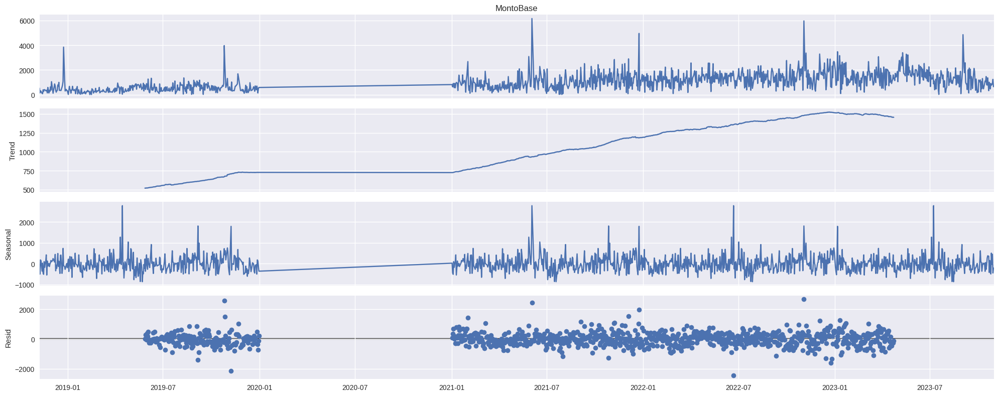

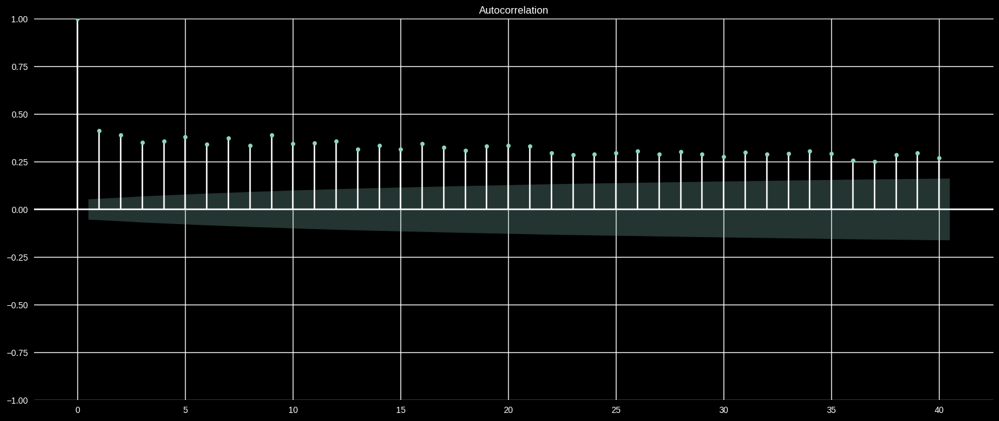

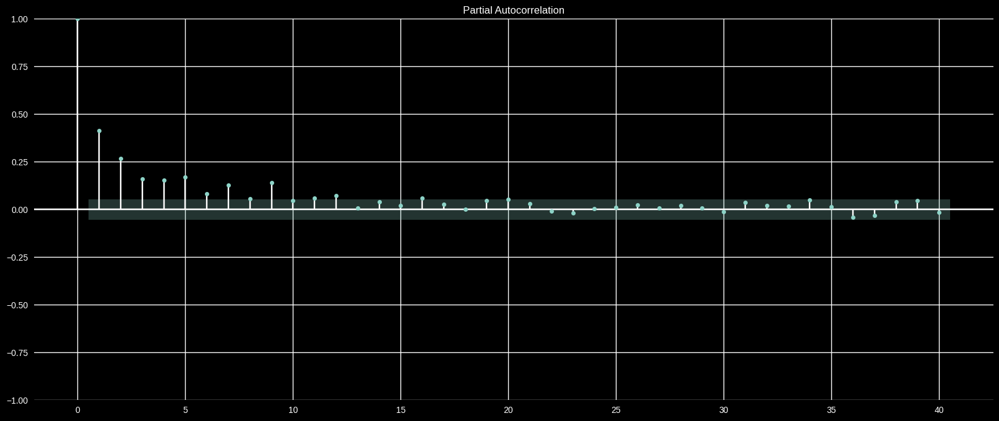

(1316, 2) (31, 2)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=20456.244, Time=7.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=21178.118, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=20834.775, Time=0.70 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=20452.854, Time=3.54 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=21176.119, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=20451.264, Time=0.67 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=20452.882, Time=2.40 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=3.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=20447.469, Time=1.17 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=20448.533, Time=3.27 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=20448.472, Time=5.08 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=5.84 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=20834.126, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=20446.955, Time=1.59 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/

el ultimo indice_valor de los datos reales es: 1316,
se supone que deeria acabar 30 despues, pero la funcion indica: 1345 

2023-09-29   1226.8250
2023-09-30   1243.4444
2023-10-01   1269.5292
2023-10-02   1272.5187
2023-10-03   1274.0233
2023-10-04   1274.2934
2023-10-05   1274.3884
2023-10-06   1274.4093
2023-10-07   1274.4157
2023-10-08   1274.4172
2023-10-09   1274.4176
2023-10-10   1274.4177
2023-10-11   1274.4178
2023-10-12   1274.4178
2023-10-13   1274.4178
2023-10-14   1274.4178
2023-10-15   1274.4178
2023-10-16   1274.4178
2023-10-17   1274.4178
2023-10-18   1274.4178
2023-10-19   1274.4178
2023-10-20   1274.4178
2023-10-21   1274.4178
2023-10-22   1274.4178
2023-10-23   1274.4178
2023-10-24   1274.4178
2023-10-25   1274.4178
2023-10-26   1274.4178
2023-10-27   1274.4178
2023-10-28   1274.4178
Freq: D, Name: ARIMA Predictions POLLO SIN MENUDENCIA H-C, dtype: float64

Ventas reales y predicciones ARIMA para POLLO SIN MENUDENCIA H-C:
                 MontoBase  P-V_ARIMA_POLLO S

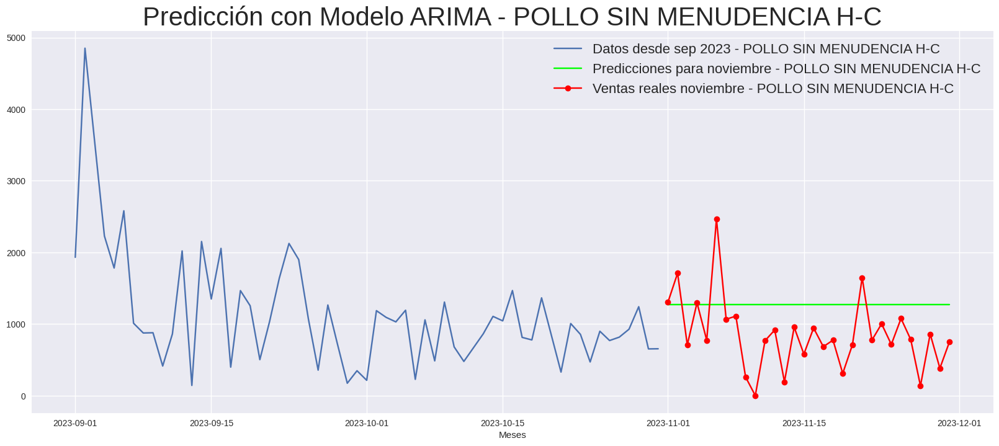

Predicciones para PECHUGA:


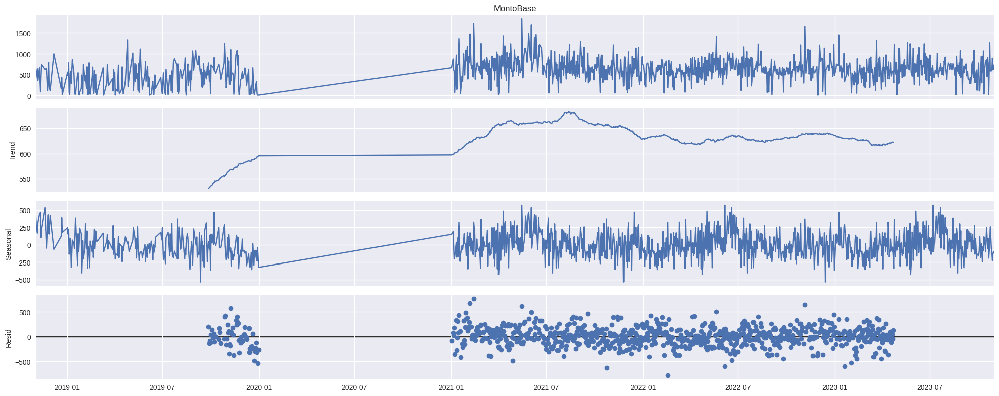

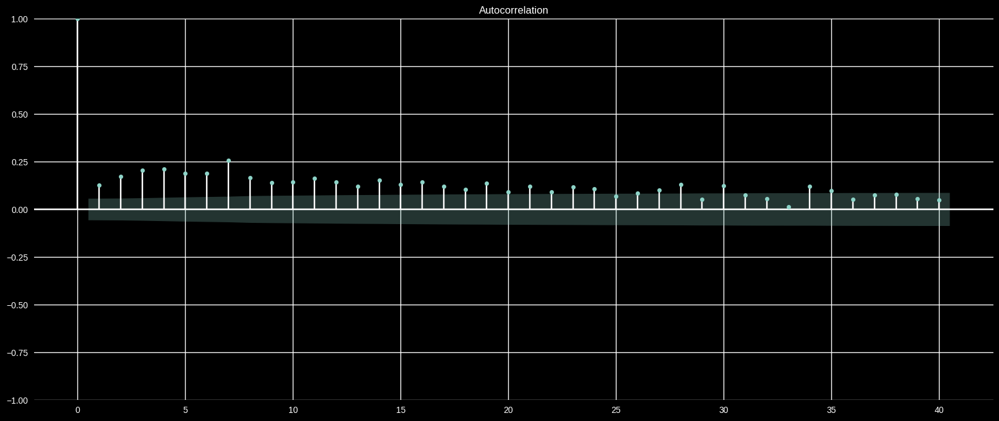

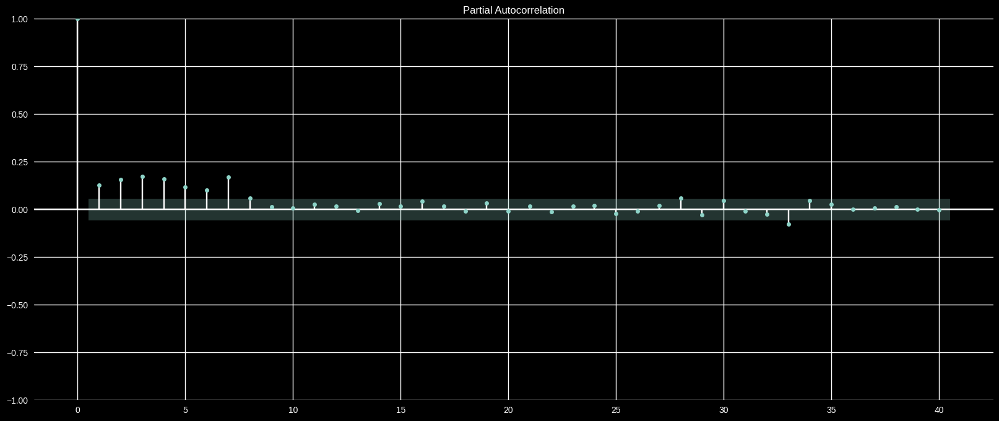

(1167, 2) (31, 2)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=16306.741, Time=8.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=17086.254, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=16720.220, Time=0.46 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=16307.147, Time=1.98 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17084.254, Time=0.04 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=16305.228, Time=4.24 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=16303.694, Time=3.00 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=16305.060, Time=6.55 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=16302.062, Time=1.63 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=16303.561, Time=5.42 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=16303.553, Time=5.73 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=16305.120, Time=5.42 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=16301.069, Time=1.04 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=16302.755, T

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/

el ultimo indice_valor de los datos reales es: 1167,
se supone que deeria acabar 30 despues, pero la funcion indica: 1196 

2023-09-27   557.8547
2023-09-28   544.3989
2023-09-29   544.3989
2023-09-30   544.3989
2023-10-01   544.3989
2023-10-02   544.3989
2023-10-03   544.3989
2023-10-04   544.3989
2023-10-05   544.3989
2023-10-06   544.3989
2023-10-07   544.3989
2023-10-08   544.3989
2023-10-09   544.3989
2023-10-10   544.3989
2023-10-11   544.3989
2023-10-12   544.3989
2023-10-13   544.3989
2023-10-14   544.3989
2023-10-15   544.3989
2023-10-16   544.3989
2023-10-17   544.3989
2023-10-18   544.3989
2023-10-19   544.3989
2023-10-20   544.3989
2023-10-21   544.3989
2023-10-22   544.3989
2023-10-23   544.3989
2023-10-24   544.3989
2023-10-25   544.3989
2023-10-26   544.3989
Freq: D, Name: ARIMA Predictions PECHUGA, dtype: float64

Ventas reales y predicciones ARIMA para PECHUGA:
                 MontoBase  P-V_ARIMA_PECHUGA
FechaMovimiento                              
2023-11-01       

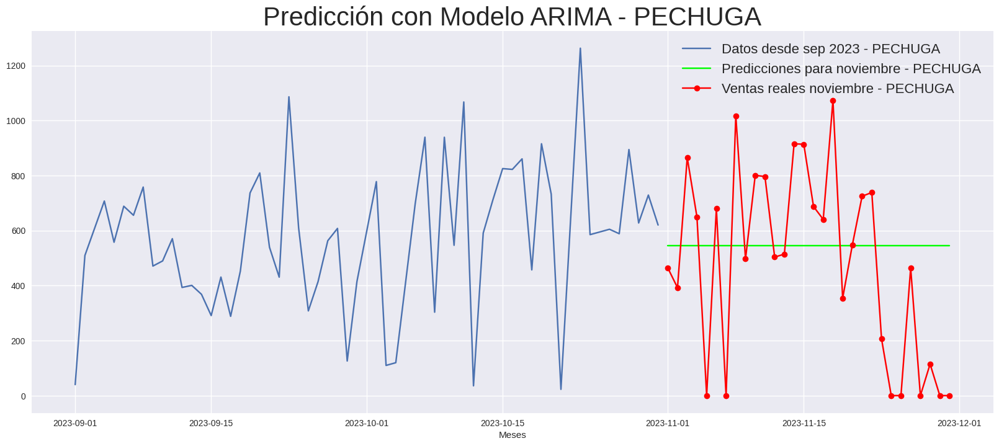

Predicciones para PIERNA MUSLO:


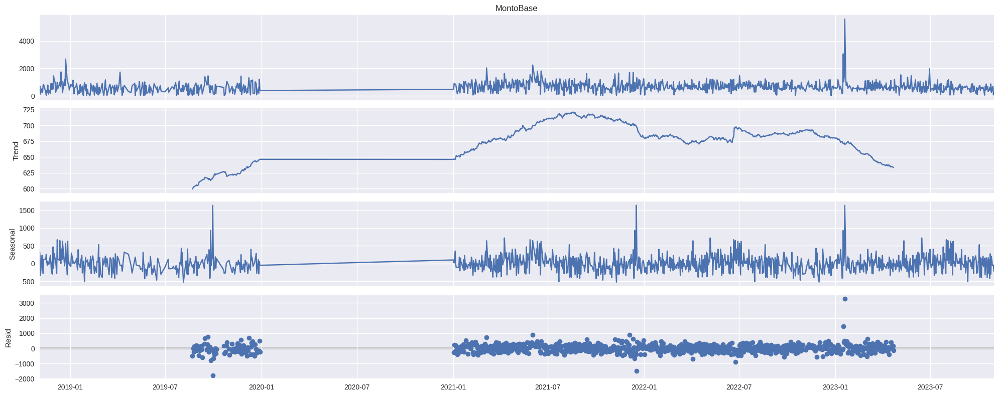

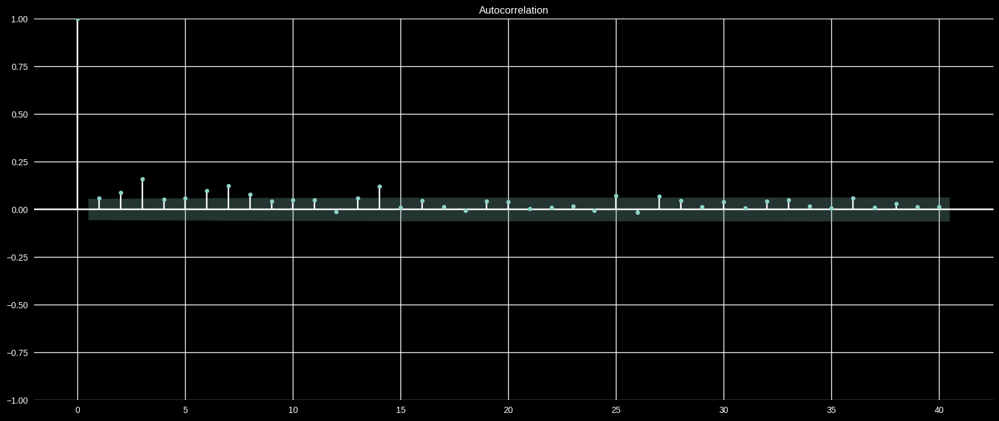

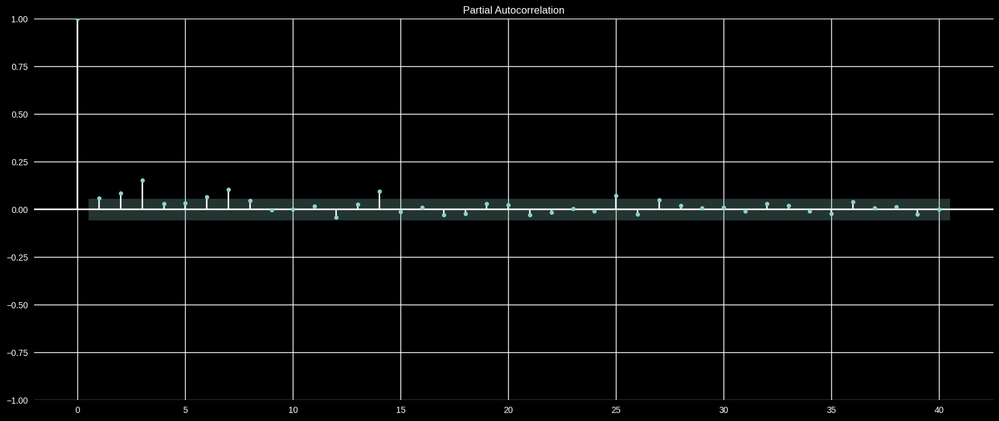

(1177, 2) (31, 2)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=17176.620, Time=8.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=17950.743, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=17580.212, Time=0.71 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=17171.861, Time=1.86 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17948.744, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=17176.718, Time=0.52 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=17172.491, Time=3.57 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=17171.320, Time=8.61 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=10.87 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=17946.504, Time=1.00 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=17172.993, Time=9.87 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=17173.007, Time=10.58 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=17581.816, Time=1.82 sec
 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=17170.161, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/stat

el ultimo indice_valor de los datos reales es: 1177,
se supone que deeria acabar 30 despues, pero la funcion indica: 1206 

2023-10-01   486.8600
2023-10-02   508.2335
2023-10-03   493.8761
2023-10-04   544.6184
2023-10-05   543.7301
2023-10-06   516.7213
2023-10-07   538.4119
2023-10-08   560.2493
2023-10-09   569.5391
2023-10-10   537.4683
2023-10-11   578.3050
2023-10-12   546.6881
2023-10-13   546.9297
2023-10-14   547.7503
2023-10-15   548.4856
2023-10-16   549.1446
2023-10-17   549.7352
2023-10-18   550.2646
2023-10-19   550.7389
2023-10-20   551.1640
2023-10-21   551.5450
2023-10-22   551.8865
2023-10-23   552.1925
2023-10-24   552.4667
2023-10-25   552.7125
2023-10-26   552.9328
2023-10-27   553.1302
2023-10-28   553.3071
2023-10-29   553.4656
2023-10-30   553.6077
Freq: D, Name: ARIMA Predictions PIERNA MUSLO, dtype: float64

Ventas reales y predicciones ARIMA para PIERNA MUSLO:
                 MontoBase  P-V_ARIMA_PIERNA MUSLO
FechaMovimiento                                 

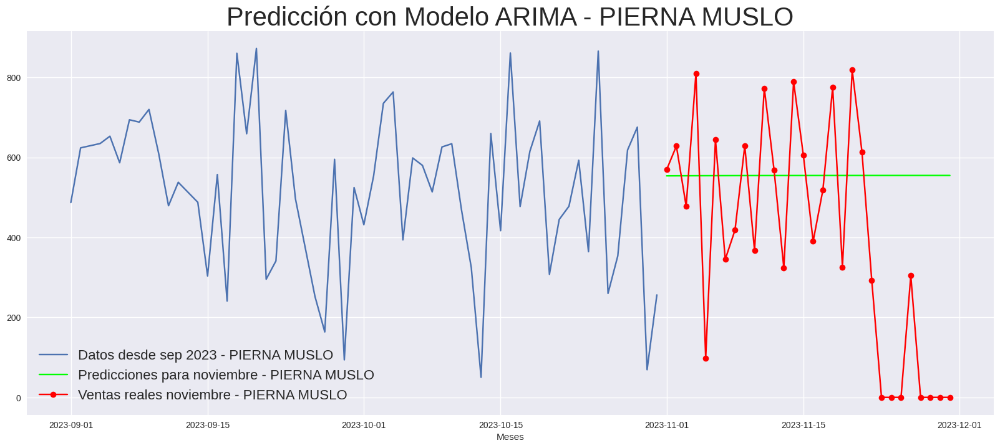

Predicciones para FILETE A GRANEL:


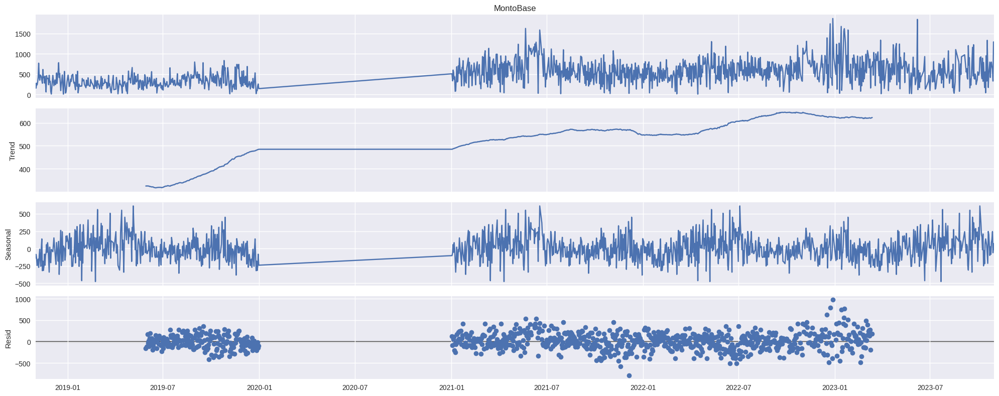

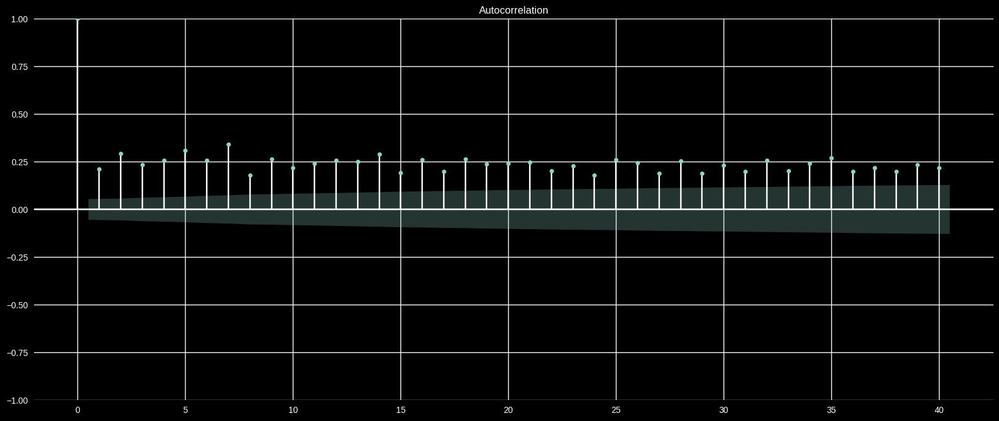

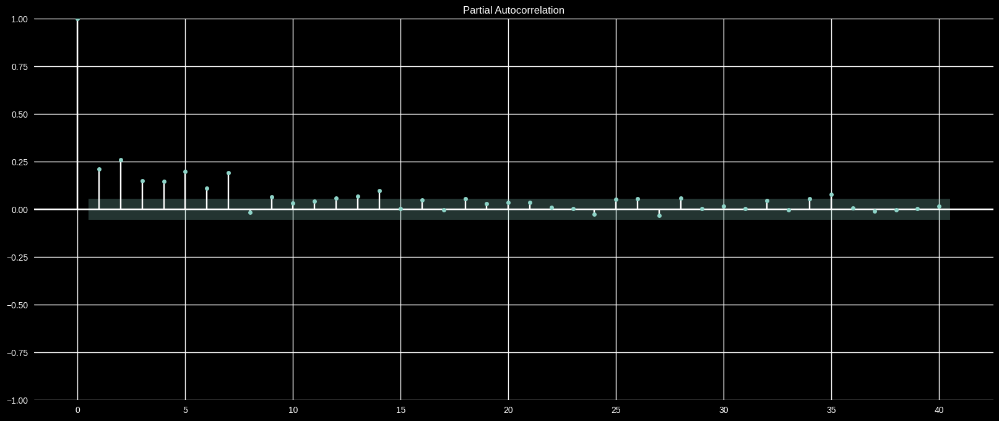

(1248, 2) (31, 2)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=17293.267, Time=6.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=18170.346, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=17718.243, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=17295.789, Time=2.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=18168.346, Time=0.07 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=17294.090, Time=7.03 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=17294.093, Time=6.28 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=17286.552, Time=21.33 sec
 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=17286.196, Time=17.84 sec
 ARIMA(1,1,2)(2,0,0)[12] intercept   : AIC=17282.968, Time=16.09 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=17291.413, Time=7.06 sec
 ARIMA(1,1,2)(2,0,1)[12] intercept   : AIC=17289.953, Time=15.75 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=17297.011, Time=6.81 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=17283.03

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/

el ultimo indice_valor de los datos reales es: 1248,
se supone que deeria acabar 30 despues, pero la funcion indica: 1277 

2023-09-28   566.0655
2023-09-29   568.1130
2023-09-30   518.2383
2023-10-01   518.9030
2023-10-02   552.6063
2023-10-03   552.5956
2023-10-04   571.7768
2023-10-05   580.2453
2023-10-06   492.2619
2023-10-07   536.3511
2023-10-08   523.4114
2023-10-09   604.4789
2023-10-10   577.2847
2023-10-11   594.5489
2023-10-12   561.5942
2023-10-13   536.4338
2023-10-14   494.7868
2023-10-15   574.3616
2023-10-16   495.5748
2023-10-17   578.2845
2023-10-18   571.2140
2023-10-19   561.8754
2023-10-20   574.7395
2023-10-21   592.8520
2023-10-22   556.0149
2023-10-23   558.9545
2023-10-24   558.7199
2023-10-25   558.7386
2023-10-26   558.7371
2023-10-27   558.7373
Freq: D, Name: ARIMA Predictions FILETE A GRANEL, dtype: float64

Ventas reales y predicciones ARIMA para FILETE A GRANEL:
                 MontoBase  P-V_ARIMA_FILETE A GRANEL
FechaMovimiento                        

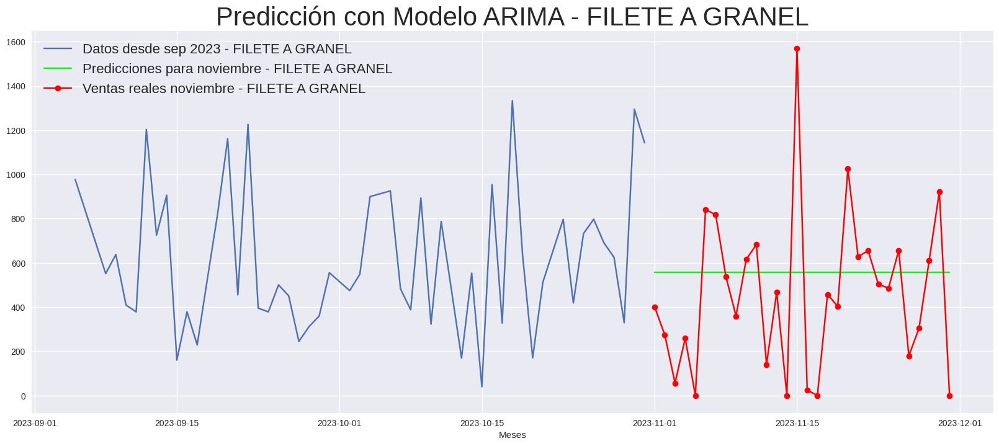

Predicciones para PIERNA:


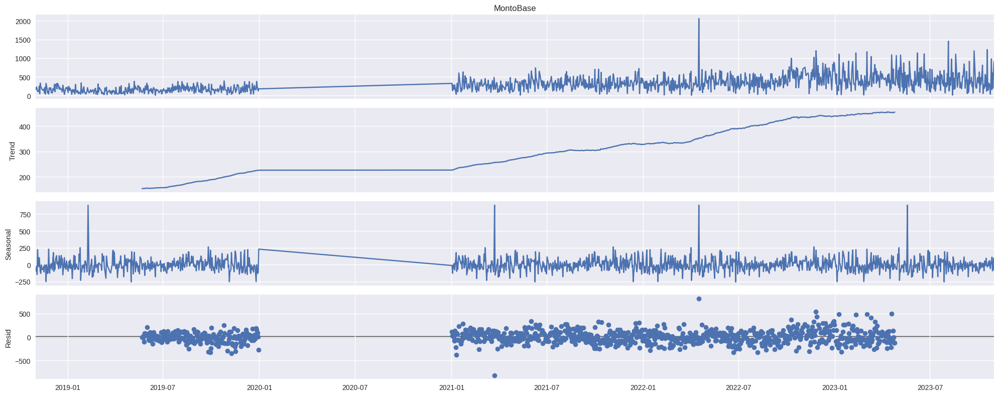

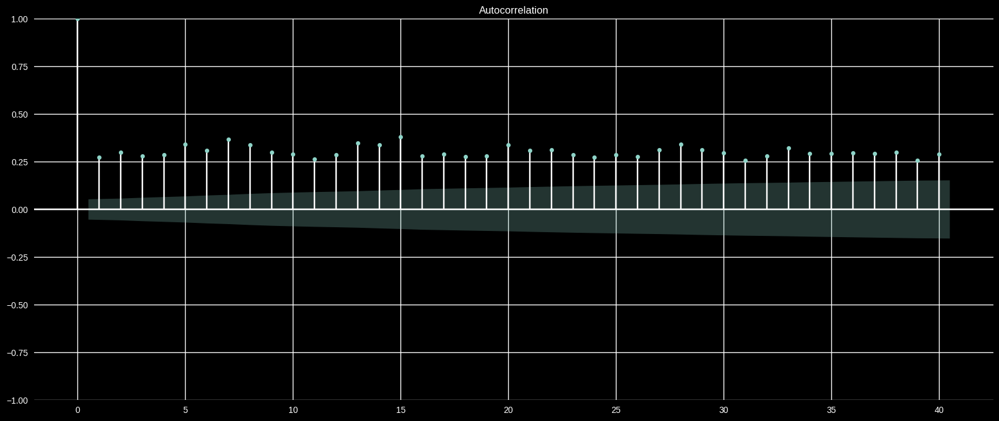

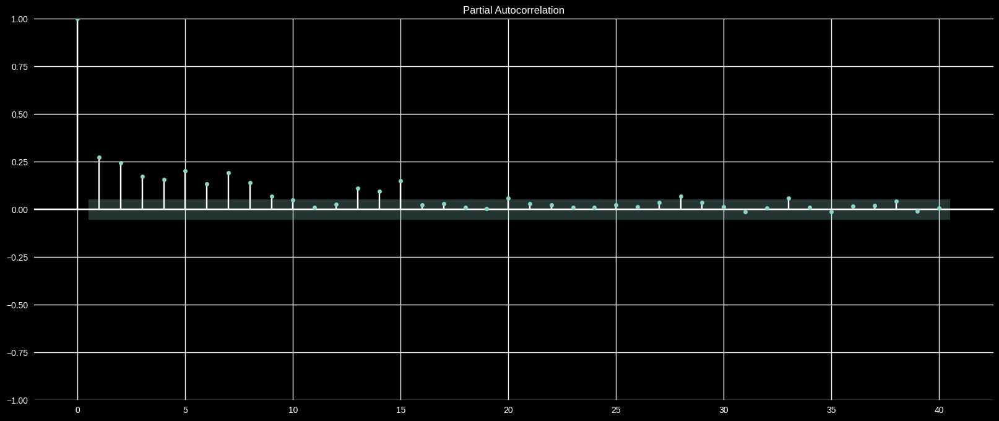

(1319, 2) (31, 2)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=7.07 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=18229.582, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=17827.998, Time=0.54 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=17303.922, Time=3.60 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=18227.583, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=17304.128, Time=1.03 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=4.23 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=17302.479, Time=6.01 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=12.23 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=18230.997, Time=1.17 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=17300.225, Time=9.80 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=17302.390, Time=2.76 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=16.31 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=8.12 sec
 ARIMA(1,1,0)(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/stat

el ultimo indice_valor de los datos reales es: 1319,
se supone que deeria acabar 30 despues, pero la funcion indica: 1348 

2023-10-01   486.9283
2023-10-02   468.5847
2023-10-03   396.9080
2023-10-04   333.5096
2023-10-05   325.6640
2023-10-06   376.4788
2023-10-07   444.7787
2023-10-08   478.3066
2023-10-09   453.5904
2023-10-10   392.1520
2023-10-11   342.0547
2023-10-12   340.4133
2023-10-13   386.0252
2023-10-14   442.2028
2023-10-15   466.1558
2023-10-16   441.4865
2023-10-17   389.1978
2023-10-18   350.0122
2023-10-19   352.7477
2023-10-20   393.2380
2023-10-21   439.1259
2023-10-22   455.6212
2023-10-23   431.7939
2023-10-24   387.5959
2023-10-25   357.2992
2023-10-26   362.9949
2023-10-27   398.5882
2023-10-28   435.8007
2023-10-29   446.5584
2023-10-30   424.0994
Freq: D, Name: ARIMA Predictions PIERNA, dtype: float64

Ventas reales y predicciones ARIMA para PIERNA:
                 MontoBase  P-V_ARIMA_PIERNA
FechaMovimiento                             
2023-11-01        191

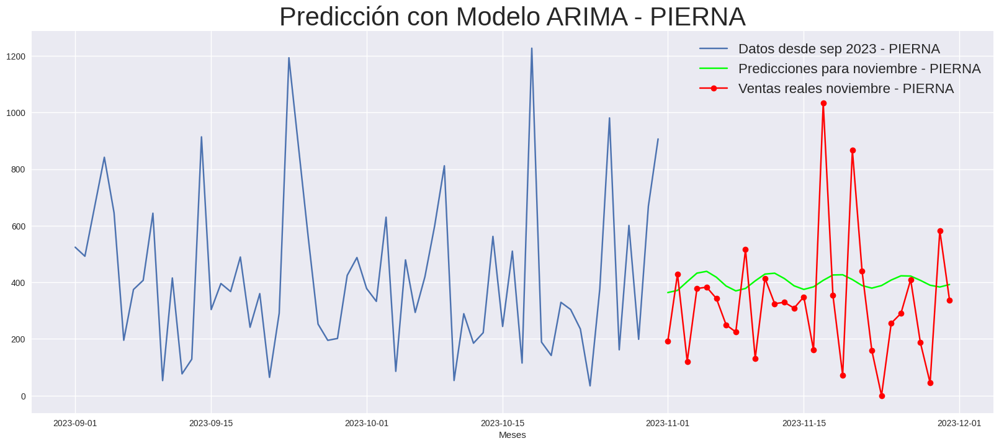

Predicciones para MUSLO:


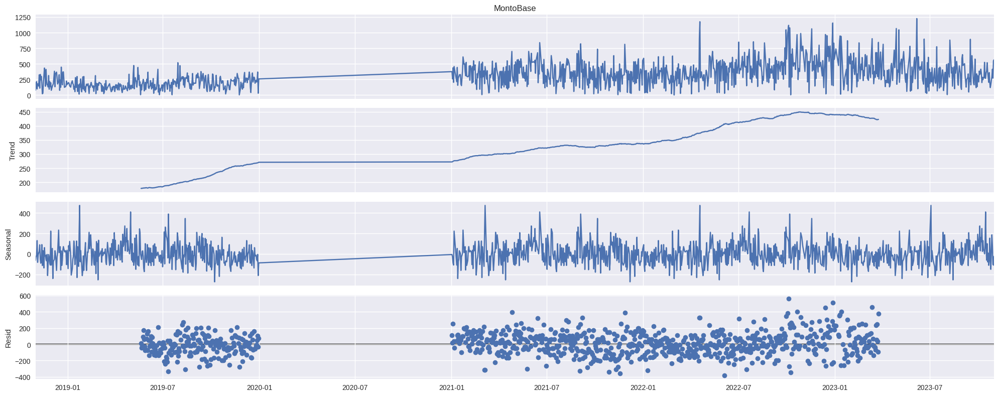

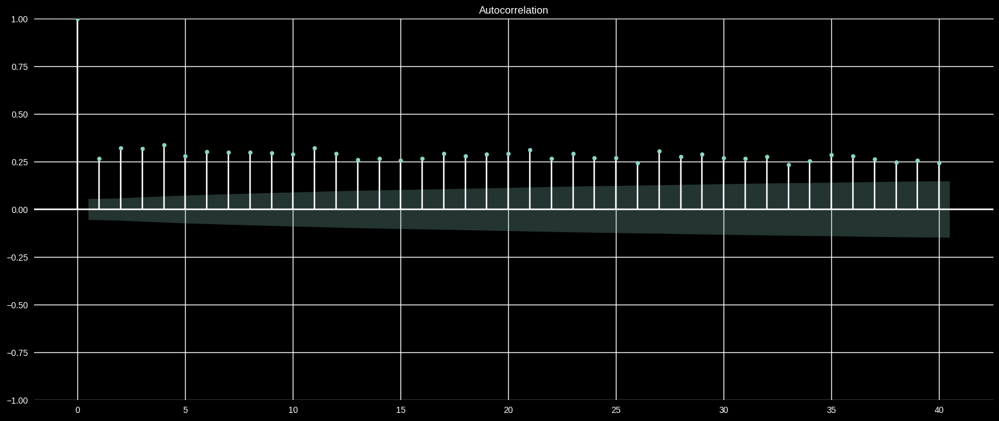

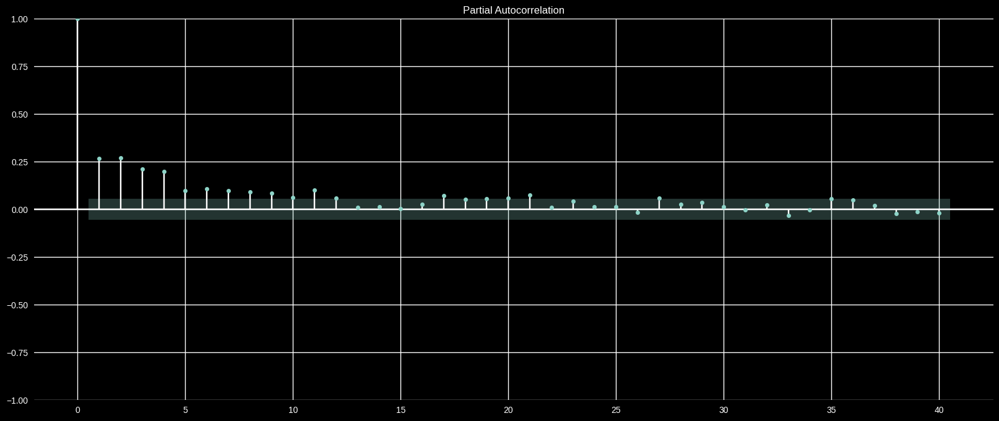

(1242, 2) (31, 2)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=6.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=17138.312, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=16716.072, Time=0.53 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=16278.213, Time=1.92 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17136.313, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=16276.214, Time=0.81 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=16278.213, Time=2.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=16280.210, Time=2.26 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=16274.143, Time=0.79 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=16276.129, Time=2.15 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=16276.129, Time=2.53 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=16278.126, Time=3.62 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=16714.347, Time=0.18 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=16275.602, Time=2.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/

el ultimo indice_valor de los datos reales es: 1242,
se supone que deeria acabar 30 despues, pero la funcion indica: 1271 

2023-09-29   331.0210
2023-09-30   331.5559
2023-10-01   331.5228
2023-10-02   331.5249
2023-10-03   331.5248
2023-10-04   331.5248
2023-10-05   331.5248
2023-10-06   331.5248
2023-10-07   331.5248
2023-10-08   331.5248
2023-10-09   331.5248
2023-10-10   331.5248
2023-10-11   331.5248
2023-10-12   331.5248
2023-10-13   331.5248
2023-10-14   331.5248
2023-10-15   331.5248
2023-10-16   331.5248
2023-10-17   331.5248
2023-10-18   331.5248
2023-10-19   331.5248
2023-10-20   331.5248
2023-10-21   331.5248
2023-10-22   331.5248
2023-10-23   331.5248
2023-10-24   331.5248
2023-10-25   331.5248
2023-10-26   331.5248
2023-10-27   331.5248
2023-10-28   331.5248
Freq: D, Name: ARIMA Predictions MUSLO, dtype: float64

Ventas reales y predicciones ARIMA para MUSLO:
                 MontoBase  P-V_ARIMA_MUSLO
FechaMovimiento                            
2023-11-01        327.888

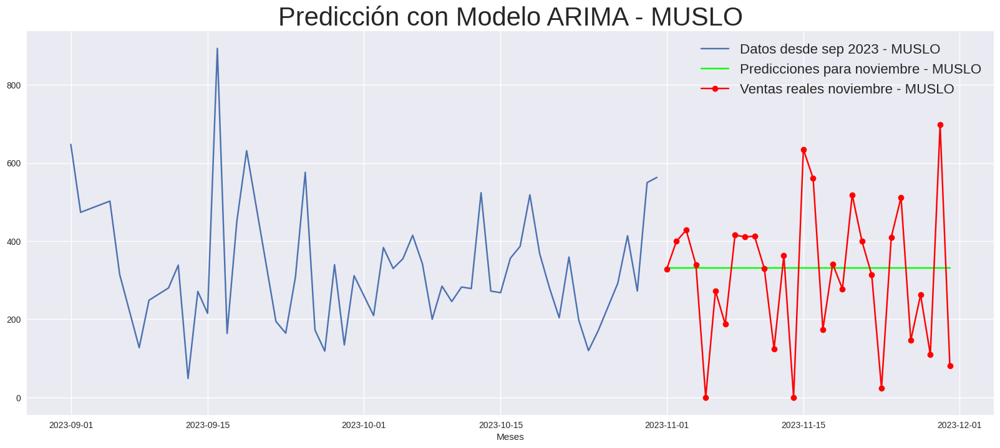

Predicciones para POLLO CON MENUDENCIA H-C:


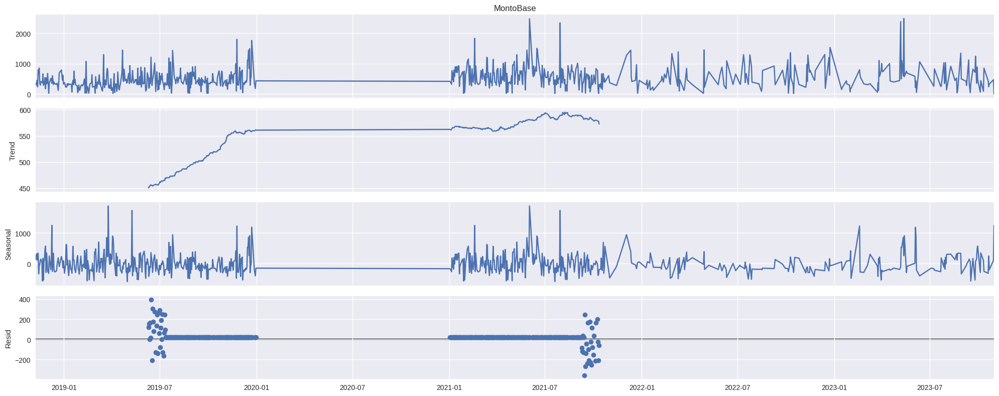

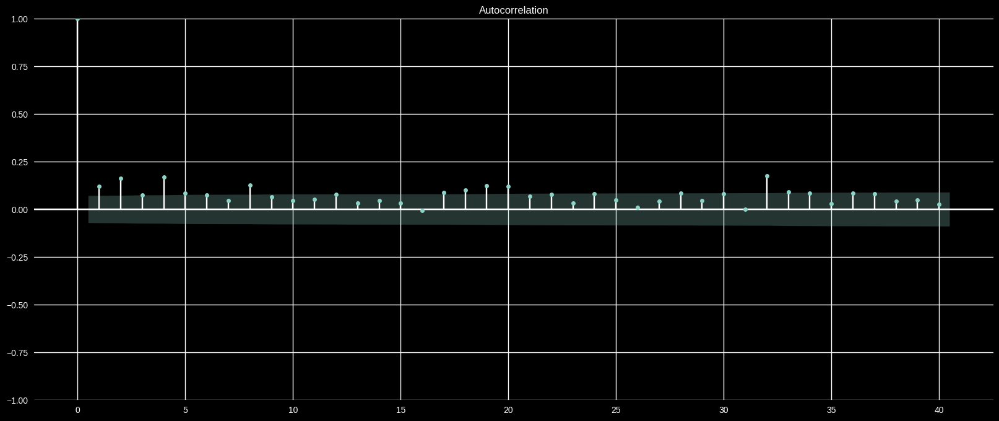

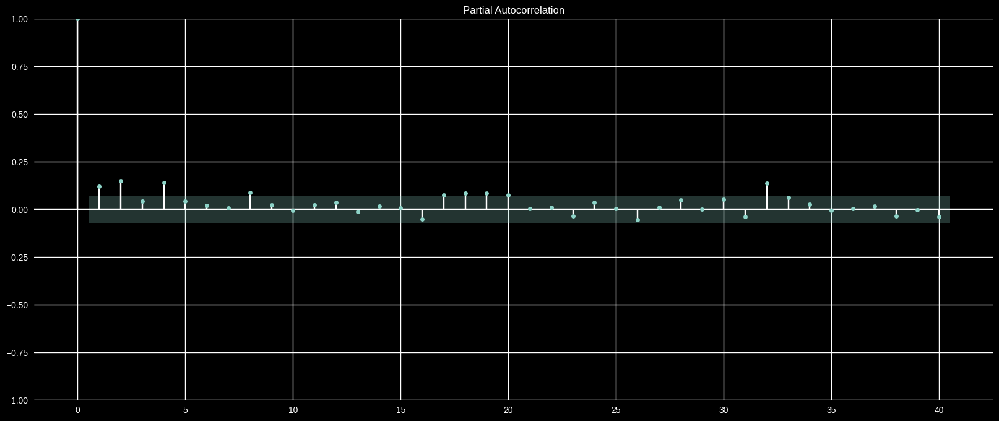

(726, 2) (31, 2)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=10463.002, Time=4.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=10902.777, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=10670.459, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=10466.522, Time=1.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=10900.778, Time=0.03 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=10460.941, Time=5.57 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=10459.013, Time=1.58 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=10460.937, Time=4.12 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=10459.253, Time=1.22 sec
 ARIMA(3,1,2)(0,0,0)[12] intercept   : AIC=10457.414, Time=2.02 sec
 ARIMA(3,1,2)(1,0,0)[12] intercept   : AIC=10460.349, Time=6.44 sec
 ARIMA(3,1,2)(0,0,1)[12] intercept   : AIC=10460.473, Time=4.28 sec
 ARIMA(3,1,2)(1,0,1)[12] intercept   : AIC=10461.863, Time=4.5

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/

el ultimo indice_valor de los datos reales es: 726,
se supone que deeria acabar 30 despues, pero la funcion indica: 755 

2023-07-31   525.3515
2023-08-01   625.7012
2023-08-02   569.4566
2023-08-03   584.4477
2023-08-04   587.5336
2023-08-05   600.2662
2023-08-06   595.3752
2023-08-07   597.8878
2023-08-08   597.7161
2023-08-09   599.3337
2023-08-10   598.8809
2023-08-11   599.2797
2023-08-12   599.2217
2023-08-13   599.4312
2023-08-14   599.3868
2023-08-15   599.4473
2023-08-16   599.4380
2023-08-17   599.4658
2023-08-18   599.4613
2023-08-19   599.4702
2023-08-20   599.4690
2023-08-21   599.4728
2023-08-22   599.4723
2023-08-23   599.4736
2023-08-24   599.4735
2023-08-25   599.4740
2023-08-26   599.4739
2023-08-27   599.4741
2023-08-28   599.4741
2023-08-29   599.4742
Freq: D, Name: ARIMA Predictions POLLO CON MENUDENCIA H-C, dtype: float64

Ventas reales y predicciones ARIMA para POLLO CON MENUDENCIA H-C:
                 MontoBase  P-V_ARIMA_POLLO CON MENUDENCIA H-C
FechaMovimient

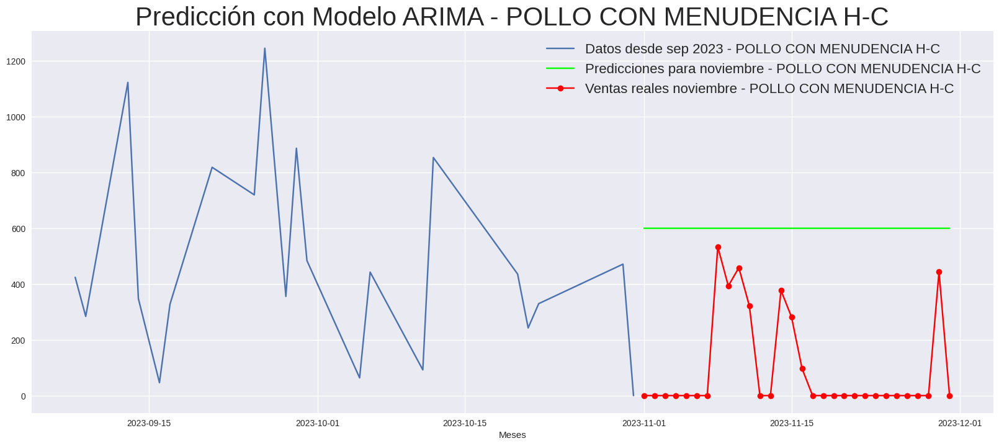

No hay suficientes datos para hacer una predicción con ARIMA para PIERNA MUSLO OFERTA.
Predicciones para ALA PRIMERA:


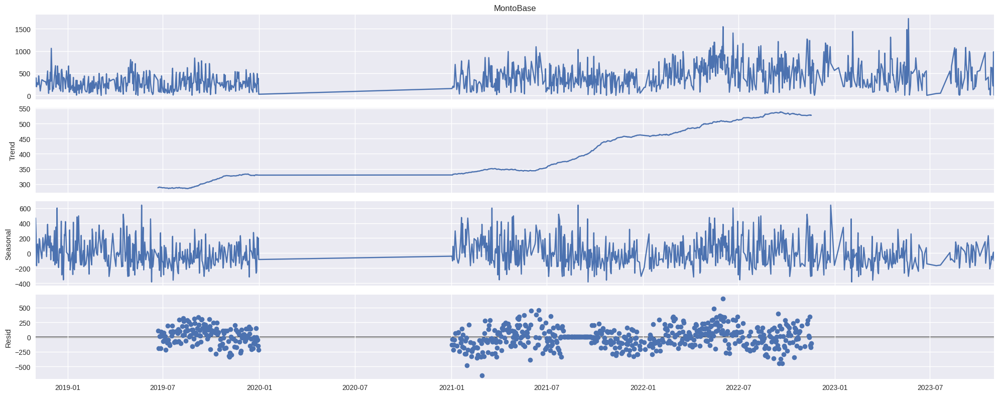

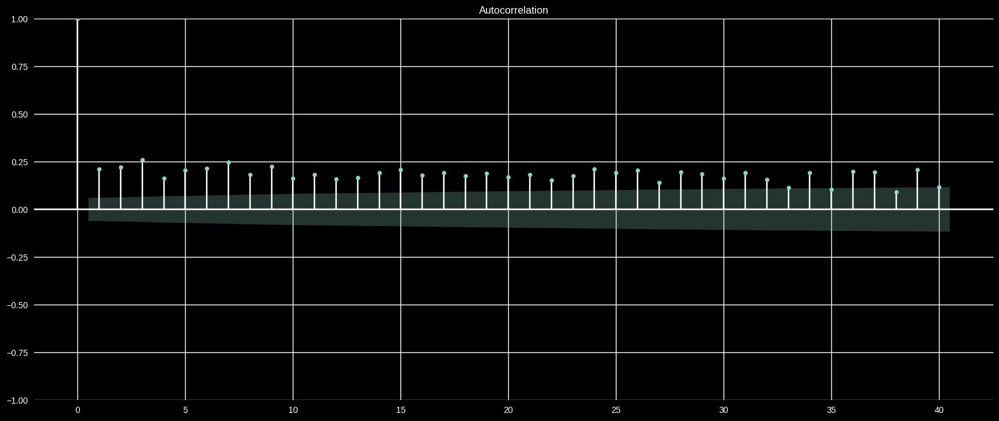

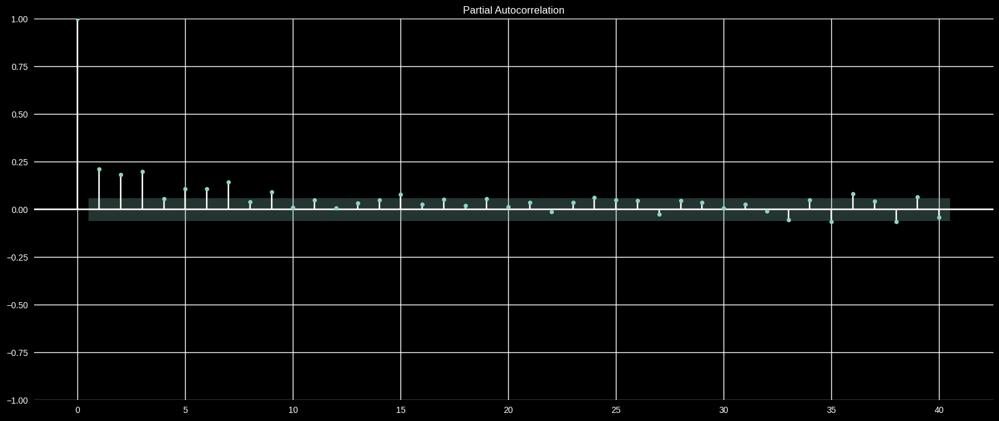

(1021, 2) (31, 2)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=14092.285, Time=5.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=14741.239, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=14437.257, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=14093.144, Time=1.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=14739.240, Time=0.04 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=14091.348, Time=6.92 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=14091.201, Time=1.94 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=14091.066, Time=4.62 sec
 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=14088.724, Time=14.79 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=14089.905, Time=16.81 sec
 ARIMA(1,1,2)(2,0,0)[12] intercept   : AIC=14089.513, Time=11.49 sec
 ARIMA(2,1,1)(2,0,0)[12] intercept   : AIC=14094.569, Time=11.33 sec
 ARIMA(3,1,2)(2,0,0)[12] intercept   : AIC=14087.899, Time=16.13 sec
 ARIMA(3,1,2)(1,0,0)[12] intercept   : AIC=14090.1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/

el ultimo indice_valor de los datos reales es: 1021,
se supone que deeria acabar 30 despues, pero la funcion indica: 1050 

2023-09-06   356.7456
2023-09-07   365.1943
2023-09-08   368.8453
2023-09-09   376.8962
2023-09-10   402.4782
2023-09-11   332.4807
2023-09-12   374.1790
2023-09-13   364.1519
2023-09-14   404.9635
2023-09-15   365.6880
2023-09-16   379.2104
2023-09-17   390.9704
2023-09-18   423.1758
2023-09-19   370.1168
2023-09-20   420.3580
2023-09-21   362.3196
2023-09-22   368.3485
2023-09-23   392.1508
2023-09-24   352.3072
2023-09-25   351.2354
2023-09-26   350.2761
2023-09-27   386.6948
2023-09-28   360.3176
2023-09-29   376.6210
2023-09-30   372.1379
2023-10-01   374.8299
2023-10-02   373.0421
2023-10-03   375.9310
2023-10-04   377.3909
2023-10-05   371.7770
Freq: D, Name: ARIMA Predictions ALA PRIMERA, dtype: float64

Ventas reales y predicciones ARIMA para ALA PRIMERA:
                 MontoBase  P-V_ARIMA_ALA PRIMERA
FechaMovimiento                                  
2

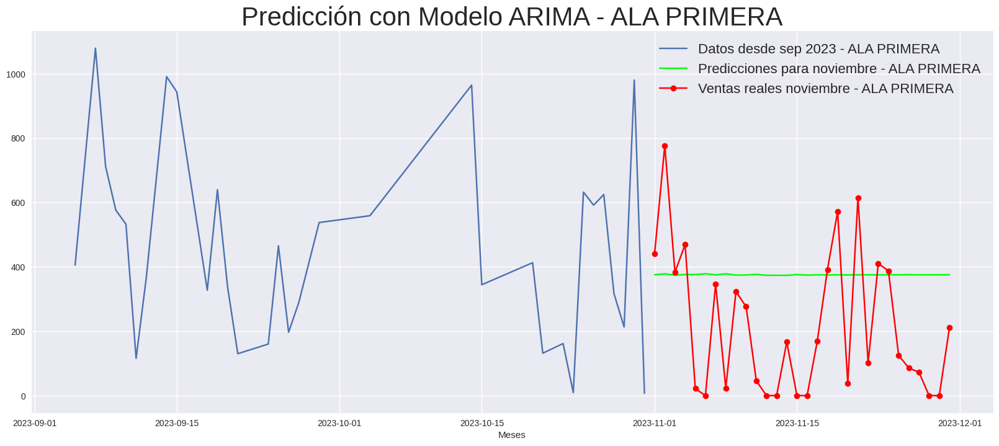

In [55]:
# Configurar tamaño de las figuras
plt.rcParams["figure.figsize"] = (12, 8)

# Iterar sobre los DataFrames en el objeto dfs_de_productos_sumados_arima
arima_models = {}  # Diccionario para almacenar los modelos ARIMA de cada producto

# Iterar sobre los DataFrames en el objeto dfs_de_productos_sumados_arima
for product, product_df_arima in dfs_de_productos_sumados_arima.items():
    if len(product_df_arima) >= 365:
        # Aquí puedes poner el código para realizar la predicción con ARIMA
        print(f"Predicciones para {product}:")
        # Realizar descomposición estacional
        decomposition = seasonal_decompose(product_df_arima["MontoBase"], model="add", period=365)
        decomposition.plot();
        plt.show()

        # Visualizar ACF y PACF
        plt.style.use('dark_background')
        plot_acf(product_df_arima['MontoBase'], lags=40)
        plt.show()

        plot_pacf(product_df_arima['MontoBase'], lags=40)
        plt.show()

        # Dividir en orden cronológico, entrenando sin el mes de octubre
        train_size_arima = int(len(product_df_arima) - 31)
        train_arima, test_arima = product_df_arima[0:train_size_arima], product_df_arima[train_size_arima:]

        print(train_arima.shape, test_arima.shape)

        # Identificar el modelo ARIMA automáticamente
        modelo_auto = auto_arima(train_arima['MontoBase'], seasonal=True, m=12, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True, random_state=20, n_fits=50)
        print(modelo_auto.summary())

        # Configurar el modelo ARIMA
        arima_model = SARIMAX(train_arima["MontoBase"], order=modelo_auto.order, seasonal_order=modelo_auto.seasonal_order)
        arima_result = arima_model.fit()
        arima_models[product] = arima_result  # Guardar el modelo en el diccionario

        # Hacer predicciones con ARIMA
        arima_pred = arima_result.predict(start=len(train_arima), end=len(train_arima) + 29, typ="levels").rename(f"ARIMA Predictions {product}")
        # Crear un índice para las predicciones de noviembre
        november_index = pd.date_range(start=train_arima.index[-1] + pd.DateOffset(1), periods=30)
        arima_pred.index = november_index

        print(f'el ultimo indice_valor de los datos reales es: {len(train_arima)},')
        print(f'se supone que deeria acabar 30 despues, pero la funcion indica: {len(train_arima) + 29} \n')

        # Imprimir las predicciones para el mes de noviembre
        print(arima_pred)

        # Agregar las predicciones al DataFrame original
        if product in arima_models:
            # Hacer predicciones con ARIMA para el DataFrame actual
            arima_pred_full = arima_models[product].predict(start=len(product_df_arima), end=len(product_df_arima) + 29, typ="levels").rename(f"P-V_ARIMA_{product}")

            # Asegurarse de que las predicciones se alineen correctamente con las fechas de noviembre
            arima_pred_full.index = dfs_noviembre_sumados[product].index

            # Agregar la columna de predicciones ARIMA al DataFrame actual
            dfs_noviembre_sumados[product][f"P-V_ARIMA_{product}"] = arima_pred_full

            # Imprimir el resultado
            print(f'\nVentas reales y predicciones ARIMA para {product}:')
            print(dfs_noviembre_sumados[product][['MontoBase', f'P-V_ARIMA_{product}']].head(20))
        else:
            print(f"No hay modelo ARIMA para {product}.")

        # Visualizar las predicciones y los datos reales
        plt.style.use('seaborn')
        plt.rcParams["figure.figsize"] = (20, 8)
        # Datos de venta desde el 1ro de septiembre de 2023
        start_date = '2023-09-01'
        end_date = '2023-11-30'
        plt.plot(product_df_arima.index[product_df_arima.index >= start_date], product_df_arima['MontoBase'][product_df_arima.index >= start_date], label='Datos desde sep 2023 - ' + product)
        # Predicciones para el futuro (noviembre)
        dates_future = pd.date_range(start='2023-11-01', periods=len(arima_pred_full))
        plt.plot(dates_future[:len(arima_pred_full)], arima_pred_full, color="lime", label='Predicciones para noviembre - ' + product)
        real_november_data = dfs_noviembre_sumados[product]
        plt.plot(real_november_data.index, real_november_data['MontoBase'], 'o-', color='red', label='Ventas reales noviembre - ' + product)
        plt.title(f"Predicción con Modelo ARIMA - {product}", fontsize=30)
        plt.xlabel('Meses')
        plt.ylabel('')
        plt.legend(fontsize=16)
        plt.show()
    else:
        print(f"No hay suficientes datos para hacer una predicción con ARIMA para {product}.")

In [56]:
# # Iterar sobre los DataFrames en el objeto dfs_de_productos_sumados_arima
# arima_models = {}  # Diccionario para almacenar los modelos ARIMA de cada producto

# # Seleccionar un solo producto para hacer pruebas
# product = 'POLLO SIN MENUDENCIA H-C'
# product_df_arima = dfs_de_productos_sumados_arima[product]

# if len(product_df_arima) >= 365:
#     # Realizar descomposición estacional
#     decomposition = seasonal_decompose(product_df_arima["MontoBase"], model="add", period=365)
#     decomposition.plot();
#     plt.show()

#     # Visualizar ACF y PACF
#     plt.style.use('dark_background')
#     plot_acf(product_df_arima['MontoBase'], lags=40)
#     plt.show()

#     plot_pacf(product_df_arima['MontoBase'], lags=40)
#     plt.show()

#     # Dividir en orden cronológico, entrenando sin el mes de octubre
#     train_size_arima = int(len(product_df_arima) - 31)
#     train_arima, test_arima = product_df_arima[0:train_size_arima], product_df_arima[train_size_arima:]

#     # Identificar el modelo ARIMA automáticamente
#     modelo_auto = auto_arima(train_arima['MontoBase'], seasonal=True, m=12, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True, random_state=20, n_fits=50)
#     print(modelo_auto.summary())

#     # Configurar el modelo ARIMA
#     arima_model = SARIMAX(train_arima["MontoBase"], order=modelo_auto.order, seasonal_order=modelo_auto.seasonal_order)
#     arima_result = arima_model.fit()
#     arima_models[product] = arima_result  # Guardar el modelo en el diccionario

#     # Hacer predicciones con ARIMA
#     arima_pred = arima_result.predict(start=len(train_arima), end=len(train_arima) + 29, typ="levels").rename(f"ARIMA Predictions {product}")
#     # Crear un índice para las predicciones de noviembre
#     november_index = pd.date_range(start=train_arima.index[-1] + pd.DateOffset(1), periods=30)
#     arima_pred.index = november_index
#     # arima_pred.index = dfs_noviembre_sumados[product]['FechaMovimiento']

#     print(f'el ultimo indice_valor de los datos reales es: {len(train_arima)},')
#     print(f'se supone que deeria acabar 30 despues, pero la funcion indica: {len(train_arima) + 29} \n')

#     # Imprimir las predicciones para el mes de noviembre
#     print(arima_pred)

#     # Agregar las predicciones al DataFrame original
#     if product in arima_models:
#         # Hacer predicciones con ARIMA para el DataFrame actual
#         arima_pred_full = arima_models[product].predict(start=len(product_df_arima), end=len(product_df_arima) + 29, typ="levels").rename(f"P-V_ARIMA_{product}")

#         # Asegurarse de que las predicciones se alineen correctamente con las fechas de noviembre
#         arima_pred_full.index = dfs_noviembre_sumados[product].index

#         # Agregar la columna de predicciones ARIMA al DataFrame actual
#         dfs_noviembre_sumados[product][f"P-V_ARIMA_{product}"] = arima_pred_full

#         # Imprimir el resultado
#         print(f'\nVentas reales y predicciones ARIMA para {product}:')
#         print(dfs_noviembre_sumados[product][['MontoBase', f'P-V_ARIMA_{product}']].head(20))
#     else:
#         print(f"No hay modelo ARIMA para {product}.")

#     # Visualizar las predicciones y los datos reales
#     plt.style.use('seaborn')
#     plt.rcParams["figure.figsize"] = (20, 8)
#     # Datos de venta desde el 1ro de septiembre de 2023
#     start_date = '2023-09-01'
#     end_date = '2023-11-30'
#     plt.plot(product_df_arima.index[product_df_arima.index >= start_date], product_df_arima['MontoBase'][product_df_arima.index >= start_date], label='Datos desde sep 2023 - ' + product)
#     # Predicciones para el futuro (noviembre)
#     dates_future = pd.date_range(start='2023-11-01', periods=len(arima_pred_full))
#     plt.plot(dates_future[:len(arima_pred_full)], arima_pred_full, color="lime", label='Predicciones para noviembre - ' + product)
#     real_november_data = dfs_noviembre_sumados[product]
#     plt.plot(real_november_data['FechaMovimiento'], real_november_data['MontoBase'], 'o-', color='red', label='Ventas reales noviembre - ' + product)
#     plt.title(f"Predicción con Modelo ARIMA - {product}", fontsize=30)
#     plt.xlabel('Meses')
#     plt.ylabel('')
#     plt.legend(fontsize=16)
#     plt.show()
# else:
#     print(f"No hay suficientes datos para hacer una predicción con ARIMA para {product}.")

In [57]:
#print(dfs_de_productos_sumados_arima['POLLO SIN MENUDENCIA H-C'])
print(dfs_noviembre_sumados['POLLO SIN MENUDENCIA H-C'])

                           NombreProducto  MontoBase  \
FechaMovimiento                                        
2023-11-01       POLLO SIN MENUDENCIA H-C  1301.7229   
2023-11-02       POLLO SIN MENUDENCIA H-C  1709.2895   
2023-11-03       POLLO SIN MENUDENCIA H-C   707.2652   
2023-11-04       POLLO SIN MENUDENCIA H-C  1296.7834   
2023-11-05       POLLO SIN MENUDENCIA H-C   772.3420   
2023-11-06       POLLO SIN MENUDENCIA H-C  2467.2758   
2023-11-07       POLLO SIN MENUDENCIA H-C  1066.5938   
2023-11-08       POLLO SIN MENUDENCIA H-C  1110.0792   
2023-11-09       POLLO SIN MENUDENCIA H-C   259.3104   
2023-11-10       POLLO SIN MENUDENCIA H-C     0.0000   
2023-11-11       POLLO SIN MENUDENCIA H-C   766.5036   
2023-11-12       POLLO SIN MENUDENCIA H-C   916.6644   
2023-11-13       POLLO SIN MENUDENCIA H-C   191.7683   
2023-11-14       POLLO SIN MENUDENCIA H-C   955.1658   
2023-11-15       POLLO SIN MENUDENCIA H-C   579.8350   
2023-11-16       POLLO SIN MENUDENCIA H-C   943.

In [58]:
# ESTO ES PARA ELIMINAR LA COLUMA DE PREDICCION DE ARIMA QUE aparecia con 'nan'
# for product, product_df in dfs_noviembre_sumados.items():
#     product_df.drop(columns=[f'P-V_ARIMA_{product}'], inplace=True)
#     print(product_df)


## Evaluar ARIMA

In [59]:
for product, product_df in dfs_noviembre_sumados.items():
    # print(product_df.head(30))

    # Verificar si la columna 'P-V_ARIMA_{product}' existe
    if f'P-V_ARIMA_{product}' in dfs_noviembre_sumados[product].columns:
        print(f'evaluacion del producto: {product}')
        # Puedes acceder a cada DataFrame individualmente para realizar evaluaciones métricas
        evaluacion_metrica(
            dfs_noviembre_sumados[product]['MontoBase'],
            dfs_noviembre_sumados[product][f'P-V_ARIMA_{product}']
        )
        print('\n')
    else:
        print(f"No hay predicciones para {product}.")

evaluacion del producto: POLLO ESPECIAL
Evaluation metric results:  
MSE is : 687197.406850219
MAE is : 625.4050066026846
R2 is : -0.8920598296304276 %
------------------------------
RMSE is : 828.9737069715896
MAPE is : 102.09287029373233 %
------------------------------
------------------------------
Días reales calculados: 29
Días omitidos: 1
Total de días: 30
------------------------------




evaluacion del producto: POLLO SIN MENUDENCIA H-C
Evaluation metric results:  
MSE is : 420113.9674571512
MAE is : 556.0376418676543
R2 is : -0.7196073955386832 %
------------------------------
RMSE is : 648.1619916788944
MAPE is : 120.91322879333023 %
------------------------------
------------------------------
Días reales calculados: 29
Días omitidos: 1
Total de días: 30
------------------------------




evaluacion del producto: PECHUGA
Evaluation metric results:  
MSE is : 119652.13644879193
MAE is : 287.6482974034852
R2 is : -0.030039658532793112 %
------------------------------
RMSE is

Cómo interpretar las gráficas de residuos en el modelo ARIMA


# PREDICCIONES
### Graficos y valores calculados de (todos) los productos


<ipython-input-60-18dcb7d60c8b>:5: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


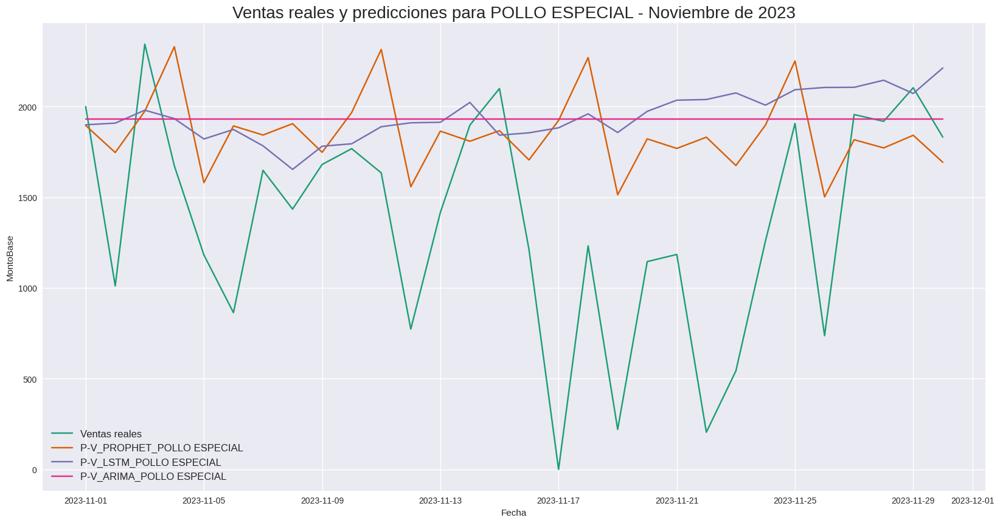

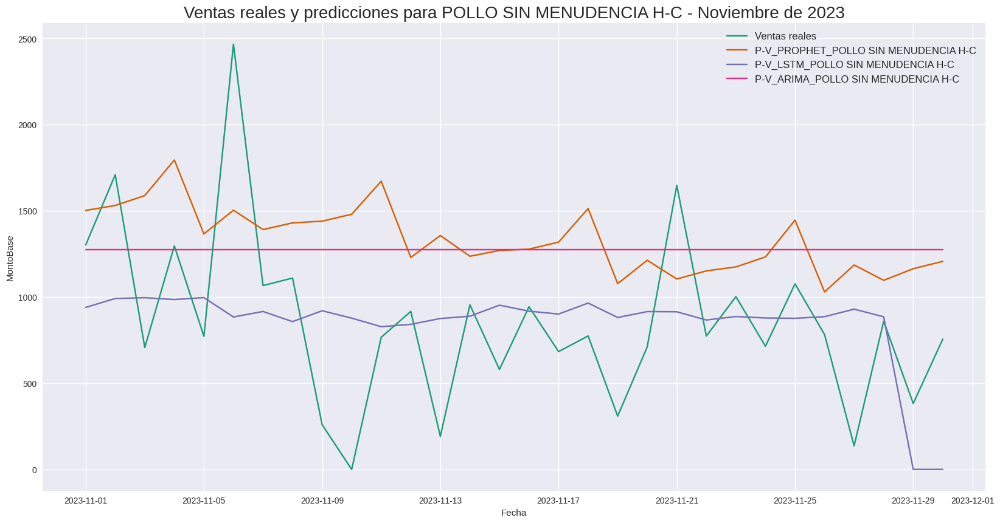

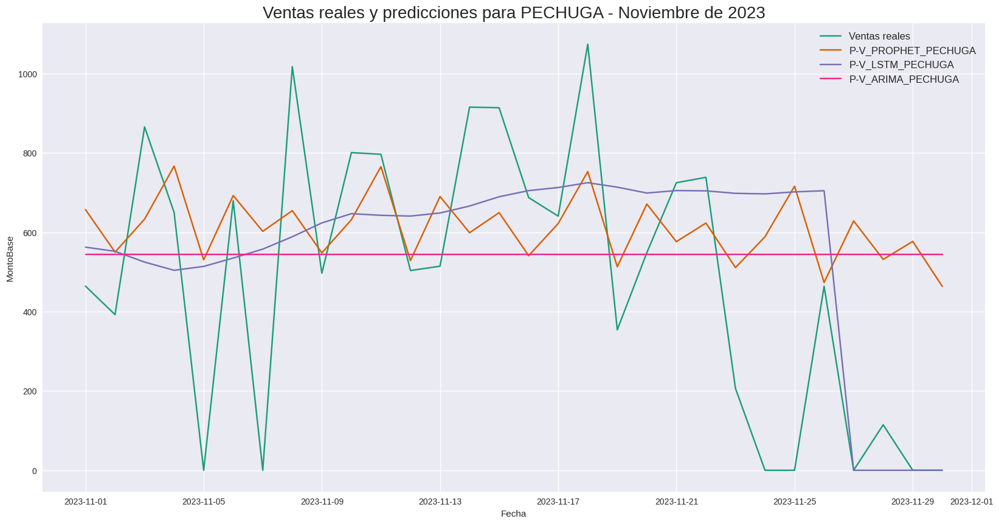

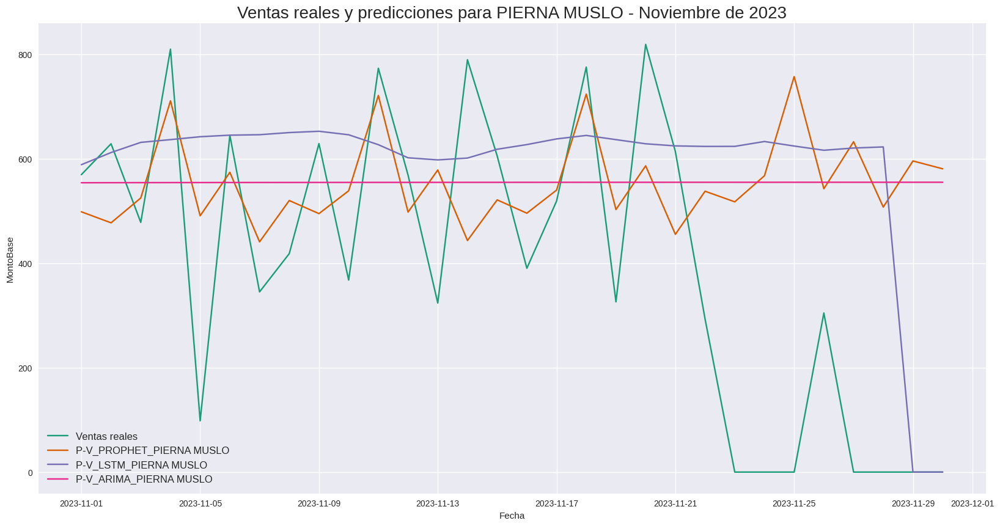

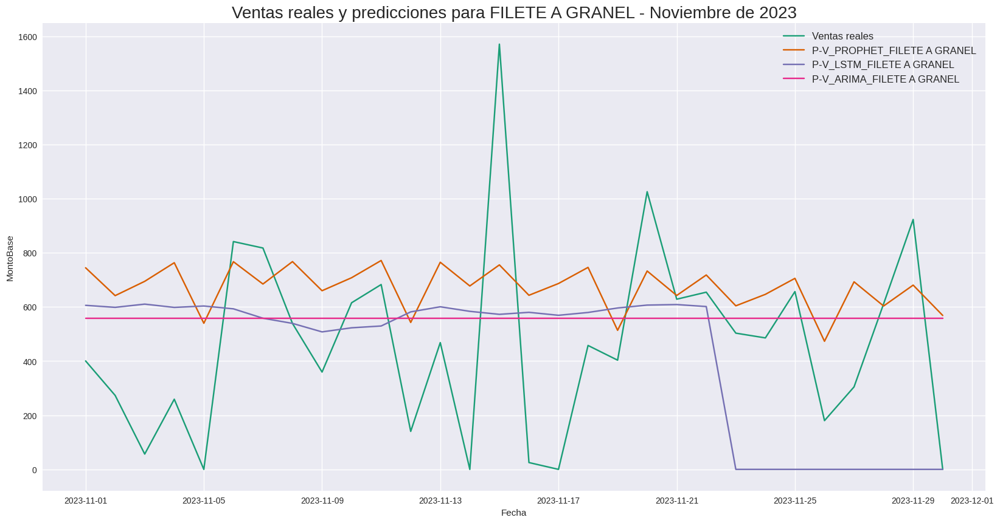

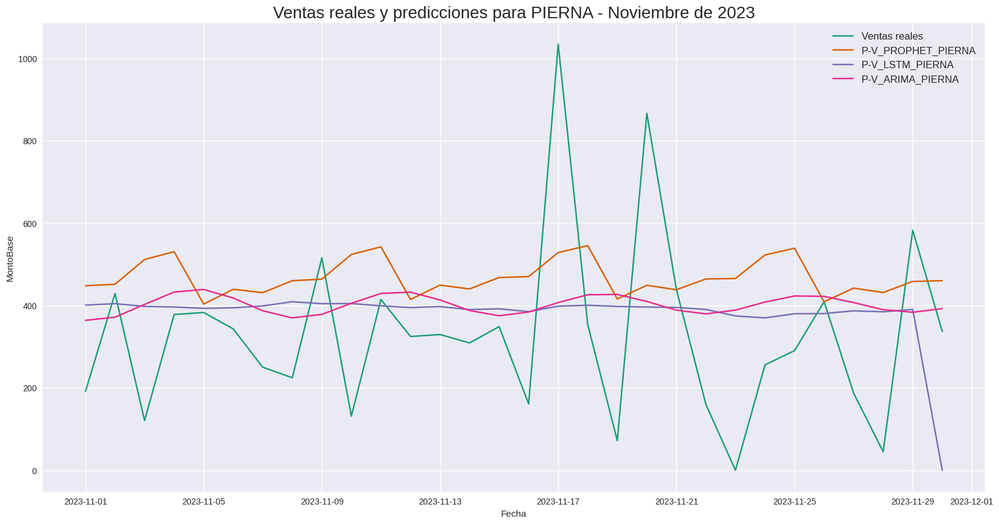

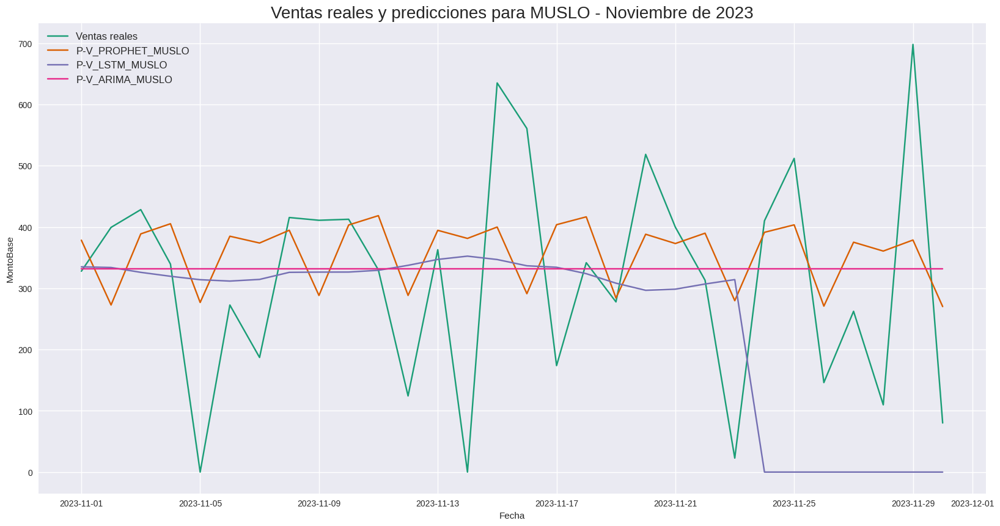

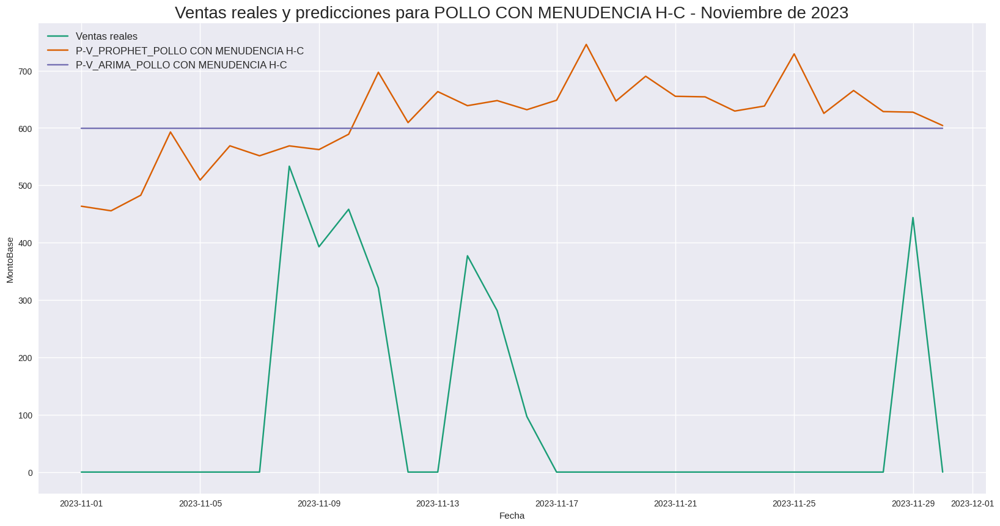

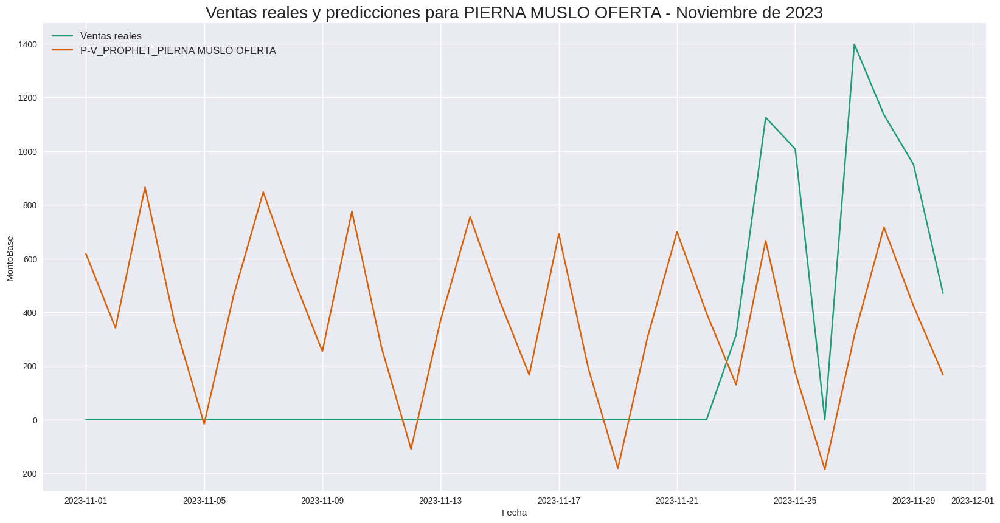

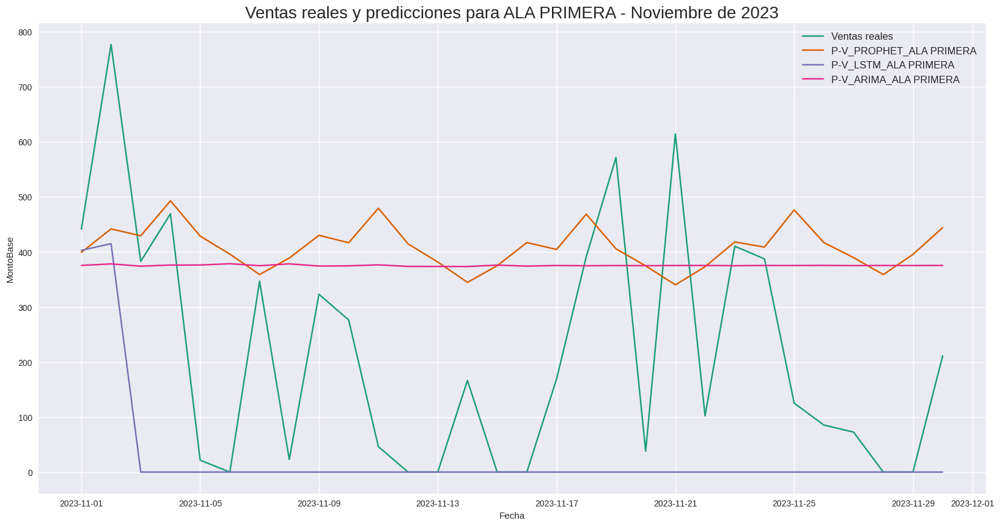

In [60]:
# Obtener la lista de productos
productos = list(dfs_noviembre_sumados.keys())

# Configurar el gráfico
plt.style.use('seaborn')
sns.set_palette("Dark2")
# Iterar sobre los productos
for product in productos:
    # Obtener los datos del producto actual
    product_data = dfs_noviembre_sumados[product]

    # Verificar si hay predicciones disponibles para el producto
    predicciones_disponibles = [col for col in product_data.columns if 'P-V_' in col]

    if not predicciones_disponibles:
        # No hay predicciones disponibles para el producto, omitir el gráfico
        continue

    # Configurar el gráfico para el producto actual
    plt.figure(figsize=(20, 10))
    plt.plot(product_data.index, product_data['MontoBase'], label='Ventas reales')

    # Graficar todas las predicciones disponibles
    for pred in predicciones_disponibles:
        plt.plot(product_data.index, product_data[pred], label=pred)

    # Configurar etiquetas y leyenda
    plt.title(f'Ventas reales y predicciones para {product} - Noviembre de 2023', fontsize=20)
    plt.xlabel('Fecha')
    plt.ylabel('MontoBase')
    plt.legend(fontsize=12)
    plt.show()

In [61]:
# Iterar sobre los productos
for product, product_df in dfs_noviembre_sumados.items():
    print(f'Evaluación del producto: {product}')

    # Verificar si hay predicciones disponibles para el producto
    predicciones_disponibles = [col for col in product_df.columns if 'P-V_' in col]

    if not predicciones_disponibles:
        # No hay predicciones disponibles para el producto
        print(f"No hay predicciones para {product}.")
        continue

    # Calcular métricas de evaluación para cada predicción disponible
    for pred in predicciones_disponibles:
        # Extraer el nombre del modelo de la columna de predicciones
        nombre_modelo = pred.split('_')[1]

        y_real = product_df['MontoBase']
        y_pred = product_df[pred]

        print(f'Modelo: {nombre_modelo}')
        evaluacion_metrica(y_real, y_pred)

    print("\n\n")

Evaluación del producto: POLLO ESPECIAL
Modelo: PROPHET
Evaluation metric results:  
MSE is : 554689.513138053
MAE is : 588.7122863920775
R2 is : -0.5272259983287724 %
------------------------------
RMSE is : 744.7748069974259
MAPE is : 88.49089113815374 %
------------------------------
------------------------------
Días reales calculados: 29
Días omitidos: 1
Total de días: 30
------------------------------


Modelo: LSTM
Evaluation metric results:  
MSE is : 706023.466414493
MAE is : 635.013849700521
R2 is : -0.9438935977685492 %
------------------------------
RMSE is : 840.2520255342995
MAPE is : 104.0061764071006 %
------------------------------
------------------------------
Días reales calculados: 29
Días omitidos: 1
Total de días: 30
------------------------------


Modelo: ARIMA
Evaluation metric results:  
MSE is : 687197.406850219
MAE is : 625.4050066026846
R2 is : -0.8920598296304276 %
------------------------------
RMSE is : 828.9737069715896
MAPE is : 102.09287029373233 %
